# Hiearchical Clustering Method

Hierarchical clustering method on the Royal Commissions Round3, Round4, Round5 hearings data.

To run this file, you need have stop.txt file that is provided in the Github repository.

Run the code from top to bottom to see the same results.

 - Section 1: Import libraries.

 - Section 2: Import data and extract content.

 - Sections 3-7: Define functions.

 - Sections 8: Show results (Top features, top sentences, features network)

## 1. Import Libraries

In [176]:
import json
import numpy as np
import pandas as pd
import nltk
import re
from sklearn import feature_extraction
import matplotlib.pyplot as plt
from nltk import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics.pairwise import cosine_similarity
from scipy.cluster.hierarchy import ward, dendrogram
from scipy.cluster.hierarchy import fcluster


# Uncomment if you have not downloaded 'punkt' and 'wordnet'
#nltk.download('punkt') 
#nltk.download('wordnet')

from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import wordnet as wn 
from nltk.stem import WordNetLemmatizer


from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

import plotly.offline as offline
import plotly.graph_objs as go

offline.init_notebook_mode()

import networkx as nx

## 2. Import Data and Extract Content
The data for each hearing round should be stored in separate folders. 
Each round contains 5 json files.
Folder and file names should be created as shown below:

parent(specify the path to the parent directory)<br>
|--r3 (folder)<br>
|--|--1.json<br>
|--|--2.json<br>
|--|--3.json<br>
|--|--4.json<br>
|--|--5.json<br>
|--r4 (folder)<br>
|--|--1.json<br>
|--|--2.json<br>
|--|--3.json<br>
|--|--4.json<br>
|--|--5.json<br>
|--r5 (folder)<br>
|--|--1.json<br>
|--|--2.json<br>
|--|--3.json<br>
|--|--4.json<br>
|--|--5.json<br>
    

In [4]:
# Extract data from the json files for Round 3, 4, and 5.
# Modify file path

data_r3 = []
data_r4 = []
data_r5 = []
for i in range(3, 6):
    for j in range(1, 6):
        with open('/Users/minoh/Documents/Usyd2018-2/COMP5703_Capstone/data/r%d/%d.json'%(i, j),'r') as d:  #modify path
            tem_data = json.load(d)
        if i == 3:
            data_r3.extend(tem_data['result']['docs'])
        elif i == 4:
            data_r4.extend(tem_data['result']['docs'])
        else:
            data_r5.extend(tem_data['result']['docs'])
    

In [5]:
# Original length
print(len(data_r3))  #1501
print(len(data_r4))  #1459
print(len(data_r5))  #1989

1501
1459
1989


In [6]:
# Delete duplicate json objects

def deleteDuplicate(data):
    all_data = [ each['content'] for each in data ] 
    unique = [ data[ all_data.index(id) ] for id in sorted(set(all_data)) ]
    return unique


In [7]:
unique_r3 = deleteDuplicate(data_r3)
unique_r4 = deleteDuplicate(data_r4)
unique_r5 = deleteDuplicate(data_r5)

# Length after deleting duplicates
print(len(unique_r3)) #661
print(len(unique_r4)) #620
print(len(unique_r5)) #880


661
620
880


In [31]:
# Extract only the 'content' parts from the json objects

def extractContent(round_n):
    content = []
    title = []
    for i in range(len(round_n)):
        if 'content' in round_n[i]:
            content.append(round_n[i]['content'])
        if 'title' in round_n[i]:
            title.append(round_n[i]['title'])
    return content, title

In [32]:
content_r3, title_r3 = extractContent(unique_r3)
content_r4, title_r4 = extractContent(unique_r4)
content_r5, title_r5 = extractContent(unique_r5)


In [100]:
# for checking if it's extracted
#print(len(content_r3))

In [99]:
#print(content_r3[0])

## 3. Preprocessing and Tokenizing

### 3.1. Data Cleaning
First preprocessing step is to remove less meaningful text which may add noise when clustering the documents, such as numbers, document headings, urls, emails and titles. 

In [76]:
# Clean content

def clean_text(text_list):
    """
    Take a text_list as an argument and 
    replace numbers,
    remove parsing noise,
    return a cleaned text list.
    
    """
    clean_text = []
    clean = []
    for text in text_list:
        text = text.replace("'s", "")
        t = re.sub("[0-9]+", "", text) #replace numbers
        t = re.sub("(Politics|Business|World|National|Sport|Entertainment|Lifestyle|Money|Environment) (Show|Hide) subsections", "", t)
        t = re.sub("WAtoday", "", t)
        t = re.sub("The Sydney Morning Herald", "", t)
        t = re.sub("(Exclusive|Opinion) Normal text", "", t)
        t = re.sub("Normal text", "", t)
        t = re.sub("sizeLarger", "", t)
        t = re.sub("text sizeVery", "", t)
        t = re.sub("large text size", "", t)
        t = re.sub("Skip to sections navigation", "", t)
        t = re.sub("Skip to content", "", t)
        t = re.sub("Skip to footer", "", t)
        t = re.sub("Open Menu", "", t)
        t = re.sub("Replay Video", "", t)
        t = re.sub("Play Video", "", t)
        t = re.sub("Playing in 5 ... Don't Play", "", t)
        t = re.sub("Playing in  ... Don't Play", "", t)
        t = re.sub("LoadingPlaying in  ...Don't Play", "", t)
        t = re.sub("Latest in Video", "", t) 
        t = re.sub("\nLoading \n", "", t)
        t = re.sub("Most Popular  \nLoading", "", t)
        t = re.sub("http:\/\/[\w\.]+", "", t) #remove web addresses
        t = re.sub("\/\/[\w\.]+", "", t) #remove web addresses
        t = re.sub("[\w.]*@[\w.]+", "", t) #remove emails or twitter accounts
        t = re.sub("Mr |Ms |Mrs ", "", t)
        t = re.sub("INDEX", "", t)
        t = re.sub("SECTION  CENTRIFY CORPORATION (FINANCIALS|PROFILE|RANKING|PATENTS)", "", t)
        t = re.sub("SECTION  PRESS RELEASES:", "", t)
        t = re.sub("SUMMARY", "", t)
        t = re.sub("PermID:", "", t)
        t = re.sub("Website:", "", t)
    
        clean.append(t)
    clean_text.extend(clean)
    
    return clean_text

In [247]:
# Delete if the content is too short

def deleteShortContent(content):
    new_content = []
    for text in content:
        if len(text) > 300:
            new_content.append(text)
        #else:
            #print("======Deleted short text=======")
            #print(text)
    return new_content

### 3.2. Stopwords, Stem, Remove Names and Tokenize

Next, create 5 differnt tokenizers, and each of them contains different preprocessing steps.

<li>
    <ul><b>tokenize_stopwords</b>: remove stopwords and tokenize</ul>
    <ul><b>tokenize_stopwords_stem</b>: remove stopwords, stem and tokenize</ul>
    <ul><b>tokenize_stopwords_noname</b>: remove stopwords, remove people's names and tokenize</ul>
    <ul><b>tokenize_stopwords_stem_noname</b>: remove stopwords, stem, remove people's names and tokenize</ul>
    <ul><b>tokenize_stopwords_lemma_noname</b>: remove stopwords, lemmatise, remove people's names and tokenize</ul>
</li>

The reason for creating different tokenziers is to experiment clustering and classification (later in the process to identify informative features) model with different tokenizers. There is possiblity that unstemmed words are more meaningful to the clusters, and there is also possibilit that some people's names are meaningful to the clusters.

NB 1: NLTK stopwords and sklear stopwords have different sets.
To include all stopwords from both sets, we first remove NLTK stop words from the tokenizer, then remove sklearn stopwords from tf-idf vectorizer later. 

NB 2: People's names are extracted by applying Standford Named Entity tagger on the docuemnts.


In [35]:
# Tokenizer 1: remove stopwords and tokenize

def tokenize_stopwords(text):
    # tokenize by sentence level, then word level
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    
    filtered_tokens = []
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    
    stopWords = set(nltk.corpus.stopwords.words('english'))
    stopwordsFiltered = []
    
    for w in filtered_tokens:
        if w not in stopWords:
            stopwordsFiltered.append(w)
    
    return(stopwordsFiltered)

In [36]:
# Tokenizer 2: remove stopwords, stem and tokenize

def tokenize_stopwords_stem(text):
    # tokenize by sentence level, then word level
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    
    filtered_tokens = []
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    
    stopWords = set(nltk.corpus.stopwords.words('english'))
    stopwordsFiltered = []
    
    for w in filtered_tokens:
        if w not in stopWords:
            stopwordsFiltered.append(w)
            
    stemmer = SnowballStemmer("english")
    stems = [stemmer.stem(t) for t in stopwordsFiltered]
    
    return(stems)

In [37]:
# Tokenizer 3: remove stopwords, remove people's names and tokenize

def tokenize_stopwords_noname(text):
    # tokenize by sentence level, then word level
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    
    name_filtered_tokens = []
    for token in tokens:
        if token not in name_list:
            name_filtered_tokens.append(token)
    
    filtered_tokens = []
    for word in name_filtered_tokens:
        if re.search('[a-zA-Z]', word):
            filtered_tokens.append(word)
    
    stopWords = set(nltk.corpus.stopwords.words('english'))
    
    stopwordsFiltered = []
    for w in filtered_tokens:
        if w not in stopWords:
            stopwordsFiltered.append(w)
    
    return(stopwordsFiltered)

In [38]:
# Tokenizer 4: remove stopwords, stem, remove people's names and tokenize

def tokenize_stopwords_stem_noname(text):
    # tokenize by sentence level, then word level
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    
    name_filtered_tokens = []
    for token in tokens:
        if token not in name_list:
            name_filtered_tokens.append(token)
    
    filtered_tokens = []
    for word in name_filtered_tokens:
        if re.search('[a-zA-Z]', word):
            filtered_tokens.append(word)
    
    stopWords = set(nltk.corpus.stopwords.words('english'))
    
    stopwordsFiltered = []
    for w in filtered_tokens:
        if w not in stopWords:
            stopwordsFiltered.append(w)
    
    stemmer = SnowballStemmer("english")
    stems = [stemmer.stem(t) for t in stopwordsFiltered]
    
    return(stems)

In [39]:
# Tokenizer 5: remove stopwords, lemmatise, remove people's names and tokenize

def tokenize_stopwords_lemma_noname(text):
    # tokenize by sentence level, then word level
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    
    name_filtered_tokens = []
    for token in tokens:
        if token not in name_list:
            name_filtered_tokens.append(token)
    
    filtered_tokens = []
    for word in name_filtered_tokens:
        if re.search('[a-zA-Z]', word):
            filtered_tokens.append(word)
    
    stopWords = set(nltk.corpus.stopwords.words('english'))
    
    stopwordsFiltered = []
    for w in filtered_tokens:
        if w not in stopWords:
            stopwordsFiltered.append(w)
    
    wordnet_lemmatizer = WordNetLemmatizer()
    lemmas = [wordnet_lemmatizer.lemmatize(w) for w in stopwordsFiltered]
    
    return(lemmas)

In [40]:
# The list contatins the people's names extracted from Standford NER tagger
R3_names = ['perry', 'kowalski', 'derryn', 'hotman', 'tobin', 'rod', 'sean', 'hearing', 'wilkinson', 'woods', 'dillion', 'guy', 'jaye', 'sumic', 'erdogan', 'oster', 'darren', 'wise', 'cj', 'emanuel', 'greaves', 'garnaut', 'jane', 'mcauley', 'waraker', 'doueihi', 'michaelia', 'hans', 'freehills', 'pyrah', 'towers', 'mirabella', 'meller', 'kym', 'cr', 'hewitt', 'phil', 'beau', 'bowerman', 'phillip', 'hunt', 'green', 'waugh', 'kofman', 'shaw', 'sowerby', 'hawes', 'welsh', 'lifson', 'enrique', 'fazzino', 'jacinta', 'commissions', 'zahos', 'dakoza', 'ludwig', 'sanden', 'niki', 'yasmin', 'jessica', 'todd', 'fiona', 'harvey', 'stuart', 'queanbeyan', 'salvini', 'weston', 'dawsey', 'jed', 'carman', 'jonesbanks', 'innes', 'saunders', 'field', 'parker', 'townsend', 'bondi', 'rosario', 'giovas', 'scott', 'obama', 'mccrae', 'ellinghausen', 'brennan', 'laura', 'von', 'kayum', 'arkady', 'sammy', 'felix', 'william', 'mallard', 'winston', 'ricketson', 'watts', 'dobinson', 'dias', 'doherty', 'justine', 'gina', 'dickens', 'jakarta', 'carnell', 'ibrahim', 'd', 'lacey', 'arthur', 'ernest', 'k', 'slonim', 'oliver', 'byers', 'xi', 'fred', 'milne', 'lurie', 'ellis', 'cb', 'karl', 'de', 'halton', 'kimberley', 'curran', 'neil', 'johnston', 'callam', 'hewett', 'mantle', 'makepeace', 'owen', 'bentham', 'fergus', 'ronngard', 'jeff', 'fink', 'chung', 'williams', 'brooks', 'daryl', 'falinski', 'breunig', 'brooke', 'racine', 'bernard', 'damian', 'gillard', 'healy', 'freier', 'quinlivan', 'xero', 'deutsch', 'usman', 'show', 'reno', 'damon', 'joseph', 'satteo', 'mousina', 'joe', 'okotel', 'wilcox', 'danny', 'gormann', 'sloan', 'fenton', 'donna', 'gallacher', 'bloxham', 'greiner', 'cormann', 'michell', 'saul', 'sandra', 'paletta', 'herbert', 'ernst', 'tristan', 'bone', 'enoch', 'nihad', 'janine', 'madison', 'morgan', 'jae', 'rourke', 'comyn', 'bond', 'fitzpatrick', 'kris', 'inglewood', 'santos', 'adley', 'zappone', 'briggs', 'shepherd', 'jodee', 'capurso', 'roth', 'moshal', 'hinchliffe', 'howes', 'emily', 'rebecca', 'sakar', 'ziad', 'ibrahims', 'clark', 'ilise', 'lachlan', 'trudeau', 'neill', 'johnson', 'z', 'stephen', 'kramer', 'fairy', 'wong', 'pendal', 'dalby', 'luther', 'griffiths', 'ardern', 'haynes', 'kumar', 'johnstone', 'pearson', 'winton', 'klein', 'mount', 'humphrey', 'paula', 'vrisakis', 'mckeown', 'redman', 'lyndon', 'medcraft', 'anthony', 'laidlaw', 'rick', 'effie', 'tell', 'hutchinson', 'holden', 'roddan', 'bret', 'bernadette', 'mcinnes', 'graham', 'massola', 'culleton', 'turnbull', 'steven', 'pru', 'lewis', 'blow', 'wardley', 'asher', 'trent', 'mckone', 'long', 'baumann', 'lepidico', 'gary', 'you', 'obe', 'ronald', 'iqbal', 'messih', 'bishop', 'frits', 'norm', 'symonds', 'henderson', 'hardie', 'liz', 'hartcher', 'recognise', 'dent', 'rynne', 'byres', 'anne', 'barns', 'merkel', 'lazard', 'cobbold', 'paphazy', 'khadem', 'netwealth', 'evans', 'ilana', 'fergie', 'hansard', 'murphy', 'sasha', 'parkdale', 'huljich', 'holmes', 'laube', 'wendy', 'kruszelnicki', 'faruqui', 'gupta', 'cathie', 'sukkar', 'leyonhjelm', 'gately', 'shi', 'miranda', 'virginia', 'daniel', 'hyams', 'kevin', 'roberts', 'collins', 'photo', 'mcgowan', 'wakefield', 'ascui', 'vp', 'hubert', 'razer', 'goanna', 'robinson', 'tang', 'mcarthur', 'dunckley', 'desmond', 'antic', 'carole', 'goldspring', 'elliot', 'megan', 'whitehead', 'kuala', 'sodichan', 'webster', 'deloitte', 'beasley', 'kent', 'dennis', 'hatch', 'waverley', 'diane', 'fletcher', 'dyson', 'seck', 'anderson', 'khoury', 'centuria', 'oil', 'northcote', 'berejiklian', 'b', 'bargenquast', 'roskam', 'thurstans', 'romulo', 'whyte', 'echonetdaily', 'macrae', 'federica', 'carlin', 'carlton', 'hilary', 'let', 'leigh', 'hi', 'jevtovic', 'jarman', 'keating', 'brown', 'schilling', 'vesna', 'julian', 'michelle', 'pritchard', 'lumpur', 'alighieri', 'retirees', 'downs', 'zirnsak', 'carillion', 'graeme', 'nassim', 'bevan', 'moss', 'bairnsdale', 'kluss', 'fri', 'marriages', 'milroy', 'ting', 'corbally', 'brenner', 'fegan', 'victoria', 'replay', 'fifield', 'nicholas', 'brandeis', 'al', 'natale', 'griff', 'colin', 'aaron', 'exposto', 'rachel', 'ranson', 'lite', 'louise', 'moura', 'mostyn', 'kin', 'oquist', 'stephanie', 'shorten', 'seymour', 'kirsty', 'georgiou', 'hadley', 'colbeck', 'steve', 'rooney', 'kevill', 'corben', 'theodore', 'conway', 'eurobodalla', 'pedro', 'mareangareu', 'wheeldon', 'baum', 'belinda', 'basil', 'telstra', 'glen', 'ainsworth', 'worthington', 'hills', 'byrnes', 'lock', 'tayyip', 'menzies', 'matt', 'stalker', 'helen', 'lindsay', 'hadleys', 'mohamad', 'moscati', 'gall', 'marion', 'frydenberg', 'edward', 'kambah', 'kah', 'shevonne', 'ivanhoe', 'alinsky', 'taras', 'cindy', 'kohler', 'costello', 'ripoll', 'pence', 'annabel', 'kelsey', 'rex', 'petter', 'cacho', 'penn', 'francisco', 'gretel', 'mergermarket', 'however', 'trapnell', 'giuffre', 'frankston', 'castro', 'kruger', 'chambers', 'nehme', 'quigley', 'saxon', 'marshall', 'kate', 'winterbottom', 'donnelly', 'laker', 'wilkie', 'antoniolli', 'market', 'mitch', 'sims', 'murray', 'azizah', 'eddie', 'hagger', 'shamsu', 'mt', 'comrie', 'paradice', 'amilia', 'mcdonald', 'fraser', 'cesar', 'ley', 'kenneth', 'kadib', 'george', 'chiesa', 'sister', 'burge', 'peleg', 'bennett', 'dutton', 'dastyari', 'selfwealth', 'trump', 'swan', 'emerson', 'mueller', 'fawcett', 'cullen', 'mcallister', 'brien', 'don', 'balsotti', 'khan', 'gillon', 'mandy', 'allen', 'key', 'newall', 'leopold', 'berry', 'fisher', 'darke', 'sophie', 'kell', 'douglas', 'brinsley', 'grosgrove', 'ibanez', 'gruen', 'farhan', 'noor', 'jeffersmove', 'mohnacheff', 'konigsberg', 'christine', 'the', 'gianni', 'debelle', 'rob', 'melos', 'karnavian', 'wahroonga', 'peel', 'katherine', 'wallis', 'genevieve', 'white', 'yen', 'batchelor', 'mclachlan', 'royal', 'hains', 'sinjung', 'shirley', 'wingrove', 'manny', 'messy', 'alec', 'danica', 'corrigan', 'malekas', 'yogi', 'kordamentha', 'quickbiz', 'narrabundah', 'watkinson', 'neale', 'sidoti', 'u', 'ross', 'dreyfus', 'mcgrath', 'alice', 'munnings', 'mattarella', 'paul', 'mick', 'geoff', 'boyle', 'moloney', 'gerry', 'jesus', 'juwai', 'munday', 'lee', 'loane', 'comey', 'horen', 'kerridge', 'hanson', 'elisabeth', 'harbour', 'not', 'emery', 'ged', 'herbst', 'launch', 'amos', 'eren', 'ryan', 'gough', 'takata', 'schultz', 'liddell', 'angwin', 'mcmanus', 'robert', 'skye', 'gittins', 'sawall', 'pauline', 'marisa', 'bernie', 'gregson', 'hawke', 'goyder', 'hodges', 'keneally', 'groom', 'margery', 'sheedy', 'weller', 'boddington', 'jonathan', 'richmond', 'gilbert', 'vic', 'cadmus', 'karasicevic', 'charbel', 'jeremy', 'hohnen', 'harris', 'tweed', 'mennen', 'jones', 'said', 'byron', 'valentine', 'pelly', 'tom', 'richards', 'purves', 'salter', 'norman', 'henk', 'hromas', 'creighton', 'warsi', 'chak', 'lawrence', 'allan', 'dinse', 'sacrebleu', 'mifsud', 'maxine', 'jamie', 'broderick', 'sinodinos', 'jarah', 'ratcliffe', 'hardwick', 'nelson', 'barry', 'vivek', 'surrey', 'bentleigh', 'pyne', 'armao', 'christensen', 'bler', 'horst', 'am', 'frederick', 'tara', 'fitch', 'sarmas', 'jim', 'lander', 'counsel', 'noonan', 'bagshaw', 'bezos', 'alannah', 'peteris', 'telford', 'caren', 'michele', 'baby', 'sutton', 'c', 'lismore', 'nick', 'davies', 'irvine', 'mcevoy', 'luke', 'lambie', 'cohen', 'chrissy', 'stapleton', 'jacobson', 'laird', 'geer', 'dwyerabout', 'jesse', 'pitt', 'col', 'setka', 'heine', 'separovich', 'darwin', 'moffat', 'zuckerberg', 'christopher', 'featherstone', 'icons', 'catherine', 'georghiou', 'snow', 'stop', 'jay', 'kitching', 'chiltern', 'svitolina', 'parnell', 'dash', 'jie', 'donvale', 'brad', 'clarke', 'gonski', 'may', 'sally', 'hou', 'yee', 'hale', 'yeates', 'elaine', 'scevak', 'putin', 'jong', 'aman', 'awasthi', 'fels', 'deane', 'reardon', 'raftery', 'marketlend', 'grigg', 'of', 'gvaryahu', 'rowe', 'haggstrom', 'vickie', 'elyse', 'dominic', 'eyers', 'bertolio', 'jacinda', 'prentice', 'garra', 'jingye', 'zammit', 'ryn', 'gates', 'log', 'petere', 'ward', 'castle', 'bob', 'justin', 'bev', 'westover', 'moore', 'salim', 'sherry', 'alana', 'lex', 'kennedy', 'pratt', 'dorsey', 'regan', 'sy', 'noah', 'suzie', 'rebekha', 'jason', 'sorrento', 'capp', 'jagot', 'stipe', 'abdul', 'savundra', 'mcroberts', 'omar', 'bowen', 'tynan', 'chohan', 'king', 'hoole', 'hoong', 'morrissey', 'broome', 'puneet', 'harje', 'plibersek', 'branson', 'silvester', 'keane', 'melhem', 'heather', 'rosanna', 'pape', 'moqtada', 'kerry', 'hammond', 'ken', 'myer', 'gunasekera', 'castlemaine', 'ashe', 'hughesdale', 'francis', 'isaac', 'tyntynder', 'baird', 'colvin', 'kubla', 'chanaka', 'hoskins', 'proust', 'ben', 'borg', 'rees', 'milford', 'howitt', 'kearney', 'mckean', 'gregg', 'merton', 'akle', 'gerald', 'tilley', 'beiglari', 'holder', 'guthrie', 'mcnaughton', 'dexus', 'wood', 'karam', 'lorna', 'ed', 'hollett', 'day', 'siewertfintech', 'pennicott', 'kemp', 'july', 'gogarty', 'henry', 'lesley', 'harper', 'brujah', 'wielen', 'mcmillan', 'dave', 'janie', 'thackeray', 'georgina', 'athanasopolos', 'hadrian', 'mendiolea', 'cassidy', 'cara', 'yvonne', 'westpac', 'balgownie', 'wigzell', 'carol', 'maddison', 'vuleta', 'mohnache', 'roden', 'hartzer', 'elton', 'halloran', 'croydon', 'marginean', 'lonsdale', 'walsh', 'sussan', 'dyer', 'walton', 'loh', 'ib', 'urquhart', 'billy', 'vicki', 'elizabeth', 'tanner', 'mactiernan', 'clyde', 'tracey', 'raby', 'karen', 'fitzgibbon', 'needham', 'john', 'warren', 'hanrick', 'joshi', 'jack', 'jinping', 'clifton', 'lowy', 'carrie', 'xinja', 'feel', 'amanda', 'mckenna', 'pope', 'mitchell', 'crabb', 'van', 'clancy', 'riegel', 'synchron', 'margaret', 'zaman', 'tooradin', 'karina', 'watt', 'steele', 'tillett', 'eliza', 'hutley', 'herston', 'breslow', 'hehir', 'bagri', 'greg', 'mathew', 'mavric', 'preece', 'kolyvas', 'arnott', 'wulff', 'gareth', 'babcock', 'munro', 'ilya', 'lenka', 'hickie', 'dickinson', 'lisa', 'dixon', 'bear', 'holly', 'antony', 'donne', 'boyd', 'sampson', 'jacqui', 'omkar', 'corman', 'centrify', 'szetho', 'nadia', 'holliday', 'ron', 'monty', 'burston', 'team', 'rowena', 'roy', 'carr', 'rowell', 'jennifer', 'werribee', 'draper', 'lamb', 'millen', 'heidelberg', 'mckeon', 'dillon', 'barilaro', 'cairns', 'barakat', 'stirling', 'ramjee', 'miles', 'cloward', 'cathy', 'rat', 'bronwyn', 'lavelle', 'jean', 'gladys', 'hear', 'wallace', 'amadio', 'derham', 'jan', 'maddock', 'eryk', 'madeleine', 'harry', 'karasecevic', 'kehoe', 'coppleson', 'burstyner', 'krause', 'luis', 'rudge', 'prospa', 'warhurst', 'mackay', 'kogan', 'rakoff', 'mogherini', 'alex', 'rosalie', 'eurosif', 'kelly', 'batman', 'whacka', 'dante', 'tiedemann', 'schiff', 'nixon', 'mahathir', 'benjamin', 'megaport', 'quentin', 'brian', 'grant', 'baillieu', 'wicht', 'faithfull', 'stanford', 'wildlines', 'knight', 'pm', 'hannay', 'loxton', 'ziggy', 'gerard', 'warakar', 'ashton', 'bradley', 'howard', 'collett', 'hemingway', 'paterson', 'louis', 'yong', 'alessandro', 'iris', 'baxendale', 'waldron', 'ingles', 'dalidakis', 'brownlow', 'rattray', 'snell', 'clifford', 'craig', 'braun', 'm', 'mabo', 'rinehart', 'coutinho', 'janda', 'nathanael', 'jonasson', 'castella', 'matteo', 'o', 'macron', 'w', 'bankwest', 'cockman', 'lalanah', 'mcnamee', 'chris', 'joel', 'doc', 'molan', 'michael', 'python', 'hamish', 'cox', 'yoon', 'skase', 'slonin', 'stunning', 'xavier', 'lane', 'albanese', 'sarah', 'giuliani', 'fry', 'evan', 'godwin', 'quaedvlieg', 'douglass', 'koh', 'brisbane', 'gunn', 'cashman', 'wylie', 'juweinat', 'garrett', 'hook', 'longman', 'roger', 'maurice', 'sunil', 'alberici', 'clare', 'wright', 'rayner', 'matthew', 'thomas', 'scala', 'bassat', 'dick', 'kimberly', 'videoplay', 'director', 'lowe', 'brittany', 'sheng', 'sehgal', 'scutt', 'so', 'koch', 'denovan', 'faafoi', 'strong', 'ferguson', 'wang', 'grillini', 'uribe', 'gibson', 'joyce', 'anning', 'mario', 'courtis', 'yi', 'sanders', 'truth', 'weiss', 'annie', 'buxton', 'frances', 'blake', 'larry', 'suncorp', 'carrick', 'tajjour', 'mansell', 'waters', 'balwyn', 'blackburne', 'danton', 'nicholson', 'vishy', 'fitzsimmons', 'tyndall', 'nassour', 'erin', 'riley', 'dwyer', 'aly', 'vij', 'senator', 'wiping', 'patrick', 'tomljanovic', 'rosenberg', 'mehul', 'murdoch', 'kristina', 'meg', 'semple', 'ceerose', 'grace', 'spotcap', 'brake', 'hurst', 'deegan', 'mungoven', 'sinead', 'remond', 'gerathy', 'suzi', 'vale', 'quinn', 'zimmerman', 'west', 'sullivan', 'albert', 'rory', 'ceberano', 'diana', 'heussler', 'graeber', 'baralaba', 'i', 'larissa', 'thinktank', 'munz', 'macdonald', 'manus', 'antonio', 'alexandra', 'mare', 'mayson', 'bianca', 'alison', 'shane', 'hayes', 'stewart', 'auld', 'coates', 'pat', 'kakoschke', 'malley', 'knowles', 'cockatoo', 'robin', 'benson', 'wiseman', 'martin', 'johns', 'saadat', 'clinton', 'vikki', 'tania', 'tamara', 'howie', 'blackburn', 'kotzur', 'menschik', 'wan', 'julie', 'luc', 'berardi', 'lubomirski', 'sackar', 'archbishop', 'staff', 'gassama', 'smerdon', 'westacott', 'donald', 'sleiman', 'ramsay', 'lynch', 'adam', 'alistair', 'heinz', 'rosa', 'samuel', 'elana', 'bertoli', 'nolan', 'tharenou', 'penny', 'flanagan', 'economou', 'foran', 'vladimir', 'oakes', 'len', 'cash', 'silversun', 'leighton', 'criniti', 'aldo', 'hugh', 'angela', 'bligh', 'andrew', 'yu', 'sailor', 'challinger', 'deripaska', 'lowry', 'tim', 'aird', 'kolenda', 'islamophobia', 'rudd', 'bazouni', 'gandolfo', 'noel', 'mark', 'mackinnon', 'cain', 'jenny', 'andy', 'grey', 'basically', 'colleen', 'bradman', 'barr', 'viscariello', 'darryl', 'goodes', 'pam', 'butler', 'wenck', 'cupitt', 'eloise', 'astaire', 'been', 'maribyrnong', 'whish', 'hume', 'clive', 'jill', 'neal', 'hennessy', 'bullock', 'jayne', 'atlas', 'denniss', 'heath', 'orr', 'windsor', 'mon', 'barrett', 'wolf', 'moon', 'vecchio', 'mascot', 'curry', 'mickenbecker', 'stokes', 'mesurier', 'overland', 'narayanan', 'janet', 'he', 'gitsham', 'heydon', 'bluglass', 'mirenzi', 'sydney', 'franklin', 'wayne', 'timelio', 'leeuwen', 'bruce', 'philip', 'rien', 'jennie', 'park', 'levey', 'burnstein', 'nicholls', 'peters', 'morrison', 'tanya', 'engagement', 'adani', 'kirby', 'dinelli', 'esther', 'aubrey', 'geraghty', 'costigan', 'james', 'junaid', 'st', 'juliette', 'koenigseder', 'hambur', 'ambrose', 'braddon', 'mumbrella', 'suzanne', 'natalie', 'millswood', 'deborah', 'hague', 'alexander', 'diacaris', 'aziz', 'phillips', 'hobson', 'vala', 'hollie', 'canada', 'mai', 'hampel', 'taylor', 'katter', 'russell', 'ginters', 'keogh', 'fahy', 'callil', 'harrison', 'gidding', 'scheerlinck', 'sheila', 'pezzullo', 'tony', 'bonnie', 'abdurrahman', 'brownstein', 'cahill', 'wing', 'hogan', 'mccarthy', 'dawson', 'siobhan', 'liza', 'bart', 'mullarvey', 'gichuhi', 'avner', 'gjstj', 'hassall', 'nathan', 'hayne', 'roosevelt', 'tibaldi', 'dan', 'rudy', 'partridge', 'dib', 'thornbury', 'stalin', 'melzer', 'voninski', 'devil', 'jarvis', 'beach', 'blanch', 'narev', 'julia', 'kidman', 'adrian', 'rice', 'page', 'kien', 'oakden', 'cape', 'clayton', 'qe', 'husic', 'thorburn', 'boey', 'low', 'brett', 'keay', 'varian', 'barton', 'ruth', 'authers', 'wilson', 'leo', 'law', 'pamela', 'sales', 'bragg', 'debbie', 'doron', 'trevor', 'stephenson', 'hassett', 'cecil', 'douvis', 'connor', 'peroni', 'sam', 'biloela', 'goodwin', 'hoven', 'carolyn', 'samantha', 'malarndirri', 'sulicich', 'ian', 'powell', 'baldo', 'chester', 'che', 'alan', 'laurie', 'ashby', 'gregory', 'loadman', 'carlos', 'utz', 'alastair', 'angus', 'loan', 'jas', 'storer', 'celia', 'richard', 'renwick', 'pascoe', 'morris', 'alexi', 'roman', 'elke', 'kristy', 'judy', 'gilmore', 'munoz', 'kraal', 'barnaby', 'liebelt', 'josh', 'carter', 'lynne', 'slater', 'batten', 'raelene', 'maduro', 'kristin', 'hoover', 'march', 'north', 'wyatt', 'nance', 'kelaher', 'duggin', 'baroness', 'hinch', 'xenophon', 'ray', 'scarr', 'stead', 'haoma', 'per', 'awsi', 'mackellar', 'black', 'tito', 'mnuchin', 'wolfe', 'humphrys', 'streader', 'hamilton', 'fay', 'sadr', 'micheal', 'fereday', 'salisbury', 'connolly', 'oeconomicae', 'hewson', 'thorpe', 'armour', 'walker', 'meitzel', 'palmer', 'thornton', 'rami', 'chau', 'agrisano', 'chapman', 'mossop', 'kane', 'mike', 'sandri', 'easson', 'lijovic', 'hodge', 'bartholomeusz', 'caskey', 'pengana', 'abbott', 'could', 'doug', 'linda', 'dana', 'lucy', 'gordon', 'simmons', 'barron', 'schanck', 'coleridge', 'elina', 'roseanne', 'rune', 'le', 'wilyman', 'nicola', 'elferink', 'shipton', 'simple', 'hastie', 'shakespeare', 'coghill', 'ally', 'quilty', 'eva', 'clune', 'videoloadingplay', 'tess', 'agatha', 'clement', 'der', 'iyer', 'dianne', 'j', 'cent', 'adele', 'slattery', 'tenure', 'jj', 'carl', 'maria', 'rogers', 'grech', 'jacqueline', 'jerrabomberra', 'devlin', 'bibby', 'cameron', 'caulfield', 'huggins', 'benun', 'videoplaying', 'sheridan', 'saruman', 'boomers', 'kallista', 'davidson', 'david', 'workman', 'spivak', 'ciobo', 'simon', 'commission', 'greenwood', 'podger', 'makinson', 'sayers', 'melbournian', 'philp', 'davis', 'dean', 'leslie', 'oleg', 'caitlin', 'hilda', 'steley', 'tomic', 'wasserman', 'gundrill', 'lai', 'riches', 'foley', 'hardy', 'berenberg', 'niall', 'noyes', 'peter', 'corinda', 'mamoudon', 'watson', 'watkins', 'neilson', 'emmanuel', 'babchenko', 'winstanley', 'price', 'durick', 'shreeve', 'baker', 'nugent', 'louie', 'purcell', 'pickering', 'maley', 'stiglitz', 'hunter', 'anna', 'hill', 'aksavest', 'downer', 'rubin', 'cowan', 'bundoora', 'daniels', 'just', 'angrisano', 'corbyn', 'cheng', 'jon', 'jordan', 'since', 'case', 'seal', 'keenan', 'ringwood', 'ajla', 'ruddock', 'mcleod', 'glenroy', 'tehan', 'sanjeev', 'yorkway', 'marsh', 'hillary', 'cochran', 'ormond', 'australiaeden', 'mary', 'sheppard', 'han', 'snedden', 'baldwin', 'cheryl', 'kieran', 'oher', 'maxwell', 'reg', 'jackson', 'brendan', 'stevens', 'berrutti', 'adams', 'templeman', 'anwar', 'ann', 'hanrahan', 'will', 'loughlin', 'dokoza', 'duncan', 'maxsted', 'mrs', 'waterford', 'bellas', 'brent', 'meadow', 'gillespie', 'crosby', 'fullagar', 'willox', 'minchin', 'mr', 'saskia', 'wilkins', 'dunnin', 'mitcham', 'whitlam', 'piven', 'zhengrong', 'schmulow', 'mathias', 'mayo', 'mufti', 'sharkie', 'emma', 'chang', 'lovejoy', 'raphael', 'campion', 'frank', 'holst', 'kim', 'carroll', 'packer', 'knott', 'irene', 'rich', 'alcock', 'entsch', 'qld', 'currie', 'wolfhagen', 'rose', 'kyrgios', 'ralston', 'heimans', 'claire', 'keith', 'ilan', 'cottarelli', 'stephens', 'bill', 'superloop', 'malcolm', 'reichheld', 'christie', 'kyawning', 'cui', 'schluter', 'ewart', 'beverley', 'nearmy', 'fleeton', 'sebastian', 'forrest', 'caprioli', 'carlo', 'friedman', 'hub', 'susan', 'sagan', 'haspel', 'wemyss', 'frost', 'australia', 'jenifer', 'judith', 'smith', 'shaun', 'ms', 'mott', 'mcgovern', 'callaghan', 'vanessa', 'sandfords', 'di', 'thomson', 'mcewin', 'landry']
R4_names = ['klassen', 'sumer', 'spacey', 'devlin', 'lynton', 'dixon', 'dive', 'christopher', 'gray', 'tunny', 'bloxham', 'porter', 'graeme', 'bendigo', 'july', 'alethea', 'vassella', 'cliffordfinally', 'younger', 'zheng', 'pentland', 'baragwanath', 'bryn', 'tasa', 'surrey', 'richardson', 'aaron', 'invocare', 'chalmers', 'ezzy', 'clancy', 'swan', 'crossman', 'mungly', 'mackay', 'bligh', 'rohr', 'youi', 'petersen', 'redfern', 'loftfield', 'howden', 'lindsay', 'greg', 'dan', 'mike', 'hansard', 'macmillan', 'katy', 'michael', 'howitt', 'lydotes', 'clinton', 'anthony', 'pannek', 'leo', 'elvis', 'clifton', 'barnaby', 'trump', 'hamilton', 'fertig', 'vesna', 'marika', 'spier', 'eltham', 'jonathan', 'julie', 'power', 'trotter', 'angus', 'negyal', 'hans', 'streur', 'sheldon', 'rundle', 'loading', 'susan', 'thelma', 'dawson', 'ironfield', 'oughton', 'mckernan', 'telstra', 'don', 'graauw', 'emily', 'steinberg', 'elise', 'kevin', 'hirst', 'vale', 'schaefer', 'poxon', 'speakman', 'sokulsky', 'ghoshal', 'morley', 'augustus', 'pulford', 'landry', 'louisa', 'philpott', 'slonim', 'daryl', 'arranfield', 'rowe', 'wendt', 'wilkins', 'dodson', 'margo', 'barbara', 'mohamad', 'benazir', 'michelangelo', 'abbott', 'abdel', 'booth', 'ross', 'connor', 'alford', 'kallos', 'tobin', 'stephanie', 'redlich', 'cao', 'hill', 'omar', 'niall', 'burns', 'sampson', 'not', 'parkhill', 'mccarthy', 'forbes', 'poljak', 'tharenou', 'hannah', 'kirkham', 'sedgwick', 'fenech', 'matthew', 'bernard', 'parkes', 'vaz', 'peeters', 'jarrod', 'mat', 'gina', 'van', 'sullivan', 'annie', 'knox', 'rhys', 'lester', 'ragonese', 'timing', 'evan', 'thorburn', 'arthur', 'vanessa', 'payne', 'amber', 'christian', 'leichhardt', 'dilruk', 'wheatley', 'benz', 'robb', 'lawson', 'mayo', 'curtin', 'daly', 'he', 'harrison', 'julieanne', 'anz', 'bentleigh', 'chisholm', 'mott', 'brenner', 'kenworth', 'walsh', 'cheng', 'yu', 'cottrell', 'marcus', 'bowen', 'hirsts', 'christine', 'kerr', 'agustin', 'mckeon', 'bowden', 'auld', 'casey', 'filapek', 'sandler', 'law', 'mrs', 'yasi', 'yuile', 'foley', 'marianne', 'coleridge', 'caryn', 'gillard', 'kehoe', 'davison', 'will', 'philippe', 'grenville', 'alphabet', 'beau', 'brien', 'hayman', 'steagall', 'donald', 'victoria', 'hughes', 'ward', 'andre', 'hanley', 'vasilaras', 'hazel', 'warnes', 'nielsen', 'gorrie', 'tracey', 'barnes', 'bob', 'ian', 'christ', 'meseha', 'ruddys', 'ashley', 'alberici', 'mahatma', 'reardon', 'wall', 'mohamed', 'millner', 'money', 'mahon', 'fletcher', 'guyra', 'customer', 'heather', 'jubelin', 'brooks', 'harriet', 'bezos', 'mumbrella', 'crowe', 'eryk', 'torpy', 'kachor', 'deloitte', 'katter', 'gaines', 'tehan', 'fitzsimmons', 'jonathon', 'teresa', 'muscolino', 'debondt', 'toole', 'salwai', 'nugget', 'e', 'troy', 'goodwin', 'jim', 'faul', 'beazley', 'anderson', 'grazier', 'jess', 'campbell', 'toderas', 'shorte', 'carlos', 'an', 'menmuir', 'dyer', 'crowley', 'bernie', 'jingye', 'matt', 'paganin', 'maxsted', 'collett', 'liam', 'flanagan', 'hazelwood', 'al', 'clint', 'maloney', 'wayne', 'gillon', 'connective', 'glaser', 'ungarie', 'rose', 'squarehelen', 'palmerston', 'mccaig', 'jacob', 'tubby', 'betsy', 'clayton', 'grundy', 'harold', 'given', 'manison', 'iain', 'beaumaris', 'khadem', 'quay', 'connell', 'oates', 'desmond', 'hipkins', 'conisbee', 'annette', 'uday', 'nurphoto', 'hastie', 'janine', 'recordings', 'keltner', 'adrew', 'spotcap', 'shakespeare', 'bluestone', 'president', 'holly', 'worner', 'dawn', 'phillott', 'anders', 'geoff', 'jason', 'conway', 'hartwig', 'neville', 'joanne', 'gibb', 'moir', 'alexander', 'potter', 'baden', 'magied', 'yeates', 'melanie', 'liddell', 'siobhan', 'haines', 'moula', 'plibersek', 'armour', 'cara', 'pyne', 'muriel', 'geoffrey', 'shaefer', 'rebecca', 'rapaport', 'scullion', 'swansea', 'bugg', 'temora', 'assad', 'cummings', 'michaels', 'covacevich', 'kyrgios', 'curtis', 'lamonica', 'douglas', 'fitzroy', 'dover', 'botten', 'elsa', 'joshua', 'kennth', 'keay', 'kelaher', 'gopalan', 'flexisure', 'shanahan', 'duchess', 'baldrick', 'lynda', 'cen', 'luke', 'elio', 'ponemon', 'meijer', 'gene', 'haruhiko', 'robbie', 'fercher', 'comensoli', 'erikka', 'farrell', 'gilbert', 'mann', 'laing', 'show', 'hadrian', 'naoumidis', 'gallagher', 'melissa', 'lawrence', 'domacom', 'delaney', 'molesworth', 'bishop', 'yorta', 'mckibbin', 'hodgson', 'rakesh', 'quenon', 'rosemary', 'hearing', 'bitcoin', 'glenorchy', 'butler', 'ferrier', 'keneally', 'her', 'daghlian', 'thomas', 'shorten', 'fin', 'kenneth', 'cowper', 'williams', 'malley', 'herron', 'parker', 'kate', 'wheatcroft', 'kunal', 'deb', 'parish', 'sutcliffe', 'gandhi', 'scarr', 'stinson', 'jayne', 'pearson', 'oliver', 'rita', 'terry', 'marissa', 'leanne', 'melville', 'meg', 'twerin', 'chair', 'phil', 'appen', 'sim', 'kellermann', 'paolo', 'white', 'hooker', 'warren', 'shane', 'val', 'cameron', 'hansen', 'loffler', 'arthurs', 'plank', 'dickens', 'grantham', 'jenneke', 'graeber', 'davis', 'alan', 'jeremenko', 'aubusson', 'palmer', 'nicol', 'deakin', 'larry', 'pogoy', 'cardinal', 'titherington', 'sirianni', 'roderick', 'joan', 'justin', 'nuttall', 'fahey', 'michelle', 'pat', 'lj', 'lachlan', 'bogle', 'kolenda', 'wyton', 'bruce', 'phillip', 'godric', 'jacqueline', 'murray', 'marg', 'kyogle', 'mckenna', 'neales', 'packer', 'banfield', 'narromine', 'charlee', 'rees', 'lonsdale', 'brumby', 'braddon', 'crawford', 'read', 'christobel', 'whincup', 'do', 'garry', 'bose', 'vynokur', 'latvia', 'tanya', 'brexit', 'benjamin', 'cutler', 'jacinda', 'leyland', 'balngayngu', 'weickhardt', 'prospecting', 'combet', 'bradnick', 'eng', 'dunckley', 'brendan', 'bradley', 'jamie', 'danny', 'borio', 'kew', 'norman', 'lawler', 'bellamy', 'mr', 'partridge', 'nugent', 'macqaurie', 'charbel', 'gareth', 'zucco', 'monash', 'james', 'brown', 'grovedale', 'saffioti', 'mel', 'alana', 'kantar', 'colin', 'szego', 'haddad', 'netwealth', 'macrae', 'samar', 'mathias', 'shepparton', 'beetson', 'jacquie', 'karen', 'ingham', 'bertoli', 'emmanuel', 'gunner', 'brighton', 'marnie', 'reynolds', 'mcgregor', 'munoz', 'corolis', 'yeung', 'neil', 'chinna', 'littleproud', 'phillotts', 'hinch', 'corpuz', 'waverley', 'razak', 'morphet', 'howes', 'kitschke', 'ned', 'mccallum', 'caitlin', 'dallas', 'godwin', 'ron', 'm', 'coorey', 'although', 'jordan', 'kelly', 'froome', 'gilchrist', 'emil', 'henry', 'wermuth', 'kanelos', 'grose', 'bartholomeusz', 'belov', 'guy', 'harriden', 'nicholas', 'dunnin', 'nelson', 'sainsbury', 'heard', 'hamel', 'usher', 'cantrill', 'tunick', 'sloan', 'naracoorte', 'stanfield', 'edward', 'bill', 'pelly', 'perkins', 'odette', 'regan', 'benbow', 'robenstone', 'forrest', 'joiner', 'wolter', 'aston', 'finn', 'carolyn', 'barolsky', 'maki', 'millar', 'mckinnon', 'portelli', 'chairperson', 'sawtell', 'sebastian', 'whittet', 'phillips', 'bailey', 'weybury', 'lil', 'meghan', 'fontanot', 'balls', 'u', 'simon', 'alsbury', 'gekko', 'aurthur', 'xero', 'whitlam', 'fergus', 'robinson', 'erian', 'dyson', 'stipe', 'jenkins', 'kennerley', 'reilly', 'per', 'shawky', 'najib', 'castlemaine', 'fox', 'utz', 'woollahra', 'kotsios', 'c', 'brogden', 'griffiths', 'coleman', 'westpac', 'wright', 'kiwi', 'earl', 'carter', 'elie', 'tigerlily', 'muslims', 'tim', 'lewis', 'weiss', 'mildura', 'bj', 'cronins', 'wilson', 'you', 'mcgowan', 'peled', 'grech', 'tigerlilly', 'bevan', 'warrnambool', 'harvey', 'cheeseman', 'kotwal', 'walters', 'harris', 'beatson', 'ansell', 'toovey', 'haron', 'forsyth', 'denton', 'adler', 'getty', 'adrian', 'newstead', 'baird', 'avoloq', 'olivia', 'orr', 'mclachlan', 'donna', 'june', 'drummond', 'agency', 'dutton', 'girardo', 'lord', 'andrews', 'dayal', 'hossack', 'el', 'smith', 'hartzer', 'wroughton', 'kirsty', 'shae', 'wran', 'sims', 'stevens', 'zaika', 'highett', 'kadib', 'eyers', 'nicola', 'segrave', 'anja', 'deborah', 'jaala', 'gary', 'schulze', 'hussein', 'wallace', 'coulston', 'hanson', 'nicole', 'doug', 'henderson', 'shayne', 'uibo', 'sydney', 'giles', 'ries', 'carstens', 'rigotti', 'mcmanus', 'worcester', 'leabrook', 'hogan', 'smartline', 'modi', 'patrick', 'kroger', 'tan', 'bowman', 'gosling', 'schimpf', 'grant', 'lill', 'blueinc', 'macron', 'ingram', 'anning', 'long', 'selena', 'gibson', 'zappia', 'bega', 'mcmaster', 'gradwell', 'canavan', 'nanosonics', 'of', 'gleeson', 'creek', 'salter', 'brennan', 'blanchflower', 'robertson', 'engel', 'mcgrath', 'nils', 'heidegger', 'hills', 'bashar', 'hickey', 'hunt', 'toora', 'albert', 'darren', 'meller', 'kristina', 'halton', 'fairfield', 'likos', 'xydias', 'jeremy', 'george', 'cormack', 'wedlock', 'ramsay', 'kohler', 'doing', 'dillion', 'wedutenko', 'agostini', 'culleton', 'earls', 'limbri', 'ledward', 'cent', 'market', 'krieg', 'andy', 'howard', 'john', 'sumic', 'erdogan', 'mosely', 'logan', 'porteous', 'louise', 'doolan', 'turner', 'goode', 'pearce', 'natalie', 'rudd', 'andrew', 'chifley', 'lydon', 'maxted', 'mullaly', 'spence', 'hemmer', 'flanders', 'kell', 'roe', 'cyclone', 'mcdonald', 'amato', 'archbishop', 'franklin', 'son', 'dowling', 'elthamfurthermore', 'langlands', 'zouch', 'posner', 'taso', 'barrett', 'lavelle', 'sarah', 'grigg', 'gartmann', 'boomer', 'stipes', 'scomo', 'the', 'mccaughan', 'wilcox', 'hilary', 'patnaik', 'ferguson', 'heffernan', 'maurice', 'wattle', 'wong', 'johnson', 'snow', 'kara', 'casterton', 'sean', 'blackall', 'joel', 'newton', 'junior', 'obeid', 'kyle', 'ziffer', 'jaensch', 'stefan', 'jeffrey', 'osullivan', 'septimus', 'blythe', 'hurley', 'ascot', 'gordon', 'macklin', 'two', 'kapoor', 'kadri', 'paul', 'brandis', 'chandler', 'edwards', 'ptak', 'farmer', 'peter', 'sanders', 'longman', 'whelan', 'morgan', 'jerome', 'kieren', 'fleck', 'chaney', 'ken', 'pablo', 'd', 'st', 'vladimir', 'anne', 'louie', 'little', 'warburton', 'sangay', 'wakefield', 'dylan', 'malcom', 'ocasio', 'daylesford', 'barry', 'pompeo', 'gay', 'robyn', 'johnston', 'heywood', 'viney', 'mcroberts', 'pauline', 'mitchell', 'angrisano', 'hayne', 'peng', 'waters', 'ulm', 'ooi', 'libby', 'anyone', 'supriya', 'ardern', 'khoury', 'beeby', 'ciobo', 'santos', 'coci', 'jago', 'stott', 'higgins', 'amid', 'fensom', 'nerurker', 'barraba', 'holden', 'putin', 'baker', 'moullakis', 'edmund', 'harje', 'adele', 'graham', 'katsogiannis', 'alison', 'warryn', 'condoblin', 'mather', 'krugman', 'inverloch', 'moseley', 'culcairn', 'demmrich', 'cortez', 'freeman', 'moynihan', 'langrehr', 'ashok', 'beck', 'godfreys', 'tauli', 'winston', 'kramer', 'joseph', 'buffier', 'clover', 'richard', 'mitch', 'ghoreyshi', 'galton', 'pellekaan', 'hockey', 'barker', 'carey', 'doron', 'hunter', 'balwyn', 'partner', 'lesley', 'yardney', 'healesville', 'laurence', 'grahame', 'nilsson', 'lambert', 'dr', 'jenny', 'linda', 'fraser', 'haley', 'abigail', 'bartone', 'bay', 'mullender', 'eren', 'emma', 'armao', 'morris', 'charmaine', 'lobsang', 'rhonda', 'rebekah', 'brendon', 'earlier', 'mckenzie', 'blainey', 'kalogerakos', 'johannes', 'thodey', 'said', 'denison', 'byrne', 'wrights', 'rachael', 'dwyer', 'busteed', 'blitz', 'mcalinden', 'brauers', 'eddie', 'irvine', 'fallu', 'dimity', 'mcclymont', 'winyar', 'prabhu', 'dear', 'wendel', 'solomon', 'perren', 'rakhit', 'harding', 'salt', 'douglass', 'wivell', 'mackintosh', 'pace', 'melbourne', 'mcewan', 'hisco', 'shipton', 'albo', 'ted', 'briggs', 'meager', 'gras', 'king', 'wither', 'jamila', 'tapsell', 'willis', 'jessica', 'keith', 'cacho', 'josh', 'vowles', 'kathy', 'brennerand', 'appleby', 'burr', 'ondeck', 'frank', 'cater', 'witts', 'francis', 'binskin', 'sweeney', 'lucas', 'oh', 'lauren', 'royden', 'wood', 'maley', 'rodda', 'narev', 'masters', 'ups', 'burrell', 'friis', 'matthewson', 'cronin', 'dad', 'ferrett', 'am', 'ramamurthy', 'jemima', 'sally', 'millward', 'evolution', 'securitor', 'sale', 'leigh', 'great', 'eastwood', 'rinehart', 'wacka', 'frydenberg', 'grandage', 'capify', 'taylor', 'prince', 'head', 'reno', 'bhutto', 'needham', 'atlay', 'sumantra', 'nolch', 'holst', 'nemeth', 'mccormack', 'rowena', 'joachim', 'peel', 'livingstone', 'sandeep', 'spirkovski', 'goward', 'cheesman', 'day', 'boss', 'simson', 'barns', 'bei', 'lee', 'parnell', 'sonja', 'cuscal', 'chester', 'sheridan', 'domino', 'frecklington', 'sy', 'hart', 'cooper', 'lars', 'alexandra', 'kane', 'smiths', 'shortages', 'katrina', 'bragg', 'minter', 'mcnaughton', 'cr', 'brayan', 'hawkins', 'tony', 'sunita', 'zuchetti', 'heath', 'sheppard', 'abjorensen', 'wilkie', 'hughenden', 'tummala', 'mcgarrigle', 'goulding', 'pilkington', 'chaplin', 'antipodes', 'zappone', 'adair', 'byres', 'jane', 'maxwell', 'wigglesworth', 'fortescue', 'lau', 'stephens', 'toohey', 'murchison', 'malone', 'albanese', 'mcphee', 'padley', 'tredenick', 'glenn', 'elsternwick', 'marynissen', 'lichtenstein', 'tambo', 'merkel', 'meares', 'slater', 'milligan', 'kitchen', 'guerrero', 'denyer', 'tsikas', 'pritchard', 'mccartney', 'robert', 'dales', 'petrusma', 'bankwest', 'dreyfus', 'adams', 'guthrie', 'colvin', 'tabimasmas', 'boyle', 'vic', 'warwick', 'rao', 'alden', 'baer', 'gluskie', 'oster', 'pattenden', 'fitzsimons', 'blacka', 'penny', 'archer', 'duncan', 'dacher', 'novelli', 'matha', 'caruso', 'mullenlowe', 'debbie', 'steven', 'sophie', 'dropkicks', 'langford', 'priests', 'kingsbury', 'edu', 'danby', 'sorry', 'grody', 'owen', 'michel', 'pink', 'schmidt', 'templeton', 'stockwell', 'kania', 'ballard', 'singh', 'haslam', 'sinead', 'burston', 'natasha', 'blair', 'tammy', 'tasker', 'postles', 'newman', 'patricia', 'richmond', 'thomson', 'kallista', 'whetton', 'ali', 'brad', 'tapsall', 'alroe', 'hamish', 'joe', 'tarneen', 'murphy', 'brauer', 'short', 'nicolas', 'jack', 'alyssa', 'kanis', 'lane', 'christie', 'cordish', 'morningstar', 'hear', 'mark', 'howie', 'loxton', 'hayden', 'skye', 'davidson', 'pano', 'loughlin', 'penn', 'denis', 'fifield', 'mcgrathnichol', 'schlesinger', 'alex', 'stone', 'davies', 'bouris', 'dean', 'roddan', 'stan', 'edmunds', 'wagle', 'derryn', 'year', 'kingsford', 'hartcher', 'tarsha', 'adam', 'scala', 'nikki', 'ben', 'seal', 'bernadette', 'gotleibson', 'todd', 'batten', 'claudio', 'mayfield', 'chapple', 'william', 'mir', 'martin', 'upton', 'whiteley', 'daniel', 'clark', 'balaclava', 'cormann', 'nolan', 'marshall', 'mcgovern', 'marks', 'jun', 'o', 'symond', 'joanna', 'bookup', 'ms', 'robin', 'gail', 'liu', 'tom', 'haupt', 'richards', 'miller', 'naughton', 'hale', 'jordon', 'sheila', 'coombs', 'proust', 'insuer', 'this', 'allan', 'judith', 'austin', 'lowe', 'cox', 'bell', 'sugimoto', 'farrow', 'merjan', 'peters', 'enva', 'handley', 'kuroda', 'ibbotson', 'fuller', 'nerida', 'geritz', 'lynette', 'ina', 'ruth', 'janda', 'latimore', 'junkee', 'vorrath', 'gartman', 'darryl', 'photo', 'centrepay', 'merheb', 'jackson', 'justine', 'joyce', 'pook', 'martinez', 'harley', 'weaven', 'charlot', 'gavin', 'loan', 'storer', 'doran', 'scott', 'laverty', 'nassim', 'tigerair', 'philip', 'veronica', 'mp', 'commission', 'spencer', 'centrelink', 'claire', 'drew', 'salman', 'earp', 'kellyodwyer', 'wittgenstein', 'magnus', 'young', 'lockett', 'mardi', 'rachel', 'elizabeth', 'julia', 'joshbbornstein', 'crystal', 'herbert', 'ruiz', 'jeff', 'reuben', 'anton', 'trevor', 'saadat', 'royal', 'letby', 'wynn', 'rice', 'toddler', 'uribe', 'evans', 'perry', 'bryan', 'gittins', 'percat', 'grove', 'tindall', 'le', 'rod', 'donahoo', 'percy', 'baister', 'riga', 'jon', 'tarbey', 'eric', 'eliza', 'baillieu', 'gabrielle', 'brian', 'pia', 'hall', 'grenfell', 'bjelke', 'hayes', 'parkinson', 'ryan', 'roger', 'peleg', 'chung', 'joycemalcolm', 'awad', 'cecilia', 'pope', 'vucci', 'burnie', 'english', 'nell', 'keane', 'wilder', 'hardy', 'zelic', 'shaw', 'dale', 'lauree', 'charles', 'xavier', 'haggar', 'janie', 'hon', 'jinping', 'simmons', 'milne', 'hay', 'jayasinha', 'cohen', 'gayed', 'jo', 'russell', 'joy', 'macquarie', 'guderian', 'lisa', 'ayoub', 'priest', 'malcolm', 'panganiban', 'downer', 'keogh', 'neal', 'nick', 'shiller', 'kardella', 'battersby', 'ro', 'pockett', 'salis', 'tel', 'commissions', 'plato', 'toevs', 'waldron', 'hurstbridge', 'onus', 'gregson', 'mesuruer', 'jay', 'greencape', 'kruger', 'barnett', 'beaman', 'pell', 'powell', 'benalla', 'daley', 'kirkpatrick', 'joye', 'ainslie', 'ivascyn', 'scollo', 'gregory', 'colleen', 'kim', 'horne', 'xu', 'rommel', 'esther', 'prineas', 'morrison', 'cuffe', 'redden', 'chidgey', 'felton', 'nigel', 'fyles', 'carnell', 'rolf', 'ipo', 'steve', 'jennifer', 'ellison', 'bluey', 'xi', 'moore', 'harry', 'ronald', 'barayamal', 'goyder', 'rhiannon', 'yes', 'ramage', 'rami', 'karyn', 'aird', 'belle', 'mahathir', 'david', 'ramana', 'deanna', 'murdoch', 'presley', 'ruthenberg', 'keaywill', 'coles', 'lawless', 'mcinnes', 'nobu', 'naylor', 'elliott', 'rowan', 'yourlifechoices', 'freshwater', 'helen', 'rueben', 'toebelmann', 'holt', 'hidden', 'kennedy', 'wheeler', 'thistlethwaite', 'cerebus', 'hrdlicka', 'razer', 'fels', 'martine', 'tagliaferro', 'ranson', 'democracy', 'helman', 'getcapital', 'culbert', 'mohl', 'sasha', 'catherine', 'goya', 'collaery', 'brady', 'jesudason', 'bridget', 'akopiantz', 'douvis', 'fern', 'birmingham', 'rowell', 'scerri', 'mcallister', 'dennis', 'tadros', 'lucy', 'clarkson', 'cairns', 'tayyip', 'effie', 'macfarlane', 'indigenous', 'janet', 'clarke', 'roy', 'brett', 'schatto', 'ambrose', 'laaman', 'tyrrell', 'rick', 'bannon', 'mesurier', 'award', 'cherrybrook', 'comyn', 'plater', 'sam', 'mcnamara', 'pembroke', 'nathan', 'lasker', 'mcmahon', 'greber', 'turnbull', 'chris', 'commins', 'malvern', 'design', 'berri', 'zuckerberg', 'lake', 'suresh', 'stewart', 'sheahan', 'paula', 'rob', 'samuel', 'mt', 'caulfield', 'markia', 'newnham', 'clive', 'summers', 'lipshut', 'ellis', 'stephen', 'blondie', 'ardoch', 'hodge', 'laud', 'bertuch', 'courtney', 'teck', 'minaur', 'haldane', 'fiona', 'cosgrove', 'tol', 'busch', 'brunswick', 'mcmullen', 'qi', 'alice', 'mcmillan', 'pike', 'han', 'pru', 'magee', 'jesus', 'bolton', 'kidd', 'sunderland', 'duckett', 'alcock', 'mathew', 'mario', 'craven', 'gerrit', 'randal', 'bowerman', 'rossair', 'cummins', 'wolf', 'burke', 'shakira', 'stuart', 'craig', 'yassmin', 'marti', 'costello', 'greenwood', 'crosby', 'cullen', 'fitzgerald', 'corey', 'holding', 'roach', 'bagshaw', 'jones', 'bartlett', 'len', 'hugh', 'patty', 'sabra', 'frost', 'unscrupulous', 'herodotus', 'kemal', 'kahn', 'ruddy', 'roosevelt', 'edie', 'antonio', 'louth', 'robotham', 'moss', 'julian', 'gooda', 'mick', 'rudi', 'pascuzzo', 'jenni', 'giovanni', 'vandyck', 'hancock', 'nguyen', 'angela', 'jamberoo', 'georgina', 'sue', 'steele', 'belconnen', 'roen', 'blackburn', 'corryong', 'juan', 'de', 'appco', 'charlie', 'bleby', 'bravo', 'winter', 'wendy', 'wroe', 'mergermarket', 'coughlan', 'callum', 'braig', 'prospa', 'drysdale', 'ray', 'katherine', 'switzer', 'darwin', 'alfred', 'whish', 'draghi', 'istomin', 'more', 'leyonhjelm', 'jodie', 'roberts', 'olding', 'frankston', 'ellinghausen', 'gerard']
R5_names = ['rickard', 'simmonds', 'bradfield', 'emily', 'rivett', 'hearing', 'fitzsimons', 'liu', 'pratt', 'traynor', 'jenneke', 'dunnin', 'kallos', 'umbers', 'manen', 'rhoades', 'warren', 'hauser', 'cbus', 'elmslie', 'motsoeneng', 'workman', 'elai', 'ned', 'rebekha', 'bhar', 'elshaug', 'thorp', 'dinse', 'mcguckin', 'riordan', 'harrington', 'read', 'ledward', 'beach', 'ruffy', 'max', 'duchesne', 'nassim', 'maurizio', 'minnelli', 'travis', 'driscoll', 'payne', 'evans', 'omkar', 'angela', 'abbott', 'russell', 'balshaw', 'chad', 'pedler', 'ooi', 'kellerman', 'kirchner', 'millhouse', 'tania', 'gilmore', 'chalmers', 'alison', 'woolcott', 'morrison', 'beasley', 'spithill', 'hywood', 'boydell', 'florrie', 'craig', 'concetta', 'despina', 'harris', 'kobus', 'heinz', 'ticehurst', 'alexandra', 'moran', 'dina', 'mcmillan', 'mouncey', 'nasser', 'lazarow', 'lamb', 'debbie', 'woods', 'hollo', 'robertson', 'hingston', 'spratt', 'cairns', 'gates', 'matt', 'lindsay', 'woodhead', 'box', 'hadfield', 'lui', 'leifer', 'hewitt', 'mihbv', 'esther', 'pippos', 'murray', 'gunasekera', 'liz', 'mccrann', 'midway', 'gunning', 'lagarde', 'swati', 'she', 'mcmahon', 'lamonica', 'bush', 'healesville', 'bath', 'ozturk', 'sheridan', 'newport', 'bribie', 'victoria', 'hammarlund', 'albayrak', 'mcmanus', 'jun', 'burston', 'tobin', 'theresa', 'bev', 'rod', 'middleton', 'clarebrough', 'lang', 'hallenstein', 'per', 'bindi', 'fiona', 'leunig', 'muslim', 'kenneth', 'maroney', 'cornel', 'fuller', 'hall', 'tyler', 'kogarah', 'essendon', 'nic', 'silk', 'peeyush', 'ricky', 'mahbubani', 'wincentsen', 'sokha', 'sharon', 'jinping', 'zhang', 'megan', 'sharkie', 'chelsey', 'owyong', 'room', 'hayman', 'santos', 'chester', 'louie', 'garry', 'pacella', 'hostplus', 'sayce', 'bleby', 'penny', 'chris', 'howlette', 'churchill', 'hewson', 'faries', 'cuffelinks', 'sunlight', 'andrews', 'terrell', 'saman', 'donovan', 'kurkova', 'bottom', 'woodcroft', 'date', 'batman', 'erin', 'sharri', 'green', 'wong', 'franklin', 'roger', 'eng', 'shirleene', 'commins', 'fryenberg', 'broadhead', 'beachmichael', 'zingales', 'helen', 'leith', 'kyriakou', 'slytherin', 'koukoulas', 'marr', 'day', 'wags', 'dianping', 'maxine', 'centro', 'rory', 'jamie', 'shannon', 'dowton', 'mergermarket', 'roddan', 'cooper', 'maree', 'shafir', 'port', 'miller', 'maddock', 'whistleblower', 'stephanie', 'rabaut', 'pence', 'janna', 'byres', 'killer', 'mh', 'macquarie', 'wellington', 'lallo', 'pragnell', 'willett', 'bernie', 'katter', 'illustration', 'slatter', 'redman', 'moir', 'porter', 'gergis', 'petersen', 'patrick', 'yolanda', 'just', 'rayburn', 'mckim', 'darrian', 'doherty', 'lachlan', 'bartos', 'gaff', 'nugent', 'mark', 'julian', 'lash', 'dyson', 'bulman', 'koh', 'hamilton', 'wright', 'marnie', 'who', 'piotroski', 'gary', 'walsh', 'villars', 'mr', 'bannister', 'hinch', 'thuay', 'sheppard', 'swann', 'susan', 'bassanese', 'ciaran', 'hannan', 'turkey', 'bird', 'eva', 'ann', 'falconer', 'norris', 'segrave', 'ison', 'linda', 'aly', 'stevens', 'peasely', 'peniston', 'jesuit', 'bowen', 'ryan', 'colette', 'samuel', 'kris', 'roqayah', 'kate', 'combet', 'wang', 'juliette', 'melom', 'reilly', 'diko', 'damien', 'le', 'bott', 'jake', 'westerman', 'banks', 'gavin', 'parnell', 'harvey', 'jerry', 'clark', 'was', 'callow', 'mcintyre', 'st', 'konrad', 'faulconbridge', 'abel', 'kimon', 'stevic', 'yet', 'sen', 'sprigg', 'steinbeck', 'sicilia', 'scullion', 'pendal', 'tuckwell', 'phillip', 'pittaway', 'samantha', 'georgiou', 'deb', 'troy', 'scitech', 'farrell', 'vermont', 'cruising', 'axe', 'herbert', 'moses', 'sean', 'schwab', 'sherry', 'fenn', 'akerman', 'natalee', 'collinson', 'wangaratta', 'der', 'mulgan', 'lance', 'yamilee', 'sengelman', 'groves', 'nooyi', 'nixon', 'goddard', 'abela', 'paringa', 'gilder', 'berrill', 'tas', 'steph', 'del', 'alexandre', 'ross', 'omarosa', 'graeme', 'jail', 'napoleon', 'rupert', 'christina', 'emmanuel', 'ms', 'joh', 'anita', 'wingerei', 'tully', 'whish', 'elon', 'kingham', 'lew', 'ringwood', 'kew', 'bassat', 'lynn', 'engel', 'derek', 'ramon', 'simmons', 'guy', 'gladstone', 'dolin', 'coo', 'jessica', 'davison', 'dutton', 'glenfield', 'halloran', 'boris', 'haggar', 'mumbrella', 'jess', 'jillian', 'castlemaine', 'joycevikki', 'luigi', 'keefe', 'watsonia', 'bravo', 'louise', 'randal', 'geordie', 'katherine', 'bianca', 'hampton', 'tusser', 'curtain', 'glasenberg', 'given', 'jim', 'show', 'lyndon', 'scala', 'ptak', 'adani', 'wade', 'evolution', 'norm', 'annear', 'marshall', 'ailan', 'coles', 'brook', 'growth', 'eddie', 'lowe', 'koch', 'anonymous', 'delia', 'passant', 'percival', 'bega', 'mullaly', 'baby', 'bill', 'timothy', 'halberstam', 'warrington', 'bracks', 'english', 'william', 'christopher', 'steven', 'qian', 'roche', 'mclean', 'young', 'bui', 'lusha', 'harland', 'croke', 'kristen', 'angrisano', 'shanahan', 'joelle', 'pini', 'herft', 'obama', 'kerry', 'inan', 'mavric', 'murdoch', 'little', 'perron', 'worrall', 'mary', 'matildas', 'xiaomi', 'roberts', 'llewellyn', 'haysey', 'bri', 'ziffer', 'boy', 'peacock', 'kernahan', 'cruise', 'jeff', 'manus', 'patton', 'kazim', 'werner', 'fellows', 'finsure', 'foley', 'hunter', 'jacinda', 'johnstone', 'guzman', 'aubrey', 'ivanka', 'nesbitt', 'besser', 'geoffrey', 'asking', 'ying', 'daniel', 'gareth', 'elkis', 'bailey', 'gonski', 'boosting', 'hyeonseo', 'highgate', 'narayan', 'biggers', 'lin', 'mia', 'rayner', 'madew', 'kingsford', 'bolt', 'the', 'cargill', 'sarah', 'qimin', 'dwyfor', 'lawler', 'stern', 'gray', 'collins', 'appen', 'savundra', 'stephens', 'kirby', 'templeton', 'adenauer', 'michelle', 'greenberg', 'obrist', 'recent', 'ben', 'hilton', 'jopling', 'mckeag', 'davis', 'brandson', 'elana', 'janet', 'anthony', 'mickleboro', 'etwell', 'will', 'ruckelshaus', 'suncorp', 'ray', 'denholm', 'joye', 'ascui', 'johannes', 'owens', 'speers', 'hazelwood', 'robin', 'ruslan', 'cox', 'august', 'marise', 'ownes', 'alice', 'marie', 'bouris', 'dodson', 'crowe', 'shaun', 'whitcomb', 'jacky', 'pankhurst', 'kun', 'johnston', 'kevan', 'bligh', 'otto', 'thornbury', 'publican', 'hollander', 'snail', 'stockspot', 'kenningham', 'peter', 'mal', 'toorak', 'fahour', 'biti', 'kevin', 'hulett', 'charlie', 'afterwards', 'ragonese', 'nagle', 'ralph', 'shapiro', 'glyn', 'fox', 'curtin', 'spotify', 'kennerley', 'enrique', 'ao', 'sankar', 'indifferent', 'jessie', 'freeman', 'kell', 'douvis', 'keay', 'toovey', 'volpato', 'brad', 'bundy', 'hardwick', 'joe', 'pezzullo', 'derryn', 'face', 'hannah', 'maxsted', 'nakashima', 'slater', 'bradbury', 'chatfield', 'arunma', 'kotsopoulos', 'ahmed', 'tsikas', 'blackbourn', 'ristorante', 'campbell', 'vaille', 'dimity', 'terry', 'karolina', 'vikki', 'hogan', 'earp', 'traity', 'player', 'chuck', 'jackson', 'xavier', 'brocklehurst', 'page', 'lynda', 'director', 'hansen', 'trudi', 'garnaut', 'macron', 'arakkal', 'mott', 'baister', 'archibald', 'scheer', 'yeates', 'hartcher', 'kirk', 'holland', 'mather', 'long', 'sanchia', 'qsuper', 'pfeiffer', 'lee', 'mcinnes', 'miles', 'robinson', 'deakin', 'jayes', 'rogers', 'mchale', 'fitch', 'tinto', 'brennan', 'adshead', 'rapell', 'jakab', 'medcraft', 'securitor', 'pecotic', 'lawrencenabjustice', 'gillian', 'akopiantz', 'catherine', 'nicki', 'carrick', 'mccormack', 'morgan', 'jj', 'geraghty', 'judith', 'neill', 'lucky', 'vanessa', 'muntz', 'zuma', 'july', 'bell', 'king', 'hillary', 'dreamworld', 'mcilroy', 'kling', 'brenner', 'gillanders', 'x', 'mccaig', 'longman', 'darren', 'nina', 'ng', 'guardian', 'jeffrey', 'diana', 'kennedy', 'moffett', 'mason', 'everyone', 'sandy', 'spotcap', 'trump', 'hayne', 'brooke', 'obeid', 'emma', 'foster', 'cat', 'tess', 'bishop', 'rappell', 'alcock', 'berejiklian', 'dean', 'shane', 'frost', 'carr', 'mcphee', 'battagello', 'dickson', 'hoskin', 'ramsay', 'cotton', 'hallot', 'riedel', 'rio', 'rohr', 'glenroy', 'kogan', 'luis', 'oatley', 'tanja', 'boomers', 'goyder', 'el', 'pimm', 'perrott', 'tapan', 'rijt', 'mcenroe', 'croker', 'goonan', 'petty', 'gross', 'lonsdale', 'kaixin', 'bernstein', 'reardon', 'anton', 'petschler', 'hayward', 'burrowes', 'howie', 'coombs', 'immanuel', 'vladimir', 'hawthorn', 'markson', 'hear', 'dastyari', 'beck', 'reyes', 'austin', 'burke', 'packer', 'dan', 'gerald', 'cassidy', 'conrad', 'lydotes', 'geminder', 'diemen', 'andrea', 'ruthven', 'padley', 'lynette', 'may', 'mathias', 'mckew', 'zarsky', 'leafe', 'eclipx', 'sonego', 'tim', 'yarraville', 'riviere', 'garran', 'penberthy', 'u', 'cormann', 'cole', 'wattle', 'carleton', 'ardern', 'varghese', 'brian', 'gurrumul', 'johnathan', 'denham', 'york', 'sindreu', 'murphy', 'howcroft', 'malka', 'duhig', 'taylor', 'fisher', 'faine', 'scott', 'laura', 'judy', 'sasha', 'kunal', 'chee', 'gladys', 'gilbert', 'of', 'sid', 'willi', 'wally', 'ireland', 'wallace', 'hibbins', 'tynan', 'robenstone', 'shabram', 'barbara', 'hromas', 'apologise', 'redlich', 'bryn', 'bond', 'natale', 'durrance', 'orr', 'xenophon', 'shergold', 'albright', 'clarke', 'shibasaki', 'carden', 'kyle', 'houston', 'katz', 'coorey', 'renate', 'rosie', 'rebecca', 'mogherini', 'lacava', 'sampson', 'appleton', 'binoy', 'catalano', 'brandon', 'thompson', 'mccauley', 'degning', 'peleg', 'campion', 'pembroke', 'are', 'malika', 'rodda', 'bagnell', 'soutphommasane', 'lock', 'rinehart', 'bakingrcbarnaby', 'nicky', 'kenney', 'karl', 'sorry', 'rissler', 'carmen', 'bjelke', 'hielscher', 'somerville', 'mckenzie', 'turner', 'brycki', 'zempilas', 'alert', 'mat', 'luke', 'greencape', 'fry', 'mysuper', 'holly', 'geoff', 'elsternwick', 'neville', 'paulina', 'bright', 'bassett', 'crouch', 'lowedebt', 'beaumaris', 'parkin', 'baxter', 'kylie', 'kerr', 'boltman', 'barefoot', 'himani', 'tulloch', 'gandiya', 'hirst', 'clive', 'tongaat', 'brookes', 'matthew', 'antony', 'clifton', 'gandhi', 'roxon', 'heiss', 'khizar', 'bodel', 'lingiari', 'abboud', 'letitia', 'kem', 'lyons', 'murrumbeena', 'promnitz', 'karimi', 'watt', 'tic', 'mulvaney', 'alan', 'arabindan', 'giles', 'ahmadi', 'pete', 'roseville', 'howes', 'gina', 'brandweiner', 'spencer', 'nick', 'gore', 'tommaso', 'byers', 'nolan', 'hope', 'paterson', 'irvine', 'ong', 'journalist', 'gillard', 'attila', 'lanchester', 'kouryialas', 'winston', 'paddy', 'durkin', 'hur', 'qinghe', 'wall', 'trisha', 'said', 'staehr', 'betros', 'schuppan', 'kiyosaki', 'jonathan', 'dixon', 'cahill', 'nielsen', 'andre', 'lucashenko', 'park', 'gordon', 'has', 'martin', 'brett', 'waltzing', 'llew', 'armstrong', 'lane', 'bankwest', 'kaitlyn', 'marcus', 'cathy', 'geraldine', 'thorburn', 'baker', 'lyn', 'homeloan', 'federica', 'vincent', 'mckinnon', 'messrs', 'duffy', 'machin', 'lewis', 'frydenberg', 'stoddart', 'andrew', 'cheese', 'holgate', 'tribe', 'marjorie', 'byrne', 'allan', 'demi', 'damon', 'grudnoff', 'felecia', 'backholer', 'hufflepuff', 'baird', 'zhi', 'adami', 'lynch', 'mcdowall', 'adam', 'mccormick', 'fanning', 'vecchio', 'beverley', 'fri', 'fleck', 'c', 'wargent', 'bogut', 'puneet', 'abetz', 'edwards', 'lutz', 'muhammad', 'jones', 'stillman', 'melcher', 'machold', 'pinto', 'clair', 'sansom', 'latimer', 'currow', 'siobhan', 'bolton', 'ansell', 'talking', 'barr', 'pitt', 'matilda', 'glaser', 'harry', 'warhurst', 'brooks', 'carla', 'iris', 'stockdale', 'seinfeld', 'tannous', 'andy', 'ellinghausen', 'patricia', 'di', 'should', 'banyasz', 'negyal', 'mancuso', 'henderson', 'maley', 'butcher', 'agony', 'heyfield', 'bagshaw', 'nahan', 'jenny', 'lowy', 'david', 'stacey', 'downer', 'centrelink', 'roach', 'charotte', 'hodge', 'saul', 'douglas', 'verster', 'zappone', 'pearson', 'mellor', 'blair', 'loberg', 'simson', 'gums', 'graham', 'georgina', 'areturn', 'toc', 'faul', 'davidson', 'christensen', 'carbon', 'coulter', 'meituan', 'hale', 'sotirou', 'boyle', 'dwyer', 'todd', 'rodney', 'dasgupta', 'darwin', 'mccain', 'vesna', 'dick', 'vesey', 'mosley', 'ratnam', 'passantmalcolm', 'brahim', 'kroon', 'spicer', 'lucas', 'cowan', 'houghton', 'fitzgibbons', 'charles', 'tagliaferro', 'adele', 'minter', 'tange', 'an', 'kramer', 'rushton', 'turnidge', 'nulis', 'yuan', 'jimmy', 'cate', 'shad', 'gabriele', 'grant', 'manigault', 'sullivan', 'cordina', 'romilly', 'seal', 'endersbee', 'doc', 'ramani', 'steinhoff', 'mashatile', 'nsw', 'braun', 'ruth', 'mcgillivary', 'nigel', 'ellen', 'michaelia', 'hauxwell', 'ian', 'mcmaster', 'tayyip', 'ralston', 'strong', 'trevor', 'hannon', 'aveng', 'bobby', 'rhodes', 'kirkham', 'white', 'tom', 'updater', 'wilton', 'ferro', 'angus', 'han', 'carter', 'mckenna', 'jeffers', 'luci', 'vanden', 'pascoe', 'pamela', 'christine', 'chandler', 'lars', 'sam', 'greg', 'boyd', 'sara', 'elias', 'neiron', 'dudding', 'lau', 'snowdon', 'tindall', 'haynes', 'field', 'duke', 'bennett', 'darryl', 'rowville', 'pesutto', 'mathew', 'joanna', 'j', 'keirran', 'lehman', 'yamani', 'colliver', 'prineas', 'forster', 'gen', 'xu', 'miao', 'lian', 'watson', 'tsirogiannis', 'coghill', 'phil', 'argo', 'walesby', 'oswald', 'brighton', 'mccran', 'raone', 'pape', 'lisa', 'jacinta', 'montgomery', 'cormack', 'shakespeare', 'hill', 'belllamy', 'when', 'button', 'kang', 'burnstein', 'telstra', 'mayhew', 'henson', 'costabile', 'lj', 'mann', 'robbie', 'kant', 'lucy', 'bresnahan', 'malcolm', 'hamish', 'fraser', 'malley', 'eric', 'harney', 'teck', 'walker', 'meaney', 'baillieu', 'denis', 'samson', 'o', 'leanne', 'shorten', 'macdonald', 'aaron', 'quentin', 'patty', 'glenn', 'connor', 'mcallister', 'weiner', 'omar', 'tatz', 'daphne', 'razer', 'de', 'warnes', 'gillon', 'zuchetti', 'robynne', 'onselen', 'eyers', 'eltham', 'axelrod', 'gomes', 'maureen', 'dana', 'chifley', 'joyce', 'northcote', 'peasley', 'mon', 'crone', 'nicola', 'longwarry', 'su', 'fok', 'wheatley', 'janine', 'barrie', 'huzzard', 'brungs', 'bei', 'heussler', 'menzies', 'hughesdale', 'raphael', 'gail', 'pett', 'cullen', 'champion', 'littleproud', 'finch', 'storer', 'turnbull', 'hartzer', 'putin', 'jon', 'dempster', 'kirstjen', 'gerard', 'rana', 'regtech', 'finn', 'ellis', 'moulton', 'venkatramani', 'malcom', 'lorna', 'morningstar', 'hodgson', 'leckie', 'wake', 'sarkar', 'bradley', 'mitchell', 'yamil', 'deaker', 'benedict', 'kesson', 'leigh', 'rudd', 'landy', 'north', 'kotwal', 'rachel', 'hanson', 'harrison', 'ingrid', 'hickey', 'jordanou', 'canavan', 'caulfield', 'anning', 'tiisetso', 'ferguson', 'ace', 'frankston', 'josh', 'hourigan', 'riskwise', 'mullender', 'farmer', 'atlantic', 'waleed', 'purcell', 'hassett', 'jnr', 'simon', 'tan', 'ukip', 'am', 'downham', 'tjibaou', 'michael', 'larsen', 'team', 'ruff', 'barrass', 'gallagher', 'barry', 'acton', 'waters', 'fitzroy', 'esposito', 'eryk', 'beddow', 'evan', 'neal', 'dino', 'hawkins', 'schwager', 'phillott', 'filius', 'brand', 'mccurdy', 'melanie', 'fel', 'angeline', 'clarifying', 'clinton', 'dominic', 'point', 'jaime', 'felsman', 'deborah', 'ring', 'pattinson', 'nathan', 'cosgrove', 'khadem', 'arnold', 'buffett', 'anti', 'mcneice', 'elsewhere', 'mcdermott', 'justin', 'erian', 'beijing', 'tara', 'recep', 'abbie', 'zhangrun', 'avanteos', 'he', 'khusela', 'benz', 'hanye', 'wroe', 'danckert', 'hannam', 'patterson', 'nakasone', 'mackenzie', 'hodgman', 'donebus', 'kemenys', 'adams', 'thornton', 'stafford', 'sanandan', 'boerr', 'farbrother', 'mcclintock', 'ascot', 'carlton', 'dermot', 'erica', 'bakis', 'gavindfernando', 'cottrell', 'kolenda', 'aikenhead', 'ramaphosa', 'head', 'bannon', 'antonio', 'volkering', 'carroll', 'patti', 'julia', 'holden', 'keane', 'oughton', 'kennett', 'nicholas', 'coonan', 'ridout', 'humphrey', 'weymouth', 'sy', 'poljak', 'neil', 'clover', 'australiansuper', 'kelahar', 'milne', 'keith', 'billy', 'london', 'prue', 'windfall', 'moullakis', 'jacqueline', 'sheree', 'xero', 'ronald', 'brown', 'steagall', 'bryan', 'bennie', 'toone', 'phillpot', 'gresham', 'joan', 'mclachlan', 'stigler', 'salt', 'russel', 'tea', 'palmer', 'siri', 'kaz', 'ciara', 'cowper', 'thorne', 'kelaher', 'royal', 'finkel', 'margaret', 'cook', 'tesla', 'traralgon', 'john', 'browne', 'nicolson', 'biotext', 'cheltenham', 'gaetjens', 'coymn', 'berghofer', 'pace', 'ellerm', 'needham', 'frederick', 'calwell', 'hitler', 'cromwell', 'trembath', 'agassi', 'joshi', 'spraggon', 'kupper', 'abjorensen', 'isaacs', 'cleeves', 'barker', 'karam', 'rockefeller', 'mcgrath', 'trickett', 'french', 'armour', 'adrian', 'roulston', 'joby', 'elia', 'jeanette', 'zaika', 'pauline', 'mrs', 'macklin', 'alberici', 'ii', 'hammond', 'hanrahan', 'tracey', 'bertuch', 'adelaideanti', 'harmer', 'danny', 'benson', 'montague', 'salmon', 'wilcox', 'ewens', 'race', 'tyrone', 'linn', 'vidakovic', 'scheller', 'trinh', 'grantham', 'thiel', 'woodward', 'shayne', 'cunningham', 'wheeler', 'cara', 'blainey', 'chair', 'kelly', 'madeleine', 'olivia', 'cory', 'alston', 'sharing', 'sillitoe', 'summer', 'garrett', 'mayek', 'hatch', 'millsy', 'russo', 'gittins', 'abey', 'carmody', 'ebert', 'camberwell', 'francis', 'patten', 'ed', 'trencher', 'deloitte', 'much', 'wiise', 'woodend', 'kapoor', 'johnson', 'haggstrom', 'burrell', 'potter', 'jack', 'naylor', 'garland', 'rice', 'fernando', 'brayshaw', 'macleod', 'murri', 'arthur', 'ciobo', 'mussolini', 'thatcher', 'babyface', 'tilman', 'collett', 'haslem', 'higgins', 'gourley', 'tanner', 'rohan', 'bruce', 'austr', 'barnaby', 'harper', 'commissions', 'gottgens', 'casey', 'jason', 'keenan', 'lack', 'wiggins', 'tuffield', 'myer', 'davies', 'sofra', 'thawley', 'mensink', 'toussaint', 'liam', 'dearle', 'lambrinos', 'julie', 'broadbent', 'jenkins', 'colin', 'kohler', 'robert', 'steley', 'rick', 'evelyn', 'linden', 'lipton', 'warrick', 'lennie', 'wendy', 'leo', 'nev', 'jaala', 'please', 'alden', 'tape', 'squires', 'bronwyn', 'dr', 'burdon', 'wynn', 'rachael', 'moe', 'forest', 'lavelle', 'shuyang', 'bradin', 'steffanoni', 'rixon', 'lloyd', 'lill', 'redrup', 'ramanathan', 'virgin', 'constable', 'hastings', 'law', 'bezos', 'vienna', 'poppins', 'bunting', 'adolf', 'rex', 'mcnicoll', 'beechworth', 'kristina', 'frazer', 'barings', 'hunt', 'pankhust', 'anne', 'paige', 'fatt', 'flanagan', 'dinelli', 'murnane', 'wallis', 'clayton', 'holdings', 'wilkins', 'randwick', 'hardin', 'titherington', 'cornish', 'mcveigh', 'weir', 'hayden', 'knott', 'surrey', 'joko', 'copland', 'ackland', 'brendan', 'kishore', 'yeung', 'newton', 'mcmullen', 'parkinson', 'altona', 'jan', 'skye', 'toevs', 'hampel', 'stockton', 'martine', 'bob', 'godfrey', 'yallop', 'quinlan', 'joy', 'fairley', 'dawson', 'harwin', 'yeo', 'rapaport', 'hayes', 'husar', 'tina', 'thomson', 'raouf', 'dunlop', 'skinner', 'year', 'ken', 'schimmel', 'ker', 'guvera', 'feiner', 'margo', 'doug', 'bernard', 'lyall', 'sukkar', 'hooper', 'tony', 'smith', 'terri', 'coyne', 'barnett', 'sophie', 'riseman', 'peggy', 'rachna', 'mcgregor', 'perpetual', 'van', 'moore', 'kane', 'kawa', 'marks', 'eamon', 'barnes', 'barmera', 'napthine', 'erdogan', 'marlow', 'karenmmiddleton', 'arian', 'fierravanti', 'pockett', 'prudence', 'bendigo', 'woolley', 'vaile', 'newman', 'jacobs', 'cronin', 'perry', 'florence', 'wendel', 'sonja', 'roseworthy', 'sparke', 'f', 'hooker', 'entsch', 'regan', 'ted', 'den', 'funke', 'wheatcroft', 'pallas', 'calder', 'vynokur', 'whittaker', 'maurice', 'ripoll', 'alex', 'vivienne', 'jennifer', 'doron', 'mcleod', 'allert', 'orwell', 'hook', 'janda', 'birmingham', 'alphinity', 'wells', 'waterford', 'cyril', 'preston', 'mosman', 'chin', 'lacey', 'dibbsbarker', 'bangia', 'tudge', 'leppert', 'gauthier', 'garrard', 'dias', 'pioneer', 'deepdene', 'hon', 'jeremy', 'price', 'zhao', 'mercer', 'winton', 'berat', 'marrugeku', 'melcer', 'clarkson', 'walk', 'larry', 'meller', 'oteh', 'dora', 'muslims', 'm', 'phill', 'vaneck', 'tamawood', 'debenham', 'caleb', 'templestowe', 'kim', 'cain', 'rowell', 'stevenson', 'qa', 'part', 'epping', 'stephen', 'gryffindor', 'masters', 'heather', 'pegan', 'goldsmith', 'rich', 'penn', 'mondschein', 'yeend', 'sunny', 'mohamed', 'greenwood', 'turano', 'claes', 'rundle', 'mesurier', 'shoebridge', 'whitlam', 'ward', 'serkan', 'achariya', 'pat', 'brenchley', 'bondi', 'edward', 'weinberg', 'lafitani', 'michele', 'alphington', 'annie', 'springborg', 'fortescue', 'al', 'howard', 'leyonhjelm', 'dive', 'lorraine', 'ashley', 'sanjeev', 'kay', 'brunswick', 'rushby', 'norman', 'collingwood', 'warne', 'beattie', 'mick', 'hurley', 'zaia', 'carmichael', 'tingle', 'laundy', 'madsen', 'lindy', 'neilson', 'rattigan', 'paul', 'whiteley', 'glen', 'roosevelt', 'shaheena', 'conlon', 'reynolds', 'christian', 'benjamin', 'mehrtens', 'mcnamara', 'tessa', 'cent', 'whiteing', 'gupta', 'bellamy', 'parkes', 'elwood', 'schrapel', 'philip', 'kirkland', 'huang', 'howitt', 'short', 'isobelle', 'corey', 'charbel', 'watts', 'you', 'thomas', 'clare', 'shemara', 'chamseddine', 'wayne', 'built', 'commission', 'wyld', 'benalla', 'sebastien', 'cockman', 'thodey', 'laurie', 'irwin', 'yallambie', 'eren', 'boomer', 'do', 'george', 'lister', 'jo', 'takes', 'basil', 'linton', 'elizabeth', 'robyn', 'zaky', 'becker', 'widerberg', 'hun', 'dave', 'frank', 'chun', 'rob', 'comyn', 'warner', 'proust', 'norrish', 'heydon', 'raymond', 'weekes', 'bart', 'mickenbecker', 'wheelers', 'byles', 'joseph', 'bereznicki', 'wikramanayake', 'clancy', 'tune', 'lawless', 'husic', 'maryanne', 'forde', 'leyland', 'fealy', 'yes', 'james', 'blakwork', 'kaye', 'banana', 'mohl', 'sirianni', 'rowena', 'capo', 'adonis', 'bernardi', 'lawrence', 'keating', 'benari', 'alexander', 'fitzgibbon', 'sheasby', 'allison', 'schultz', 'd', 'gardner', 'cheryl', 'arun', 'cash', 'owen', 'balwyn', 'kitschke', 'dole', 'nicole', 'joel', 'moynihan', 'launceston', 'liza', 'mellowes', 'duran', 'henry', 'brexit', 'knight', 'pandey', 'nagambie', 'brouwer', 'mallah', 'bourlioufas', 'spindler', 'ask', 'hardgraves', 'brendon', 'narev', 'lex', 'dales', 'blackburn', 'whitworth', 'xologist', 'donahoo', 'baranduda', 'dingley', 'watkin', 'allen', 'christiansen', 'musk', 'warburton', 'jared', 'kusher', 'macfarlane', 'swan', 'butler', 'elkins', 'gramsci', 'caffrey', 'rubin', 'widodo', 'streur', 'ellwood', 'walkerville', 'cameron', 'loyalty', 'bundoora', 'mccrae', 'rumour', 'mills', 'valder', 'borowick', 'carnegie', 'perri', 'kilsyth', 'mcfarlane', 'dalziell', 'mcgarry', 'steve', 'keddie', 'merlino', 'chen', 'gallop', 'hoa', 'pulford', 'richard', 'barbie', 'melbourne', 'livingstone', 'heine', 'mackay', 'sydney', 'deitch', 'carey', 'mike', 'kimba', 'maker', 'ballard', 'cobdogla', 'albury', 'likos', 'marilyn', 'stopford', 'oyo', 'sonia', 'lindhe', 'traill', 'goonrey', 'currie', 'monovithya', 'crennan', 'louis', 'ricketson', 'donald', 'elmer', 'penbo', 'lavington', 'reefgate', 'jean', 'santillo', 'williamson', 'intermedium', 'dorthea', 'hazzard', 'allman', 'zeviani', 'albert', 'ivan', 'weaven', 'hills', 'qc', 'larissa', 'utz', 'roggeveen', 'wilson', 'scandrett', 'marx', 'dimery', 'sabben', 'midwaythrough', 'winter', 'alastair', 'fels', 'grove', 'tillett', 'jacob', 'braig', 'felsie', 'welch', 'eloise', 'shipton', 'yu', 'anderson', 'phillips', 'xi', 'elliott', 'buckley', 'misa', 'ming', 'kafkaesque', 'husarbernard', 'jane', 'wise', 'modi', 'stutchbury', 'hugh', 'homer', 'mcquaker', 'lange', 'jasper', 'burney', 'vic', 'gunner', 'ravenclaw', 'tanzer', 'williams', 'anna', 'dimond', 'wagner', 'kath', 'tris', 'oliver', 'wylie', 'hemmes', 'ghossein', 'strathdale', 'switzer', 'bridget', 'karen', 'laguarta', 'wray', 'don', 'mueller', 'sally', 'fred', 'jodie', 'west', 'kadib', 'mcalpine', 'gait', 'leopold', 'drucker', 'spong', 'heidelberg', 'dasha', 'borenstein', 'elkin', 'hagger', 'melissa', 'dann']
name_list = []
name_list.extend(R3_names)
name_list.extend(R4_names)
name_list.extend(R5_names)

## 4. Tf-idf Vectorization
Vectorize the text data with TF-IDF scores. We can use different tokenizers defined in the previous section as a tokenizer parameter. 

In [41]:
def tfidf_vectorize(content, tokenizer, ngram):
    """
    Vectotize the content and return vercorized data and feature names.
    
        content: use cleaned content
        tokenizer: the name of the tokenizer 
                Choose from: 
                tokenize_stopwords 
                tokenize_stopwords_stem 
                tokenize_stopwords_noname 
                tokenize_stopwords_stem_noname 
                tokenize_stopwords_lemma_noname
        ngram: specify the range of ngrams. It should be a tuple.
        
    """
    #define vectorizer parameters
    tfidf_vectorizer = TfidfVectorizer(tokenizer=tokenizer, max_df=0.70,
                                 min_df=2, stop_words='english',
                                 use_idf=True,  ngram_range=ngram)

    vect = tfidf_vectorizer.fit(content) #fit the vectorizer to content

    #bag of words representation
    X_train_vectorised = vect.transform(content)

    print(X_train_vectorised.shape)

    feature_names = vect.get_feature_names()
    
    return X_train_vectorised, feature_names


## 5. Hierarchical Clustering
In order to perform hierarchical clustering method, we first need to compute the similartity of the feature vectors which is the tf-idf matrix.
Then we can draw a dendrogram of the entire content from each hearing. After examining the whole relationship of each document through the entire tree structure, we can decide how many clusters we want to have. This is an advantage of hiearachical clustering model that we don't have to pre-specify how many clusters the data should be clustered in before we see the acutal relationship of the data. 

In [42]:
def hierarhical_cluster(X_train_vectorised, title):
    dist = 1 - cosine_similarity(X_train_vectorised)
    linkage_matrix = ward(dist) #define the linkage_matrix using ward clustering pre-computed distances

    fig, ax = plt.subplots(figsize=(100, 200)) # set size
    ax = dendrogram(linkage_matrix, orientation="right", labels=title);

    plt.tick_params(\
        axis= 'x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off')

    plt.tight_layout() #show plot with tight layout

    #uncomment below to save figure
    #plt.savefig('ward_clusters.png', dpi=300) #save figure as ward_clusters
    
    return linkage_matrix

We have to decide where to cut the dendrogram to create clusters of documents. 
We are going to follow two steps:
    1. Elbow method: determing where is the biggest jump in merges.
    2. Examine the entire tree manually.
    
Elbow method will provide the information where the biggest jump in the merges in the entire tree which means the least similar merge. We can adjust the number of clusters that we want to see after that.

In [20]:
def elbow_method(linkage_matrix):
    last = linkage_matrix[-10:, 2]
    last_rev = last[::-1]
    idxs = np.arange(1, len(last) + 1)
    plt.plot(idxs, last_rev)

    acceleration = np.diff(last, 2)  # 2nd derivative of the distances
    acceleration_rev = acceleration[::-1]
    plt.plot(idxs[:-2] + 1, acceleration_rev)
    plt.show()
    k = acceleration_rev.argmax() + 2  # if idx 0 is the max of this we want 2 clusters
    print ("clusters:", k)

In [21]:
def create_clusters(num_of_clusters, linkage_matrix):
    plt.title('Hierarchical Clustering Dendrogram (truncated)')
    dendrogram(
            linkage_matrix, 
            orientation="right",
            truncate_mode='lastp',  # show only the last p merged clusters
            p=num_of_clusters,  # show only the last p merged clusters
            leaf_font_size=12.,
            show_contracted=True,  # to get a distribution impression in truncated branches
    )
    plt.show()
    
    clusters = fcluster(linkage_matrix, num_of_clusters, criterion='maxclust')
    print(clusters)
    print(len(clusters))
    
    return clusters
  

<p>Now we need a list of documents for each cluster to examine the documents that belong to each cluster. Following function creates a dictionary which contains cluster ids (1 to cluster length) as keys and documents correspoding to the cluster as values. </p>

In [56]:
#Create a list of document index for each cluster
#Returns a dictionary that contains cluster names as keys and document names (index of clean_content) as values

def get_doc_list(clusters):
    cluster_dict = {}
    for i , cluster in enumerate(clusters):
        cluster_dict.setdefault(cluster, [])
        cluster_dict[cluster].append(i)
    return cluster_dict

## 6. Find the most informative features

<p>One of the most difficult and inherent challenges of unsupervised clustering is the lack of understandability of the results. </p>

<p>Ismaili, Lemair and Cornue ́ jols [1] proposed a supervised approach to evaluate the contribution of explanatory variables to a clustering. Applying their approach to our model, I trained a logistic regression model with the hierarchical clustering model results and retrieved the most informative features from the trained model.</p>

<p>[1] Ismaili, Oumaima Alaoui, Vincent Lemaire, and Antoine Cornuéjols. "A supervised methodology to measure the variables contribution to a clustering." International Conference on Neural Information Processing. Springer, Cham, 2014.</p>

In [67]:
def get_trained_model(X_train_vectorised, clusters):
    # Logistic regression for 13 clusters
    model = LogisticRegression(solver='lbfgs', multi_class='multinomial')
    model.fit(X_train_vectorised, clusters)
    return model

In [69]:
# Get top 30 features and coefficients
def get_top_features(feature_names, model):
    class_labels = model.classes_
    
    top_features_list = []
    top_coef_list = []
    for i, class_label in enumerate(class_labels):
        top_features = []
        top_coef = []
        top30 = np.argsort(model.coef_[i])[-30:] # Most informative: positive
        for j in top30:
          top_features.append(feature_names[j])
          top_coef.append(model.coef_[i][j])
        
        top_features.reverse()
        top_coef.reverse()
        
        top_features_list.append(top_features)
        top_coef_list.append(top_coef)
        
        
        print("%s: %s" % (class_label, ", ".join(feature_names[j] for j in top30)))
        #the last word is the most informative one
        
        #top50 = np.argsort((-1) * model.coef_[i])[-50:] # Most informative: negative
        #print("%s: %s" % (class_label, ", ".join(feature_names[j] for j in top50)))
        #the last word is the most informative one
        #bottom50 = np.argsort(abs(model.coef_[i]))[:50] # Most irrelevant. Bottom 50 of the absolute values of coefficients 
        #print("%s: %s" % (class_label, ", ".join(feature_names[j] for j in bottom50)))
        #the last word is the least informative one
    
    
    
    return top_features_list, top_coef_list


In [ ]:
# Get top 30 features and coefficients for binary classification model
def get_top_features_binary(feature_names, model):
    class_labels = model.classes_
    top_features_list = []
    top_features_list = []
    top_coef_list = []
    
    sorted_coef_index = model.coef_[0].argsort()
    print("1: %s" % ", ".join(feature_names[i] for i in sorted_coef_index[:50]))
    print("2: %s" % ", ".join(feature_names[i] for i in sorted_coef_index[:-51:-1]))

    top_features_1 = []
    top_coef_1 = []
    for i in sorted_coef_index[:50]:
        top_features_1.append(feature_names[i])
        top_coef_1.append(model.coef_[0][i])
    
    top_features_2 = []
    top_coef_2 = []
    for i in sorted_coef_index[:-51:-1]:
        top_features_2.append(feature_names[i])
        top_coef_2.append(model.coef_[0][i])
     
    top_features_list.append(top_features_1)
    top_features_list.append(top_features_2)
    top_coef_list.append(top_coef_1)
    top_coef_list.append(top_coef_2)
    
    return top_features_list, top_coef_list



In [74]:
def plot_top_features(model_features, model_coef):
  
  for i in range(len(model_features)):
    # Add data
    feature = model_features[i]
    coef = model_coef[i]

    # Create and style traces
    trace = go.Scatter(
      x =feature,
      y = coef,
      name = 'Cluster',
      line = dict(
          color = ('rgb(205, 12, 24)'),
         width = 4)
    )

    data = [trace]

    # Edit the layout
    layout = dict(title = 'Top features and coefficients',
              xaxis = dict(title = 'Features'),
              yaxis = dict(title = 'Coefficients'),
              )

    fig = dict(data=data, layout=layout)
    offline.iplot(fig, filename='styled-line')

## 7. Extract top sentences

Extract top sentences using TextRank algorithm (Mihalcea, Rada, and Paul Tarau. "Textrank: Bringing order into text." Proceedings of the 2004 conference on empirical methods in natural language processing. 2004.)

To run this part, you should have stop.txt file in the directory. 

In [140]:
# This part is edited from pytextrank.py downloaded from https://pypi.org/project/pytextrank/#files
###https://github.com/ceteri/pytextrank/wiki/Example-Usage
from collections import namedtuple
from datasketch import MinHash
from graphviz import Digraph
import hashlib
import json
import math
import networkx as nx
import os
import os.path
import re
import spacy
import statistics
import string

DEBUG = False # True

ParsedGraf = namedtuple('ParsedGraf', 'id, sha1, graf')
WordNode = namedtuple('WordNode', 'word_id, raw, root, pos, keep, idx')
RankedLexeme = namedtuple('RankedLexeme', 'text, rank, ids, pos, count')
SummarySent = namedtuple('SummarySent', 'dist, idx, text')


######################################################################
## filter the novel text versus quoted text in an email message

PAT_FORWARD = re.compile("\n\-+ Forwarded message \-+\n")
PAT_REPLIED = re.compile("\nOn.*\d+.*\n?wrote\:\n+\>")
PAT_UNSUBSC = re.compile("\n\-+\nTo unsubscribe,.*\nFor additional commands,.*")


def split_grafs (lines):
    """
    segment the raw text into paragraphs
    """
    graf = []

    for line in lines:
        line = line.strip()

        if len(line) < 1:
            if len(graf) > 0:
                yield "\n".join(graf)
                graf = []
        else:
            graf.append(line)

    if len(graf) > 0:
        yield "\n".join(graf)


def filter_quotes (text, is_email=True):
    """
    filter the quoted text out of a message
    """
    global DEBUG
    global PAT_FORWARD, PAT_REPLIED, PAT_UNSUBSC

    if is_email:
        text = filter(lambda x: x in string.printable, text)

        if DEBUG:
            print("text:", text)

        # strip off quoted text in a forward
        m = PAT_FORWARD.split(text, re.M)

        if m and len(m) > 1:
            text = m[0]

        # strip off quoted text in a reply
        m = PAT_REPLIED.split(text, re.M)

        if m and len(m) > 1:
            text = m[0]

        # strip off any trailing unsubscription notice
        m = PAT_UNSUBSC.split(text, re.M)

        if m:
            text = m[0]

    # replace any remaining quoted text with blank lines
    lines = []

    for line in text.split("\n"):
        if line.startswith(">"):
            lines.append("")
        else:
            lines.append(line)

    return list(split_grafs(lines))


######################################################################
## parse and markup text paragraphs for semantic analysis

PAT_PUNCT = re.compile(r'^\W+$')
PAT_SPACE = re.compile(r'\_+$')

POS_KEEPS = ['v', 'n', 'j']
POS_LEMMA = ['v', 'n']
UNIQ_WORDS = { ".": 0 }


def is_not_word (word):
    return PAT_PUNCT.match(word) or PAT_SPACE.match(word)


def get_word_id (root):
    """
    lookup/assign a unique identify for each word root
    """
    global UNIQ_WORDS

    # in practice, this should use a microservice via some robust
    # distributed cache, e.g., Redis, Cassandra, etc.
    if root not in UNIQ_WORDS:
        UNIQ_WORDS[root] = len(UNIQ_WORDS)

    return UNIQ_WORDS[root]


def fix_microsoft (foo):
    """
    fix special case for `c#`, `f#`, etc.; thanks Microsoft
    """
    i = 0
    bar = []

    while i < len(foo):
        text, lemma, pos, tag = foo[i]

        if (text == "#") and (i > 0):
            prev_tok = bar[-1]

            prev_tok[0] += "#"
            prev_tok[1] += "#"

            bar[-1] = prev_tok
        else:
            bar.append(foo[i])

        i += 1

    return bar


def fix_hypenation (foo):
    """
    fix hyphenation in the word list for a parsed sentence
    """
    i = 0
    bar = []

    while i < len(foo):
        text, lemma, pos, tag = foo[i]

        if (tag == "HYPH") and (i > 0) and (i < len(foo) - 1):
            prev_tok = bar[-1]
            next_tok = foo[i + 1]

            prev_tok[0] += "-" + next_tok[0]
            prev_tok[1] += "-" + next_tok[1]

            bar[-1] = prev_tok
            i += 2
        else:
            bar.append(foo[i])
            i += 1

    return bar


def parse_graf (doc_id, graf_text, base_idx, spacy_nlp=None):
    """
    CORE ALGORITHM: parse and markup sentences in the given paragraph
    """
    global DEBUG
    global POS_KEEPS, POS_LEMMA, SPACY_NLP

    # set up the spaCy NLP parser
    if not spacy_nlp:
        if not SPACY_NLP:
            SPACY_NLP = spacy.load("en")

        spacy_nlp = SPACY_NLP

    markup = []
    new_base_idx = base_idx
    #doc = spacy_nlp(graf_text, parse=True)
    doc = spacy_nlp(graf_text)

    for span in doc.sents:
        graf = []
        digest = hashlib.sha1()

        if DEBUG:
            print(span)

        # build a word list, on which to apply corrections
        word_list = []

        for tag_idx in range(span.start, span.end):
            token = doc[tag_idx]

            if DEBUG:
                print("IDX", tag_idx, token.text, token.tag_, token.pos_)
                print("reg", is_not_word(token.text))

            word_list.append([token.text, token.lemma_, token.pos_, token.tag_])

        # scan the parsed sentence, annotating as a list of `WordNode`
        corrected_words = fix_microsoft(fix_hypenation(word_list))

        for tok_text, tok_lemma, tok_pos, tok_tag in corrected_words:
            word = WordNode(word_id=0, raw=tok_text, root=tok_text.lower(), pos=tok_tag, keep=0, idx=new_base_idx)

            if is_not_word(tok_text) or (tok_tag == "SYM"):
                # a punctuation, or other symbol
                pos_family = '.'
                word = word._replace(pos=pos_family)
            else:
                pos_family = tok_tag.lower()

            if pos_family in POS_LEMMA:
                # can lemmatize this word?
                word = word._replace(root=tok_lemma)

            if pos_family in POS_KEEPS:
                word = word._replace(word_id=get_word_id(word.root), keep=1)

            digest.update(word.root.encode('utf-8'))

            # schema: word_id, raw, root, pos, keep, idx
            if DEBUG:
                print(word)

            graf.append(list(word))
            new_base_idx += 1

        markup.append(ParsedGraf(id=doc_id, sha1=digest.hexdigest(), graf=graf))

    return markup, new_base_idx


def parse_doc (json_iter):
    """
    parse one document to prep for TextRank
    """
    global DEBUG

    for meta in json_iter:
        base_idx = 0

        for graf_text in filter_quotes(meta["text"], is_email=False):
            if DEBUG:
                print("graf_text:", graf_text)

            grafs, new_base_idx = parse_graf(meta["id"], graf_text, base_idx)
            base_idx = new_base_idx

            for graf in grafs:
                yield graf


######################################################################
## graph analytics

def get_tiles (graf, size=3):
    """
    generate word pairs for the TextRank graph
    """
    keeps = list(filter(lambda w: w.word_id > 0, graf))
    keeps_len = len(keeps)

    for i in iter(range(0, keeps_len - 1)):
        w0 = keeps[i]

        for j in iter(range(i + 1, min(keeps_len, i + 1 + size))):
            w1 = keeps[j]

            if (w1.idx - w0.idx) <= size:
                yield (w0.root, w1.root,)


def build_graph (json_iter):
    """
    construct the TextRank graph from parsed paragraphs
    """
    global DEBUG, WordNode
    graph = nx.DiGraph()

    for meta in json_iter:
        if DEBUG:
            print(meta["graf"])

        for pair in get_tiles(map(WordNode._make, meta["graf"])):
            if DEBUG:
                print(pair)

            for word_id in pair:
                if not graph.has_node(word_id):
                    graph.add_node(word_id)

            try:
                graph.edges[0,1]["weight"] += 1.0
            except KeyError:
                graph.add_edge(pair[0], pair[1], weight=1.0)

    return graph


def write_dot (graph, ranks, path="graph.dot"):
    """
    output the graph in Dot file format
    """
    dot = Digraph()

    for node in graph.nodes():
        dot.node(node, "%s %0.3f" % (node, ranks[node]))

    for edge in graph.edges():
        dot.edge(edge[0], edge[1], constraint="false")

    with open(path, 'w') as f:
        f.write(dot.source)


def render_ranks (graph, ranks, dot_file="graph.dot"):
    """
    render the TextRank graph for visual formats
    """
    if dot_file:
        write_dot(graph, ranks, path=dot_file)

    ## omitted since matplotlib isn't reliable enough
    #import matplotlib.pyplot as plt
    #nx.draw_networkx(graph)
    #plt.savefig(img_file)
    #plt.show()


def text_rank (path):
    """
    run the TextRank algorithm
    """
    graph = build_graph(json_iter(path))
    ranks = nx.pagerank(graph)

    return graph, ranks


######################################################################
## collect key phrases

SPACY_NLP = None
STOPWORDS = None


def load_stopwords (stop_file):
    stopwords = set([])

    # provide a default if needed
    if not stop_file:
        stop_file = "stop.txt"

    # check whether the path is fully qualified
    if os.path.isfile(stop_file):
        stop_path = stop_file

    # check for the file in the current working directory
    else:
        cwd = os.getcwd()
        stop_path = os.path.join(cwd, stop_file)

        # check for the file in the same directory as this code module
        if not os.path.isfile(stop_path):
            loc = os.path.realpath( os.path.join(cwd, os.path.dirname(__file__)) )
            stop_path = os.path.join(loc, stop_file)

    try:
        with open(stop_path, "r") as f:
            for line in f.readlines():
                stopwords.add(line.strip().lower())
    except FileNotFoundError:
        pass

    return stopwords


def find_chunk_sub (phrase, np, i):
    for j in iter(range(0, len(np))):
        p = phrase[i + j]

        if p.text != np[j]:
            return None

    return phrase[i:i + len(np)]


def find_chunk (phrase, np):
    """
    leverage noun phrase chunking
    """
    for i in iter(range(0, len(phrase))):
        parsed_np = find_chunk_sub(phrase, np, i)

        if parsed_np:
            return parsed_np


def enumerate_chunks (phrase, spacy_nlp):
    """
    iterate through the noun phrases
    """
    if (len(phrase) > 1):
        found = False
        text = " ".join([rl.text for rl in phrase])
        #doc = spacy_nlp(text.strip(), parse=True)
        doc = spacy_nlp(text.strip())

        for np in doc.noun_chunks:
            if np.text != text:
                found = True
                yield np.text, find_chunk(phrase, np.text.split(" "))

        if not found and all([rl.pos[0] != "v" for rl in phrase]):
            yield text, phrase


def collect_keyword (sent, ranks, stopwords):
    """
    iterator for collecting the single-word keyphrases
    """
    for w in sent:
        if (w.word_id > 0) and (w.root in ranks) and (w.pos[0] in "NV") and (w.root not in stopwords):
            rl = RankedLexeme(text=w.raw.lower(), rank=ranks[w.root]/2.0, ids=[w.word_id], pos=w.pos.lower(), count=1)

            if DEBUG:
                print(rl)

            yield rl


def find_entity (sent, ranks, ent, i):
    if i >= len(sent):
        return None, None
    else:
        for j in iter(range(0, len(ent))):
            if len(sent) > i+j: #added
                w = sent[i + j]
                if w.raw != ent[j]:
                    return find_entity(sent, ranks, ent, i + 1)
            
        w_ranks = []
        w_ids = []

        for w in sent[i:i + len(ent)]:
            w_ids.append(w.word_id)

            if w.root in ranks:
                w_ranks.append(ranks[w.root])
            else:
                w_ranks.append(0.0)

        return w_ranks, w_ids


def collect_entities (sent, ranks, stopwords, spacy_nlp):
    """
    iterator for collecting the named-entities
    """
    global DEBUG
    sent_text = " ".join([w.raw for w in sent])

    if DEBUG:
        print("sent:", sent_text)

    for ent in spacy_nlp(sent_text).ents:
        if DEBUG:
            print("NER:", ent.label_, ent.text)

        if (ent.label_ not in ["CARDINAL"]) and (ent.text.lower() not in stopwords):
            w_ranks, w_ids = find_entity(sent, ranks, ent.text.split(" "), 0)

            if w_ranks and w_ids:
                rl = RankedLexeme(text=ent.text.lower(), rank=w_ranks, ids=w_ids, pos="np", count=1)

                if DEBUG:
                    print(rl)

                yield rl


def collect_phrases (sent, ranks, spacy_nlp):
    """
    iterator for collecting the noun phrases
    """
    tail = 0
    last_idx = sent[0].idx - 1
    phrase = []

    while tail < len(sent):
        w = sent[tail]

        if (w.word_id > 0) and (w.root in ranks) and ((w.idx - last_idx) == 1):
            # keep collecting...
            rl = RankedLexeme(text=w.raw.lower(), rank=ranks[w.root], ids=w.word_id, pos=w.pos.lower(), count=1)
            phrase.append(rl)
        else:
            # just hit a phrase boundary
            for text, p in enumerate_chunks(phrase, spacy_nlp):
                if p:
                    id_list = [rl.ids for rl in p]
                    rank_list = [rl.rank for rl in p]
                    np_rl = RankedLexeme(text=text, rank=rank_list, ids=id_list, pos="np", count=1)

                    if DEBUG:
                        print(np_rl)

                    yield np_rl

            phrase = []

        last_idx = w.idx
        tail += 1


def calc_rms (values):
    """
    calculate a root-mean-squared metric for a list of float values
    """
    #return math.sqrt(sum([x**2.0 for x in values])) / float(len(values))
    # take the max() which works fine
    return max(values)


def normalize_key_phrases (path, ranks, stopwords=None, spacy_nlp=None):
    """
    collect keyphrases, named entities, etc., while removing stop words
    """
    global STOPWORDS, SPACY_NLP

    # set up the stop words
    if (type(stopwords) is list) or (type(stopwords) is set):
        # explicit conversion to a set, for better performance
        stopwords = set(stopwords)
    else:
        if not STOPWORDS:
            STOPWORDS = load_stopwords(stopwords)

        stopwords = STOPWORDS

    # set up the spaCy NLP parser
    if not spacy_nlp:
        if not SPACY_NLP:
            SPACY_NLP = spacy.load("en")

        spacy_nlp = SPACY_NLP

    # collect keyphrases
    single_lex = {}
    phrase_lex = {}

    if isinstance(path, str):
        path = json_iter(path)

    for meta in path:
        sent = [w for w in map(WordNode._make, meta["graf"])]

        for rl in collect_keyword(sent, ranks, stopwords):
            id = str(rl.ids)

            if id not in single_lex:
                single_lex[id] = rl
            else:
                prev_lex = single_lex[id]
                single_lex[id] = rl._replace(count = prev_lex.count + 1)

        for rl in collect_entities(sent, ranks, stopwords, spacy_nlp):
            id = str(rl.ids)

            if id not in phrase_lex:
                phrase_lex[id] = rl
            else:
                prev_lex = phrase_lex[id]
                phrase_lex[id] = rl._replace(count = prev_lex.count + 1)

        for rl in collect_phrases(sent, ranks, spacy_nlp):
            id = str(rl.ids)

            if id not in phrase_lex:
                phrase_lex[id] = rl
            else:
                prev_lex = phrase_lex[id]
                phrase_lex[id] = rl._replace(count = prev_lex.count + 1)

    # normalize ranks across single keywords and longer phrases:
    #    * boost the noun phrases based on their length
    #    * penalize the noun phrases for repeated words
    rank_list = [rl.rank for rl in single_lex.values()]

    if len(rank_list) < 1:
        max_single_rank = 0
    else:
        max_single_rank = max(rank_list)

    repeated_roots = {}

    for rl in sorted(phrase_lex.values(), key=lambda rl: len(rl), reverse=True):
        rank_list = []

        for i in iter(range(0, len(rl.ids))):
            id = rl.ids[i]

            if not id in repeated_roots:
                repeated_roots[id] = 1.0
                rank_list.append(rl.rank[i])
            else:
                repeated_roots[id] += 1.0
                rank_list.append(rl.rank[i] / repeated_roots[id])

        phrase_rank = calc_rms(rank_list)
        single_lex[str(rl.ids)] = rl._replace(rank = phrase_rank)

    # scale all the ranks together, so they sum to 1.0
    sum_ranks = sum([rl.rank for rl in single_lex.values()])

    for rl in sorted(single_lex.values(), key=lambda rl: rl.rank, reverse=True):
        if sum_ranks > 0.0:
            rl = rl._replace(rank=rl.rank / sum_ranks)
        elif rl.rank == 0.0:
            rl = rl._replace(rank=0.1)

        rl = rl._replace(text=re.sub(r"\s([\.\,\-\+\:\@])\s", r"\1", rl.text))
        yield rl


######################################################################
## sentence significance

def mh_digest (data):
    """
    create a MinHash digest
    """
    num_perm = 512
    m = MinHash(num_perm)

    for d in data:
        m.update(d.encode('utf8'))

    return m


def rank_kernel (path):
    """
    return a list (matrix-ish) of the key phrases and their ranks
    """
    kernel = []

    if isinstance(path, str):
        path = json_iter(path)

    for meta in path:
        if not isinstance(meta, RankedLexeme):
            rl = RankedLexeme(**meta)
        else:
            rl = meta

        m = mh_digest(map(lambda x: str(x), rl.ids))
        kernel.append((rl, m,))

    return kernel


def top_sentences (kernel, path):
    """
    determine distance for each sentence
    """
    key_sent = {}
    i = 0

    if isinstance(path, str):
        path = json_iter(path)

    for meta in path:
        graf = meta["graf"]
        tagged_sent = [WordNode._make(x) for x in graf]
        text = " ".join([w.raw for w in tagged_sent])

        m_sent = mh_digest([str(w.word_id) for w in tagged_sent])
        dist = sum([m_sent.jaccard(m) * rl.rank for rl, m in kernel])
        key_sent[text] = (dist, i)
        i += 1

    for text, (dist, i) in sorted(key_sent.items(), key=lambda x: x[1][0], reverse=True):
        yield SummarySent(dist=dist, idx=i, text=text)


######################################################################
## document summarization

def limit_keyphrases (path, phrase_limit=20):
    """
    iterator for the most significant key phrases
    """
    rank_thresh = None

    if isinstance(path, str):
        lex = []

        for meta in json_iter(path):
            rl = RankedLexeme(**meta)
            lex.append(rl)
    else:
        lex = path

    if len(lex) > 0:
        rank_thresh = statistics.mean([rl.rank for rl in lex])
    else:
            rank_thresh = 0

    used = 0

    for rl in lex:
        if rl.pos[0] != "v":
            if (used > phrase_limit) or (rl.rank < rank_thresh):
                return

            used += 1
            yield rl.text.replace(" - ", "-")


def limit_sentences (path, word_limit=100):
    """
    iterator for the most significant sentences, up to a specified limit
    """
    word_count = 0

    if isinstance(path, str):
        path = json_iter(path)

    for meta in path:
        if not isinstance(meta, SummarySent):
            p = SummarySent(**meta)
        else:
            p = meta

        sent_text = p.text.strip().split(" ")
        sent_len = len(sent_text)

        if (word_count + sent_len) > word_limit:
            break
        else:
            word_count += sent_len
            yield sent_text, p.idx


def make_sentence (sent_text):
    """
    construct a sentence text, with proper spacing
    """
    lex = []
    idx = 0

    for word in sent_text:
        if len(word) > 0:
            if (idx > 0) and not (word[0] in ",.:;!?-\"'"):
                lex.append(" ")

            lex.append(word)

        idx += 1

    return "".join(lex)


######################################################################
## common utilities

def json_iter (path):
    """
    iterator for JSON-per-line in a file pattern
    """
    with open(path, 'r') as f:
        for line in f.readlines():
            yield json.loads(line)


def pretty_print (obj, indent=False):
    """
    pretty print a JSON object
    """

    if indent:
        return json.dumps(obj, sort_keys=True, indent=2, separators=(',', ': '))
    else:
        return json.dumps(obj, sort_keys=True)


To extract top sentences, we need to provide an input in dictionary format. 

In [134]:
def create_input_file(clean_content, doc_list, number_of_clusters):
    for i in range(number_of_clusters):
        cluster_text = {}
        cluster_text_element = ''
        length = len(doc_list[i+1])
        for j in range(length):
            cluster_text["id"] = 0
            cluster_text_element += clean_content[doc_list[i+1][j]]
            cluster_text["text"] = cluster_text_element
        
        file_name = 'cluster' + str(i+1) + '.txt'
        with open(file_name, 'w') as outfile:  
            json.dump(cluster_text, outfile)

In [249]:
## Stage 1:
##  * perform statistical parsing/tagging on a document in JSON format
##
## INPUTS: <stage0>
## OUTPUT: JSON format `ParsedGraf(id, sha1, graf)`

def stage_1(number_of_clusters):
    for k in range(number_of_clusters):
        path_stage0 = "cluster" + str(k+1)+ ".txt"
        path_stage1 = "cluster" + str(k+1) + "_o1" + ".json"
        with open(path_stage1, 'w') as f:
            for graf in parse_doc(json_iter(path_stage0)):
                f.write("%s\n" % pretty_print(graf._asdict()))
                # to view output in this notebook
                #print(pretty_print(graf))

In [250]:
## Stage 2:
##  * collect and normalize the key phrases from a parsed document
##
## INPUTS: <stage1>
## OUTPUT: JSON format `RankedLexeme(text, rank, ids, pos)`

def stage_2(number_of_clusters):
    for k in range(number_of_clusters):
        path_stage1 = "cluster" + str(k+1) + "_o1.json"
        path_stage2 = "cluster" + str(k+1) + "_o2.json"
        
        graph, ranks = text_rank(path_stage1)
        render_ranks(graph, ranks)
        with open(path_stage2, 'w') as f:
            for rl in normalize_key_phrases(path_stage1, ranks):
                f.write("%s\n" % pretty_print(rl._asdict()))
                # to view output in this notebook
                #print(pretty_print(rl))


In [251]:
## Stage 3:
##  * calculate a significance weight for each sentence, using MinHash to
##  * approximate Jaccard distance from key phrases determined by TextRank
##
## INPUTS: <stage1> <stage2>
## OUTPUT: JSON format `SummarySent(dist, idx, text)`

def stage_3(number_of_clusters):
    for k in range(number_of_clusters):
        path_stage1 = "cluster" + str(k+1) + "_o1.json"
        path_stage2 = "cluster" + str(k+1) + "_o2.json"
        path_stage3 = "cluster" + str(k+1) + "_o3.json"   
        
        kernel = rank_kernel(path_stage2)

        with open(path_stage3, 'w') as f:
            for s in top_sentences(kernel, path_stage1):
                f.write(pretty_print(s._asdict()))
                f.write("\n")
                # to view output in this notebook
                #print(pretty_print(s._asdict()))

In [146]:
## Stage 4:
##  * summarize a document based on most significant sentences and key phrases
##
## INPUTS: <stage2> <stage3>
## OUTPUT: Markdown format
def stage_4(number_of_clusters):
    for k in range(number_of_clusters):
        path_stage2 = "cluster" + str(k+1) + "_o2.json"
        path_stage3 = "cluster" + str(k+1) + "_o3.json" 

        phrases = ", ".join(set([p for p in limit_keyphrases(path_stage2, phrase_limit=50)]))
        sent_iter = sorted(limit_sentences(path_stage3, word_limit=150), key=lambda x: x[1])
        s = []

        for sent_text, idx in sent_iter:
            s.append(make_sentence(sent_text))

        graf_text = " ".join(s)
        print("Cluster " + str(k+1))
        print("**excerpts:** %s\n\n**keywords:** %s" % (graf_text, phrases,))

## 8. Results

# 8.1 Results for Round 3

In [77]:
clean_content_r3 = clean_text(content_r3)
#print(clean_content[0])
#print(len(clean_content))

In [248]:
clean_content_r3 = deleteShortContent(clean_content_r3)
#print(len(clean_content))

In [79]:
X_train_vectorised_r3, feature_names_r3 = tfidf_vectorize(clean_content_r3, tokenize_stopwords_lemma_noname, (2,2))

/anaconda3/lib/python3.6/site-packages/sklearn/feature_extraction/text.py:286: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['le', 'u'] not in stop_words.



(636, 24291)


### Dendrogram

In [187]:
linkage_matrix_r3 = hierarhical_cluster(X_train_vectorised_r3, title_r3)

### Elbow method to decide where to cut

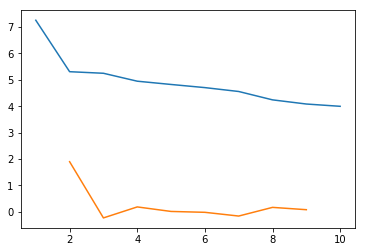

clusters: 2


In [81]:
elbow_method(linkage_matrix_r3)

Elbow method show that there is highest jump when it merges from two clusters to the root.
However, we want to see finer clusters than 2. In that case, we can manually examine the dendrogram to decide where to cut.

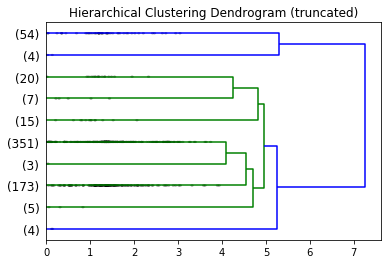

[ 5  5 10  5  5  5  5  5  5  3  3  3  5  5  3 10  5  5  3  5  3  5  5  3
  5  5  3  3  3  3  3  3  5  5  5  5  5  3 10  5 10  5  5  5  5  5  5  7
  7  7  5  5  5  5  5  5 10 10 10  5  5  5  5  5  5  5  5  5  5 10  5  5
  5  5  5  5  3  3  5 10  8  5  3  5  5  5  5  5 10  5  5  3  3  5  5  6
  5  5  3  3  3  3  3  3  5  3 10 10  3  3  5  3  3  3  3  3  5  5  3  3
  5 10  3  8  6  5 10  5  3  4  4  5  5  5  5  5 10 10  3  3  5 10  5  5
  5  5  3  5  5  5  3  5  5  7  3  3  5  5  3  5  5  5  5  5  5  5  3  3
  5  8  8  5  8  3  5 10  5  5  5  5  5 10  3  3  3 10  5  3  5  5  5  5
  5  5  5  3  5  5  5 10 10  5 10  5  5  3  3  3  5  5  5  5  5  5  8  8
  5  5  3  3  5  5  5 10  5  3  5 10  5  5  5  5  8  5  8  5  5  8  5 10
  5  5  5  5  3  5  8  6  5  3  5  5  5  5  5  5  5  5  5  5  5  5  5  3
  5  5  5  5  5  5  5  5  5  5  6  5  5  3  5  5  8  3  5  5  5  5  5  5
  5  5  3  5  6  6  6  6  5  5  5  5  8  3  3  3  5 10  3 10  5  5  3  9
  1  3 10  5  3  5  5  5  5  5  7  5  5  5  5  6  6

In [82]:
clusters10_r3 = create_clusters(10, linkage_matrix_r3)

<p>The truncated dendrogram above indicates that Cluster 1 contains 4 documents, Cluster 2 contains 5 documents and so on. The matrix indicates 661 documents' cluster ids meaning that document 1 belongs to Cluster 5, document 2 belongs to Cluster 5 and so on.</p>

In [83]:
#get a dictionary that contains cluster names as keys and document names (index of clean_content) as values
doc_list_10_r3 = get_doc_list(clusters10_r3)

In [84]:
model_10_r3 = get_trained_model(X_train_vectorised_r3, clusters10_r3)

### Get top 30 features from 10 clusters

In [85]:
model_10_topfeatures_r3, model_10_topcoef_r3 = get_top_features(feature_names_r3, model_10_r3)

1: handed planner, week fsu, union seized, union say, management accountable, cultural failure, adverse comment, issued compliance, issue union, issue total, admitted breach, union responsibility, employer banking, ensure adviser, union emphasised, culture failed, culture culture, cultural told, addressed nab, cultural matter, nab chief, chief officer, officer consumer, consumer wealth, rule boss, witnessing form, senior management, nab board, false witnessing, bonus cut
2: experienced adviser, fifth actually, obtain extra, met fifth, exodus older, actually sought, mistrust reason, australian adult, need met, requirement mandatory, new educational, financial advice, people trust, financial industry, commissioner say, say public, trust change, change told, improving professionalism, repairing industry, adviser lead, caring people, mistrust industry, public mistrust, industry watchdog, senior stockbroker, tackled improving, asic commissioner, financial adviser, stockbroker financial
3: r

In [86]:
plot_top_features(model_10_topfeatures_r3, model_10_topcoef_r3)

In [252]:
create_input_file(clean_content_r3, doc_list_10_r3, 10)

In [253]:
stage_1(10)

In [254]:
stage_2(10)

In [255]:
stage_3(10)

### Top sentences and keywords for each cluster

In [147]:
stage_4(10)

Cluster 1
**excerpts:** They have also been issued with a" compliance breach," and told that the bank would make an" adverse" comment to prospective employers under the banking industry reference sharing   and information sharing protocol, the union says. Andrew Hagger, NAB chief customer officer for consumer and wealth Photo: AAP The Finance Sector Union has seized on a National Australia Bank executive comment that false witnessing of documents in its advice business was a" cultural" issue as the union pushes for lighter penalties for planners who admitted to the breaches. Planners at NAB who acknowledged breaching the bank policies on how a key superannuation form was signed- a problem revealed by Fairfax Media last year- have had their bonuses cut by per cent.

**keywords:** nab, the finance sector union, the nab board, julia angrisano
Cluster 2
**excerpts:** The financial industry watchdog has implored Australia senior stockbrokers and financial advisers to lead the way in repairi

### Extract top features from each split in the dendrogram

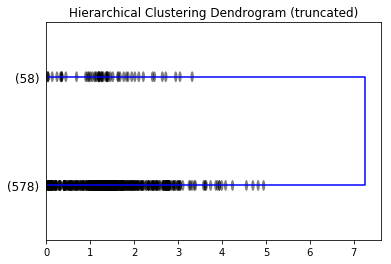

[1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1
 1 1 1 1 1 2 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 1 1 1
 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 2 1 1 1 1 1 1 1 1 1 2 2 1 1 1 2 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 2 1 1 1
 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 2 1 2 1 1 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 1 1 1 1 1 1 1 1 1 2 2 2 2
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1
 1 1 1 2 1 1 1 1 1 1 1 1 2 1 1 2 2 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 2 1 2 

In [150]:
# 2 clusters 
#create cluster of 2
clusters_2_r3 = create_clusters(2, linkage_matrix_r3)

In [151]:
#train logistic regression model
model_2_r3 = get_trained_model(X_train_vectorised_r3, clusters_2_r3)

In [153]:
model_2_topfeatures_r3, model_2_topcoef_r3 = get_top_features_binary(feature_names_r3, model_2_r3)

1: financial service, commonwealth bank, tax cut, service industry, super fund, financial adviser, superannuation financial, banking superannuation, financial advice, real estate, life insurance, ulterior motive, service sector, misconduct banking, industry fund, national music, company tax, mortgage broker, class action, prime minister, cba chief, global financial, federal court, banking sector, live blog, motive theory, financial institution, wealth management, house price, buy franchise, swap rate, financial crisis, retail fund, financial sector, superannuation fund, community standard, risk officer, prudential regulation, internal auditor, share fell, credit union, franchise agreement, bank swap, major bank, chief risk, business model, bank queensland, financial crime, australian prudential, business overdraft
2: small business, business lending, business loan, unfair contract, code banking, loan small, culture pressure, banking practice, senior assisting, care skill, diligent prud

In [154]:
plot_top_features(model_2_topfeatures_r3, model_2_topcoef_r3)

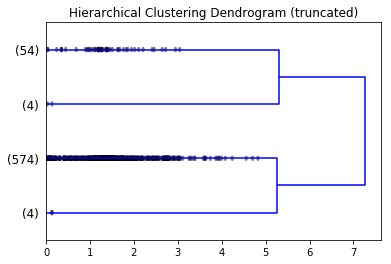

[2 2 4 2 2 2 2 2 2 2 2 2 2 2 2 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 4 2 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 4 4 4 2 2 2 2 2 2 2 2 2 2 4 2 2 2 2
 2 2 2 2 2 4 2 2 2 2 2 2 2 2 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 4 4 2 2 2
 2 2 2 2 2 2 2 2 2 2 4 2 2 2 2 4 2 2 2 2 2 2 2 2 2 4 4 2 2 2 4 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 4 2 2 2 2 2 4 2 2 2
 4 2 2 2 2 2 2 2 2 2 2 2 2 2 4 4 2 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 4 2 2 2 4 2 2 2 2 2 2 2 2 2 2 2 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 4 2 4 2 2 2 3 1 2 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 4 2 2 4 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 4 4 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 4 2 4 2 2 2 2 2 2 2 2 2 3 3 3 4
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 2 2 2 4 2 2 2 2 2 2 2 2 2 2
 2 2 2 4 2 2 2 2 2 2 2 2 4 2 2 4 4 2 2 2 2 2 2 2 2 2 2 2 2 4 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 4 2 4 

In [155]:
# 4 clusters 
#create cluster of 4
clusters_4_r3 = create_clusters(4, linkage_matrix_r3)

In [156]:
#train logistic regression model
model_4_r3 = get_trained_model(X_train_vectorised_r3, clusters_4_r3)

In [158]:
model_4_topfeatures_r3, model_4_topcoef_r3 = get_top_features(feature_names_r3, model_4_r3)

1: adverse comment, consistent senior, breach told, employer banking, exclusively employee, penalty planner, breaching bank, adviser upheld, consistent comment, breach seriously, planner admitted, employee nab, planner bonus, penalty handed, planner nab, planning argued, breach question, breach planner, planner consistent, employee bonus, nab chief, chief officer, rule boss, consumer wealth, officer consumer, witnessing form, senior management, nab board, false witnessing, bonus cut
2: house price, motive theory, financial crisis, wealth management, live blog, federal court, cba chief, global financial, financial institution, banking sector, prime minister, national music, class action, company tax, mortgage broker, industry fund, misconduct banking, service sector, real estate, ulterior motive, life insurance, banking superannuation, superannuation financial, financial advice, financial adviser, super fund, service industry, tax cut, commonwealth bank, financial service
3: whilst try,

In [159]:
plot_top_features(model_4_topfeatures_r3, model_4_topcoef_r3)

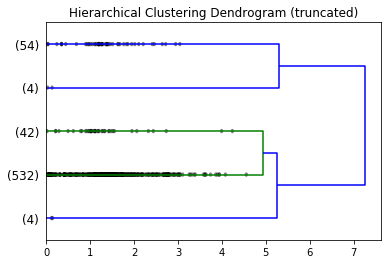

[2 2 5 2 2 2 2 2 2 2 2 2 2 2 2 5 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 5 2 5 2 2 2 2 2 2 3 3 3 2 2 2 2 2 2 5 5 5 2 2 2 2 2 2 2 2 2 2 5 2 2 2 2
 2 2 2 2 2 5 3 2 2 2 2 2 2 2 5 2 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 5 5 2 2 2
 2 2 2 2 2 2 2 2 2 2 5 2 3 3 2 5 2 2 2 2 2 2 2 2 2 5 5 2 2 2 5 2 2 2 2 2 2
 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 2 3 2 2 5 2 2 2 2 2 5 2 2 2
 5 2 2 2 2 2 2 2 2 2 2 2 2 2 5 5 2 5 2 2 2 2 2 2 2 2 2 2 2 3 3 2 2 2 2 2 2
 2 5 2 2 2 5 2 2 2 2 3 2 3 2 2 3 2 5 2 2 2 2 2 2 3 3 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3
 2 2 2 2 3 2 2 2 2 5 2 5 2 2 2 4 1 2 5 2 2 2 2 2 2 2 3 2 2 2 2 3 3 2 2 2 2
 2 2 2 2 2 2 2 5 2 2 5 3 2 2 3 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 5 5 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 5 2 5 2 2 2 2 2 2 2 2 2 4 4 4 5
 2 2 2 2 2 2 2 2 2 2 3 2 2 3 2 2 2 2 2 2 1 1 1 2 2 2 5 2 2 2 2 2 2 2 3 3 2
 2 2 2 5 2 2 2 2 2 2 2 2 5 2 2 5 5 2 2 2 2 2 2 3 2 2 2 2 2 5 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 5 2 5 

In [160]:
# 5 clusters 
#create cluster of 5
clusters_5_r3 = create_clusters(5, linkage_matrix_r3)

In [161]:
#train logistic regression model
model_5_r3 = get_trained_model(X_train_vectorised_r3, clusters_5_r3)

In [162]:
model_5_topfeatures_r3, model_5_topcoef_r3 = get_top_features(feature_names_r3, model_5_r3)

1: told union, culture culture, record changed, tone culture, consistent senior, changed arguing, handed planner, took breach, nab rule, accountable setting, consistent comment, boss fsu, fsu argued, problem systemic, cultural matter, problem failure, adviser upheld, boss told, cultural told, document advice, nab chief, chief officer, consumer wealth, officer consumer, rule boss, witnessing form, senior management, nab board, false witnessing, bonus cut
2: year ago, community standard, credit union, risk officer, internal auditor, cba chief, swap rate, insurance policy, business overdraft, financial institution, motive theory, commonwealth bank, financial sector, live blog, national music, bank queensland, banking sector, house price, global financial, real estate, class action, ulterior motive, mortgage broker, superannuation financial, financial crisis, misconduct banking, banking superannuation, financial adviser, financial service, service industry
3: service minister, retirement s

In [163]:
plot_top_features(model_5_topfeatures_r3, model_5_topcoef_r3)

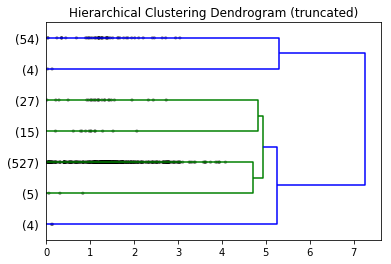

[3 3 7 3 3 3 3 3 3 3 3 3 3 3 3 7 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 7 3 7 3 3 3 3 3 3 5 5 5 3 3 3 3 3 3 7 7 7 3 3 3 3 3 3 3 3 3 3 7 3 3 3 3
 3 3 3 3 3 7 5 3 3 3 3 3 3 3 7 3 3 3 3 3 3 4 3 3 3 3 3 3 3 3 3 3 7 7 3 3 3
 3 3 3 3 3 3 3 3 3 3 7 3 5 4 3 7 3 3 3 3 3 3 3 3 3 7 7 3 3 3 7 3 3 3 3 3 3
 3 3 3 3 3 5 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 5 5 3 5 3 3 7 3 3 3 3 3 7 3 3 3
 7 3 3 3 3 3 3 3 3 3 3 3 3 3 7 7 3 7 3 3 3 3 3 3 3 3 3 3 3 5 5 3 3 3 3 3 3
 3 7 3 3 3 7 3 3 3 3 5 3 5 3 3 5 3 7 3 3 3 3 3 3 5 4 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 3 3 3 3 3 5 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4
 3 3 3 3 5 3 3 3 3 7 3 7 3 3 3 6 1 3 7 3 3 3 3 3 3 3 5 3 3 3 3 4 4 3 3 3 3
 3 3 3 3 3 3 3 7 3 3 7 4 3 3 4 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 7 7 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 4 3 3 3 3 3 3 3 3 3 7 3 7 3 3 3 3 3 3 3 3 3 6 6 6 7
 3 3 3 3 3 3 3 3 3 3 5 3 3 5 3 3 3 3 3 3 1 1 1 3 3 3 7 3 3 3 3 3 3 3 5 5 3
 3 3 3 7 3 3 3 3 3 3 3 3 7 3 3 7 7 3 3 3 3 3 3 5 3 3 3 3 3 7 3 3 3 2 2 2 2
 3 3 3 3 3 3 3 3 3 7 3 7 

In [164]:
# 5 clusters 
#create cluster of 7
clusters_7_r3 = create_clusters(7, linkage_matrix_r3)

In [165]:
#train logistic regression model
model_7_r3 = get_trained_model(X_train_vectorised_r3, clusters_7_r3)

In [166]:
model_7_topfeatures_r3, model_7_topcoef_r3 = get_top_features(feature_names_r3, model_7_r3)

1: management incident, appeared laid, record changed, question involved, exclusively employee, acknowledged breaching, lighter penalty, addressed nab, fsu clear, fsu called, wrongly witnessing, fsu argued, expect letter, push lighter, form signed, form authorises, time letter, failure discipline, failure appeared, bank strict, nab chief, chief officer, officer consumer, rule boss, consumer wealth, witnessing form, senior management, nab board, false witnessing, bonus cut
2: experienced adviser, advice mistrust, obtain extra, sought financial, requirement mandatory, need met, actually sought, industry reluctant, urged senior, new educational, australian adult, financial advice, people trust, financial industry, commissioner say, say public, trust change, change told, improving professionalism, adviser lead, industry watchdog, tackled improving, senior stockbroker, public mistrust, repairing industry, caring people, mistrust industry, asic commissioner, financial adviser, stockbroker fi

In [167]:
plot_top_features(model_7_topfeatures_r3, model_7_topcoef_r3)

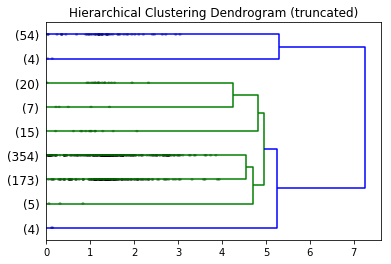

[4 4 9 4 4 4 4 4 4 3 3 3 4 4 3 9 4 4 3 4 3 4 4 3 4 4 3 3 3 3 3 3 4 4 4 4 4
 3 9 4 9 4 4 4 4 4 4 6 6 6 4 4 4 4 4 4 9 9 9 4 4 4 4 4 4 4 4 4 4 9 4 4 4 4
 4 4 3 3 4 9 7 4 3 4 4 4 4 4 9 4 4 3 3 4 4 5 4 4 3 3 3 3 3 3 4 3 9 9 3 3 4
 3 3 3 3 3 4 4 3 3 4 9 3 7 5 4 9 4 3 4 4 4 4 4 4 4 9 9 3 3 4 9 4 4 4 4 3 4
 4 4 3 4 4 6 3 3 4 4 3 4 4 4 4 4 4 4 3 3 4 7 7 4 7 3 4 9 4 4 4 4 4 9 3 3 3
 9 4 3 4 4 4 4 4 4 4 3 4 4 4 9 9 4 9 4 4 3 3 3 4 4 4 4 4 4 7 7 4 4 3 3 4 4
 4 9 4 3 4 9 4 4 4 4 7 4 7 4 4 7 4 9 4 4 4 4 3 4 7 5 4 3 4 4 4 4 4 4 4 4 4
 4 4 4 4 3 4 4 4 4 4 4 4 4 4 4 5 4 4 3 4 4 7 3 4 4 4 4 4 4 4 4 3 4 5 5 5 5
 4 4 4 4 7 3 3 3 4 9 3 9 4 4 3 8 1 3 9 4 3 4 4 4 4 4 6 4 4 4 4 5 5 4 4 4 4
 4 4 4 3 4 4 3 9 4 4 9 5 4 3 5 3 3 4 4 3 4 3 4 4 3 4 3 4 4 4 3 3 9 9 4 3 3
 3 3 3 3 4 3 4 3 4 4 4 5 4 4 4 4 4 4 4 4 4 9 4 9 4 4 4 4 4 4 4 4 3 8 8 8 9
 4 3 3 4 4 3 3 3 3 3 6 3 3 6 3 3 4 3 4 4 1 1 1 3 4 4 9 4 4 4 4 4 3 4 7 7 4
 4 4 4 9 4 3 3 3 3 3 3 4 9 3 3 9 9 4 4 4 4 3 4 7 4 4 4 4 4 9 3 4 4 2 2 2 2
 3 3 3 3 3 3 3 3 3 9 4 9 

In [169]:
# 9 clusters 
#create cluster of 9
clusters_9_r3 = create_clusters(9, linkage_matrix_r3)

In [170]:
#train logistic regression model
model_9_r3 = get_trained_model(X_train_vectorised_r3, clusters_9_r3)

In [171]:
model_9_topfeatures_r3, model_9_topcoef_r3 = get_top_features(feature_names_r3, model_9_r3)

1: management accountable, nab week, client superannuation, die october, wrongly witnessing, addressed nab, consistent comment, seized national, boss told, exclusively employee, boss fsu, union seized, handed planner, union responsibility, expect letter, policy superannuation, total statutory, breach planner, pointed agreed, union say, nab chief, chief officer, rule boss, consumer wealth, officer consumer, witnessing form, senior management, nab board, false witnessing, bonus cut
2: mistrust reason, half australian, thursday half, need met, actually sought, fifth actually, met fifth, advice mistrust, requirement mandatory, industry reluctant, experienced adviser, financial advice, people trust, financial industry, commissioner say, say public, trust change, change told, caring people, public mistrust, mistrust industry, tackled improving, repairing industry, adviser lead, industry watchdog, improving professionalism, senior stockbroker, asic commissioner, financial adviser, stockbroker

In [172]:
plot_top_features(model_9_topfeatures_r3, model_9_topcoef_r3)

### Features network

In [175]:
root = 'R3'

node1 = ''
for i in range(5):
    temp = model_2_topfeatures_r3[0][i] + '\n'
    node1 = node1 + temp    
print(node1)

node2 = ''
for i in range(5):
    temp = model_2_topfeatures_r3[1][i] + '\n'
    node2 = node2 + temp   
print(node2)

node3 = ''
for i in range(5):
    temp = model_4_topfeatures_r3[0][i] + '\n'
    node3 = node3 + temp   
print(node3)

node4 = ''
for i in range(5):
    temp = model_4_topfeatures_r3[1][i] + '\n'
    node4 = node4 + temp 
node4 = node4 + ' '
print(node4)

node5 = ''
for i in range(5):
    temp = model_4_topfeatures_r3[2][i] + '\n'
    node5 = node5 + temp  
print(node5)

node6 = ''
for i in range(5):
    temp = model_4_topfeatures_r3[3][i] + '\n'
    node6 = node6 + temp
node6 = node6 + ' '
print(node6)

node7 = ''
for i in range(5):
    temp = model_5_topfeatures_r3[1][i] + '\n'
    node7 = node7 + temp  
print(node7)

node8 = ''
for i in range(5):
    temp = model_5_topfeatures_r3[2][i] + '\n'
    node8 = node8 + temp    
print(node8)

node9 = ''
for i in range(5):
    temp = model_7_topfeatures_r3[1][i] + '\n'
    node9 = node9 + temp    
print(node9)

node10 = ''
for i in range(5):
    temp = model_7_topfeatures_r3[2][i] + '\n'
    node10 = node10 + temp    
print(node10)

node11 = ''
for i in range(5):
    temp = model_7_topfeatures_r3[3][i] + '\n'
    node11 = node11 + temp    
print(node11)

node12 = ''
for i in range(5):
    temp = model_7_topfeatures_r3[4][i] + '\n'
    node12 = node12 + temp   
print(node12)

node13 = ''
for i in range(5):
    temp = model_9_topfeatures_r3[2][i] + '\n'
    node13 = node13 + temp   
print(node13)

node14 = ''
for i in range(5):
    temp = model_9_topfeatures_r3[3][i] + '\n'
    node14 = node14 + temp    
print(node14)

node15 = ''
for i in range(5):
    temp = model_9_topfeatures_r3[5][i] + '\n'
    node15 = node15 + temp    
print(node15)

node16 = ''
for i in range(5):
    temp = model_9_topfeatures_r3[6][i] + '\n'
    node16 = node16 + temp  

print(node16)

node17 = ''
for i in range(5):
    temp = model_10_topfeatures_r3[3][i] + '\n'
    node17 = node17 + temp    
print(node17)

node18 = ''
for i in range(5):
    temp = model_10_topfeatures_r3[4][i] + '\n'
    node18 = node18 + temp
node18 = node18 + ' '
print(node18)

financial service
commonwealth bank
tax cut
service industry
super fund

small business
business lending
business loan
unfair contract
code banking

bonus cut
false witnessing
nab board
senior management
witnessing form

financial service
commonwealth bank
tax cut
service industry
super fund
 
term deposit
classified residential
commercial property
separate investment
bank conduct

small business
business lending
business loan
unfair contract
code banking
 
service industry
financial service
financial adviser
banking superannuation
misconduct banking

super fund
tax cut
industry fund
company tax
retail fund

stockbroker financial
financial adviser
asic commissioner
mistrust industry
caring people

service industry
financial service
banking superannuation
misconduct banking
financial crisis

tax cut
company tax
worm signup
weekday morning
email sign

super fund
industry fund
retail fund
superannuation fund
default fund

commonwealth bank
financial ombudsman
bank queensland
ombudsman ser

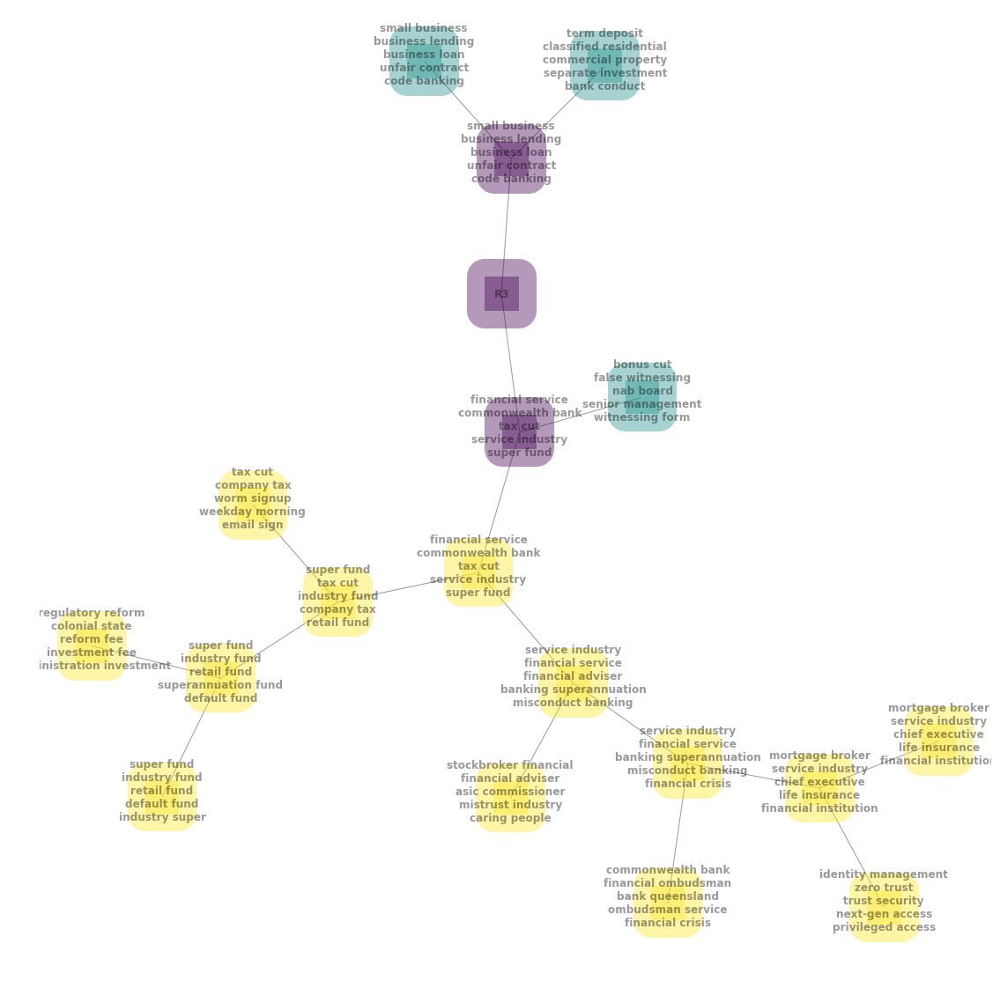

In [182]:

# Build a dataframe
df = pd.DataFrame({ 'from':[root, root, node1, node1, node2, node2, node4, node4, node7, node7, node8, node8, node10, node10, node12, node12, node14, node14], 
                'to':[node1, node2, node3, node4, node5, node6, node7, node8, node9, node10, node11, node12, node13, node14, node15, node16, node17, node18]})
df

# And a data frame with characteristics for your nodes
carac = pd.DataFrame({ 'ID':[root, node1, node2, node3, node4, node5, node6, node7, node8, node9, node10, node11, node12, node13, node14, node15, node16, node17, node18], 
                      'myvalue':['group1','group1','group1','group2','group3', 'group2', 'group2', 'group3', 'group3', 'group3', 'group3', 'group3','group3','group3', 'group3','group3','group3','group3','group3'] })

 
# Build your graph
G=nx.from_pandas_edgelist(df, 'from', 'to')

   
carac= carac.set_index('ID')
carac=carac.reindex(G.nodes())
carac['myvalue']=pd.Categorical(carac['myvalue'])
carac['myvalue'].cat.codes

# Plot it
# Graph with Custom nodes:
plt.figure(1, figsize = (15, 15))
nx.draw(G, with_labels=True, node_size=1500, node_color=carac['myvalue'].cat.codes, font_size=12, font_weight="bold", node_shape="s", alpha=0.4, linewidths=40, pos=nx.kamada_kawai_layout(G))
plt.show()


# 8.2 Results for Round 4

In [256]:
clean_content_r4 = clean_text(content_r4)
#print(clean_content[0])
#print(len(clean_content))

In [257]:
clean_content_r4 = deleteShortContent(clean_content_r4)
#print(len(clean_content))

In [186]:
X_train_vectorised_r4, feature_names_r4 = tfidf_vectorize(clean_content_r4, tokenize_stopwords_lemma_noname, (2,2))

/anaconda3/lib/python3.6/site-packages/sklearn/feature_extraction/text.py:286: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['le', 'u'] not in stop_words.



(598, 25576)


In [188]:
linkage_matrix_r4 = hierarhical_cluster(X_train_vectorised_r4, title_r4)

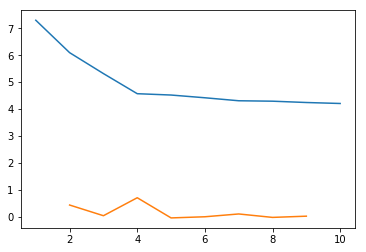

clusters: 4


In [189]:
elbow_method(linkage_matrix_r4)

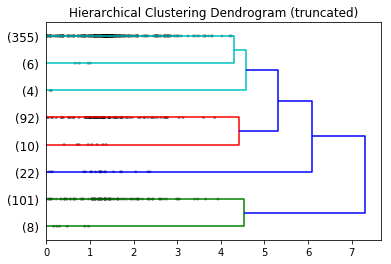

[8 2 8 8 8 2 5 5 2 2 2 8 5 5 5 5 4 8 5 2 8 5 5 2 5 2 2 8 2 8 4 2 8 8 8 2 2
 8 5 5 5 2 8 2 8 5 8 8 8 8 5 5 5 2 8 2 8 5 2 2 5 2 2 8 5 5 2 8 8 8 8 8 2 2
 8 8 8 8 8 8 5 5 2 8 2 8 2 2 2 2 8 5 8 6 6 8 8 8 8 5 8 2 8 8 8 8 8 8 8 8 5
 8 5 5 8 8 8 8 2 8 8 8 8 2 5 8 5 5 3 4 4 4 8 8 8 8 8 8 8 8 8 8 3 8 8 8 8 3
 5 8 2 5 8 8 8 8 8 8 3 3 3 3 8 8 3 8 8 2 8 8 8 8 8 8 8 5 4 5 5 8 8 8 8 8 8
 8 8 2 5 5 5 8 5 8 8 3 8 5 8 8 8 2 5 5 8 8 8 5 5 5 5 2 2 2 8 8 8 8 8 8 5 8
 5 2 8 8 8 8 8 8 8 8 3 8 8 8 8 8 8 8 5 2 8 8 2 8 8 8 8 8 8 8 8 8 8 8 8 3 8
 8 8 8 8 1 1 1 2 8 8 8 2 8 2 8 8 8 8 8 8 8 8 8 6 8 3 8 2 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 2 2 3 8 8 8 8 8 8 8 5 5 2 1 1 8 8 2 8 2 2 5 8 8 2 8 5 2 5 8
 2 5 3 5 2 2 2 8 8 8 8 5 5 5 5 8 8 2 5 5 5 8 8 8 5 4 8 8 8 4 5 2 8 8 7 7 7
 8 8 2 8 8 8 7 7 7 8 8 8 8 8 8 8 5 8 2 1 1 1 8 8 8 2 2 5 8 8 8 8 5 5 5 5 8
 8 2 8 8 8 8 8 3 8 8 8 8 8 8 8 8 8 8 8 8 8 8 5 5 3 3 8 3 8 8 8 2 2 8 8 5 8
 8 8 8 3 8 5 8 8 8 5 2 8 2 8 2 2 8 2 2 2 2 2 2 5 2 5 5 8 3 8 8 8 3 2 2 8 8
 8 8 8 8 8 5 5 8 2 2 8 8 

In [193]:
clusters8_r4 = create_clusters(8, linkage_matrix_r4)

In [194]:
#get a dictionary that contains cluster names as keys and document names (index of clean_content) as values
doc_list_8_r4 = get_doc_list(clusters8_r4)

In [195]:
model_8_r4 = get_trained_model(X_train_vectorised_r4, clusters8_r4)

In [196]:
model_8_topfeatures_r4, model_8_topcoef_r4 = get_top_features(feature_names_r4, model_8_r4)

1: received played, insure business, hand contact, behalf insurance, high-pressure tactic, later persuaded, push sell, life orange, bank queensland, sold funeral, document setting, funeral policy, referral program, insurance insure, insurance bank, n't want, sunshine coast, vespa sunshine, announced selling, owned announced, queensland owned, business april, selling business, family friend, spike aboriginal, contact family, blamed spike, want funeral, la vega, funeral insurance
2: aboriginal organisation, policy holder, live blog, rainbow serpent, acbf funeral, life insurance, aboriginal woman, financial literacy, insurance policy, fee-free account, northern territory, blog latest, bank account, funeral insurer, follow live, vespa scooter, funeral plan, aboriginal people, islander people, select afsl, benefit fund, community benefit, remote community, insurance company, strait islander, aboriginal community, aboriginal torres, torres strait, informal overdraft, funeral insurance
3: exp

In [197]:
plot_top_features(model_8_topfeatures_r4, model_8_topcoef_r4)

In [259]:
create_input_file(clean_content_r4, doc_list_8_r4, 8)

In [260]:
stage_1(8)
stage_2(8)
stage_3(8)

In [200]:
stage_4(8)

Cluster 1
**excerpts:** Kathy Marika, a year old who worked for Bangarra Dance Company, was offered hundreds of dollars in Myer and Coles vouchers to convince her to hand over contact details of family, friends, and colleagues, as part of an aggressive push to sell funeral insurance that she did n't want. Even though Marika explicitly told one of the salesmen from Let Insure she did not want funeral insurance as she already had some, she was called back anyway and later and persuaded her to take out cover for herself, three children, and five grandchildren. Kathy Marika said she did n't want funeral insurance but Let Insure were" really pushy." Photo: Glenn Campbell

**keywords:** the australian securities and investments commission, kathy marika, the corporations act, the bank of queensland, howden
Cluster 2
**excerpts:** " Sorry business" after an Aboriginal person death is a major, expensive ritual that can last for weeks so the targeting of indigenous Australians for funeral insura

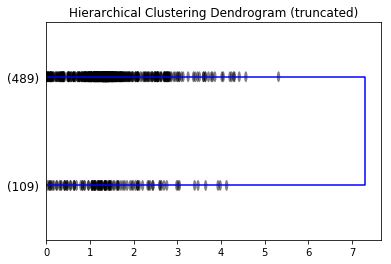

[2 1 2 2 2 1 2 2 1 1 1 2 2 2 2 2 2 2 2 1 2 2 2 1 2 1 1 2 1 2 2 1 2 2 2 1 1
 2 2 2 2 1 2 1 2 2 2 2 2 2 2 2 2 1 2 1 2 2 1 1 2 1 1 2 2 2 1 2 2 2 2 2 1 1
 2 2 2 2 2 2 2 2 1 2 1 2 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 1 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 1 1 1 2 2 2 2 2 2 2 2
 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 1 1 1 1 2 2 2 1 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 1 1 2 2 2 2 2 2 2 2 2 2 1 1 1 2 2 1 2 1 1 2 2 2 1 2 2 1 2 2
 1 2 2 2 1 1 1 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2
 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 1 1 2 2 2 1 1 2 2 2 2 2 2 2 2 2 2
 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 1 2 1 2 1 1 2 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 2 1 1 2 2
 2 2 2 2 2 2 2 2 1 1 2 2 

In [201]:
# 2 clusters 
#create cluster of 2
clusters_2_r4 = create_clusters(2, linkage_matrix_r4)

In [206]:
#train logistic regression model
model_2_r4 = get_trained_model(X_train_vectorised_r4, clusters_2_r4)

In [207]:
model_2_topfeatures_r4, model_2_topcoef_r4 = get_top_features_binary(feature_names_r4, model_2_r4)

1: funeral insurance, informal overdraft, torres strait, aboriginal torres, aboriginal community, strait islander, remote community, insurance company, community benefit, benefit fund, aboriginal people, la vega, islander people, select afsl, vespa scooter, follow live, funeral plan, funeral insurer, blog latest, bank account, fee-free account, northern territory, life insurance, financial literacy, insurance policy, aboriginal woman, live blog, policy holder, acbf funeral, rainbow serpent, senior assisting, aboriginal organisation, second language, open fee-free, paid premium, include disclaimer, sunshine coast, legal aid, overdraft fee, consumer-protection consumer-finance, cancel policy, trip la, open account, funeral policy, abc covering, broadcast world, world today, external link, policy sold, financial exclusion
2: bank manager, financial planning, wealth management, commonwealth bank, small business, financial adviser, financial advice, financial planner, reserve bank, tax cut,

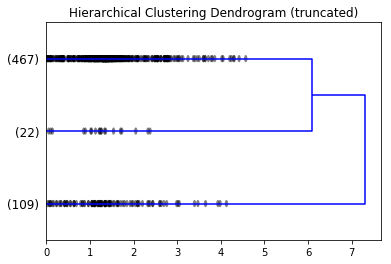

[3 1 3 3 3 1 3 3 1 1 1 3 3 3 3 3 3 3 3 1 3 3 3 1 3 1 1 3 1 3 3 1 3 3 3 1 1
 3 3 3 3 1 3 1 3 3 3 3 3 3 3 3 3 1 3 1 3 3 1 1 3 1 1 3 3 3 1 3 3 3 3 3 1 1
 3 3 3 3 3 3 3 3 1 3 1 3 1 1 1 1 3 3 3 3 3 3 3 3 3 3 3 1 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 1 3 3 3 3 1 3 3 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 2
 3 3 1 3 3 3 3 3 3 3 2 2 2 2 3 3 2 3 3 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 1 3 3 3 3 3 3 3 2 3 3 3 3 3 1 3 3 3 3 3 3 3 3 3 1 1 1 3 3 3 3 3 3 3 3
 3 1 3 3 3 3 3 3 3 3 2 3 3 3 3 3 3 3 3 1 3 3 1 3 3 3 3 3 3 3 3 3 3 3 3 2 3
 3 3 3 3 1 1 1 1 3 3 3 1 3 1 3 3 3 3 3 3 3 3 3 3 3 2 3 1 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 1 1 2 3 3 3 3 3 3 3 3 3 1 1 1 3 3 1 3 1 1 3 3 3 1 3 3 1 3 3
 1 3 2 3 1 1 1 3 3 3 3 3 3 3 3 3 3 1 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3 3 3 3
 3 3 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 1 1 1 3 3 3 1 1 3 3 3 3 3 3 3 3 3 3
 3 1 3 3 3 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 3 2 3 3 3 1 1 3 3 3 3
 3 3 3 2 3 3 3 3 3 3 1 3 1 3 1 1 3 1 1 1 1 1 1 3 1 3 3 3 2 3 3 3 2 1 1 3 3
 3 3 3 3 3 3 3 3 1 1 3 3 

In [203]:
# 3 clusters 
#create cluster of 3
clusters_3_r4 = create_clusters(3, linkage_matrix_r4)

In [208]:
#train logistic regression model
model_3_r4 = get_trained_model(X_train_vectorised_r4, clusters_3_r4)

In [209]:
model_3_topfeatures_r4, model_3_topcoef_r4 = get_top_features(feature_names_r4, model_3_r4)

1: rainbow serpent, acbf funeral, policy holder, live blog, aboriginal woman, life insurance, insurance policy, financial literacy, fee-free account, northern territory, bank account, blog latest, funeral insurer, funeral plan, follow live, vespa scooter, select afsl, islander people, la vega, aboriginal people, benefit fund, community benefit, insurance company, remote community, strait islander, aboriginal community, aboriginal torres, torres strait, informal overdraft, funeral insurance
2: bank ownership, chief executive, management financial, owning wealth, investment platform, limited asx, financial financial, mortgage choice, management mortgage, broking business, advice business, cba shareholder, state global, financial planning, financial wisdom, commonwealth bank, asset management, wealth business, count financial, fund management, global asset, financial advice, vertical integration, home loan, aussie home, mortgage broking, management business, colonial state, cf group, weal

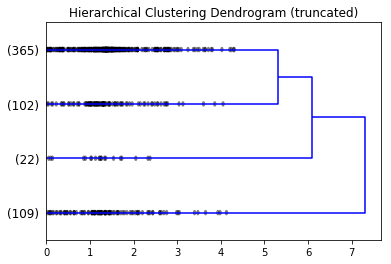

[4 1 4 4 4 1 3 3 1 1 1 4 3 3 3 3 3 4 3 1 4 3 3 1 3 1 1 4 1 4 3 1 4 4 4 1 1
 4 3 3 3 1 4 1 4 3 4 4 4 4 3 3 3 1 4 1 4 3 1 1 3 1 1 4 3 3 1 4 4 4 4 4 1 1
 4 4 4 4 4 4 3 3 1 4 1 4 1 1 1 1 4 3 4 4 4 4 4 4 4 3 4 1 4 4 4 4 4 4 4 4 3
 4 3 3 4 4 4 4 1 4 4 4 4 1 3 4 3 3 2 3 3 3 4 4 4 4 4 4 4 4 4 4 2 4 4 4 4 2
 3 4 1 3 4 4 4 4 4 4 2 2 2 2 4 4 2 4 4 1 4 4 4 4 4 4 4 3 3 3 3 4 4 4 4 4 4
 4 4 1 3 3 3 4 3 4 4 2 4 3 4 4 4 1 3 3 4 4 4 3 3 3 3 1 1 1 4 4 4 4 4 4 3 4
 3 1 4 4 4 4 4 4 4 4 2 4 4 4 4 4 4 4 3 1 4 4 1 4 4 4 4 4 4 4 4 4 4 4 4 2 4
 4 4 4 4 1 1 1 1 4 4 4 1 4 1 4 4 4 4 4 4 4 4 4 4 4 2 4 1 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 1 1 2 4 4 4 4 4 4 4 3 3 1 1 1 4 4 1 4 1 1 3 4 4 1 4 3 1 3 4
 1 3 2 3 1 1 1 4 4 4 4 3 3 3 3 4 4 1 3 3 3 4 4 4 3 3 4 4 4 3 3 1 4 4 4 4 4
 4 4 1 4 4 4 4 4 4 4 4 4 4 4 4 4 3 4 1 1 1 1 4 4 4 1 1 3 4 4 4 4 3 3 3 3 4
 4 1 4 4 4 4 4 2 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 2 2 4 2 4 4 4 1 1 4 4 3 4
 4 4 4 2 4 3 4 4 4 3 1 4 1 4 1 1 4 1 1 1 1 1 1 3 1 3 3 4 2 4 4 4 2 1 1 4 4
 4 4 4 4 4 3 3 4 1 1 4 4 

In [204]:
# 4 clusters 
#create cluster of 4
clusters_4_r4 = create_clusters(4, linkage_matrix_r4)

In [210]:
#train logistic regression model
model_4_r4 = get_trained_model(X_train_vectorised_r4, clusters_4_r4)

In [211]:
model_4_topfeatures_r4, model_4_topcoef_r4 = get_top_features(feature_names_r4, model_4_r4)

1: rainbow serpent, acbf funeral, policy holder, live blog, aboriginal woman, life insurance, financial literacy, insurance policy, fee-free account, northern territory, blog latest, bank account, funeral insurer, funeral plan, follow live, vespa scooter, la vega, select afsl, islander people, aboriginal people, benefit fund, community benefit, insurance company, remote community, strait islander, aboriginal community, aboriginal torres, torres strait, informal overdraft, funeral insurance
2: continuing shift, management financial, chief executive, owning wealth, limited asx, investment platform, mortgage choice, financial financial, management mortgage, broking business, advice business, cba shareholder, commonwealth bank, state global, financial wisdom, financial planning, asset management, wealth business, count financial, fund management, global asset, vertical integration, financial advice, home loan, aussie home, mortgage broking, management business, colonial state, cf group, we

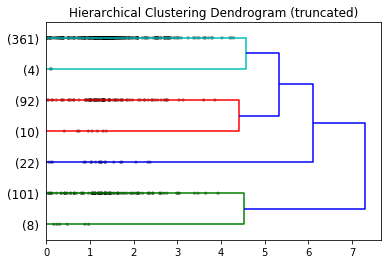

[7 2 7 7 7 2 5 5 2 2 2 7 5 5 5 5 4 7 5 2 7 5 5 2 5 2 2 7 2 7 4 2 7 7 7 2 2
 7 5 5 5 2 7 2 7 5 7 7 7 7 5 5 5 2 7 2 7 5 2 2 5 2 2 7 5 5 2 7 7 7 7 7 2 2
 7 7 7 7 7 7 5 5 2 7 2 7 2 2 2 2 7 5 7 6 6 7 7 7 7 5 7 2 7 7 7 7 7 7 7 7 5
 7 5 5 7 7 7 7 2 7 7 7 7 2 5 7 5 5 3 4 4 4 7 7 7 7 7 7 7 7 7 7 3 7 7 7 7 3
 5 7 2 5 7 7 7 7 7 7 3 3 3 3 7 7 3 7 7 2 7 7 7 7 7 7 7 5 4 5 5 7 7 7 7 7 7
 7 7 2 5 5 5 7 5 7 7 3 7 5 7 7 7 2 5 5 7 7 7 5 5 5 5 2 2 2 7 7 7 7 7 7 5 7
 5 2 7 7 7 7 7 7 7 7 3 7 7 7 7 7 7 7 5 2 7 7 2 7 7 7 7 7 7 7 7 7 7 7 7 3 7
 7 7 7 7 1 1 1 2 7 7 7 2 7 2 7 7 7 7 7 7 7 7 7 6 7 3 7 2 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 2 2 3 7 7 7 7 7 7 7 5 5 2 1 1 7 7 2 7 2 2 5 7 7 2 7 5 2 5 7
 2 5 3 5 2 2 2 7 7 7 7 5 5 5 5 7 7 2 5 5 5 7 7 7 5 4 7 7 7 4 5 2 7 7 7 7 7
 7 7 2 7 7 7 7 7 7 7 7 7 7 7 7 7 5 7 2 1 1 1 7 7 7 2 2 5 7 7 7 7 5 5 5 5 7
 7 2 7 7 7 7 7 3 7 7 7 7 7 7 7 7 7 7 7 7 7 7 5 5 3 3 7 3 7 7 7 2 2 7 7 5 7
 7 7 7 3 7 5 7 7 7 5 2 7 2 7 2 2 7 2 2 2 2 2 2 5 2 5 5 7 3 7 7 7 3 2 2 7 7
 7 7 7 7 7 5 5 7 2 2 7 7 

In [205]:
# 7 clusters 
#create cluster of 7
clusters_7_r4 = create_clusters(7, linkage_matrix_r4)

In [212]:
#train logistic regression model
model_7_r4 = get_trained_model(X_train_vectorised_r4, clusters_7_r4)

In [213]:
model_7_topfeatures_r4, model_7_topcoef_r4 = get_top_features(feature_names_r4, model_7_r4)

1: called later, persuaded cover, push sell, used insure, insurance called, probed high-pressure, repeated received, life orange, bank queensland, sold funeral, document setting, funeral policy, referral program, insurance insure, insurance bank, n't want, sunshine coast, vespa sunshine, queensland owned, selling business, business april, announced selling, owned announced, family friend, spike aboriginal, contact family, blamed spike, want funeral, la vega, funeral insurance
2: aboriginal organisation, policy holder, live blog, rainbow serpent, acbf funeral, life insurance, aboriginal woman, insurance policy, financial literacy, fee-free account, northern territory, blog latest, bank account, funeral insurer, follow live, vespa scooter, funeral plan, aboriginal people, islander people, select afsl, benefit fund, community benefit, remote community, insurance company, strait islander, aboriginal community, aboriginal torres, torres strait, informal overdraft, funeral insurance
3: addre

In [218]:
root = 'R4'

node1 = ''
for i in range(5):
    temp = model_2_topfeatures_r4[0][i] + '\n'
    node1 = node1 + temp    
print(node1)

node2 = ''
for i in range(5):
    temp = model_2_topfeatures_r4[1][i] + '\n'
    node2 = node2 + temp   
print(node2)

node3 = ''
for i in range(5):
    temp = model_3_topfeatures_r4[1][i] + '\n'
    node3 = node3 + temp   
print(node3)

node4 = ''
for i in range(5):
    temp = model_3_topfeatures_r4[2][i] + '\n'
    node4 = node4 + temp 
print(node4)

node5 = ''
for i in range(5):
    temp = model_4_topfeatures_r4[2][i] + '\n'
    node5 = node5 + temp  
print(node5)

node6 = ''
for i in range(5):
    temp = model_4_topfeatures_r4[3][i] + '\n'
    node6 = node6 + temp
print(node6)

node7 = ''
for i in range(5):
    temp = model_7_topfeatures_r4[0][i] + '\n'
    node7 = node7 + temp  
print(node7)

node8 = ''
for i in range(5):
    temp = model_7_topfeatures_r4[1][i] + '\n'
    node8 = node8 + temp 
    
node8 = node8 + ' '
print(node8)

node9 = ''
for i in range(5):
    temp = model_7_topfeatures_r4[3][i] + '\n'
    node9 = node9 + temp    
print(node9)

node10 = ''
for i in range(5):
    temp = model_7_topfeatures_r4[4][i] + '\n'
    node10 = node10 + temp    
print(node10)

node11 = ''
for i in range(5):
    temp = model_7_topfeatures_r4[5][i] + '\n'
    node11 = node11 + temp    
print(node11)

node12 = ''
for i in range(5):
    temp = model_7_topfeatures_r4[6][i] + '\n'
    node12 = node12 + temp
node12 = node12 + ' '
print(node12)

node13 = ''
for i in range(5):
    temp = model_8_topfeatures_r4[6][i] + '\n'
    node13 = node13 + temp   
print(node13)

node14 = ''
for i in range(5):
    temp = model_8_topfeatures_r4[7][i] + '\n'
    node14 = node14 + temp    
print(node14)

funeral insurance
informal overdraft
torres strait
aboriginal torres
aboriginal community

bank manager
financial planning
wealth management
commonwealth bank
small business

wealth management
cf group
colonial state
management business
mortgage broking

bank manager
small business
financial planner
rural bank
tax cut

bank manager
rural bank
landmark customer
lending service
sell property

financial planner
tax cut
house price
financial adviser
prime minister

funeral insurance
la vega
want funeral
blamed spike
contact family

funeral insurance
informal overdraft
torres strait
aboriginal torres
aboriginal community
 
rural bank
cattle farmer
adelaide bank
failure relation
bank ceo

bank manager
landmark customer
lending service
sell property
farm debt

small business
refinancing home
making sure
home refinancing
mortgage refinancing

financial planner
tax cut
house price
financial adviser
prime minister
 
big miner
individual mover
pre euro
changing hand
pre aud

financial planner
hou

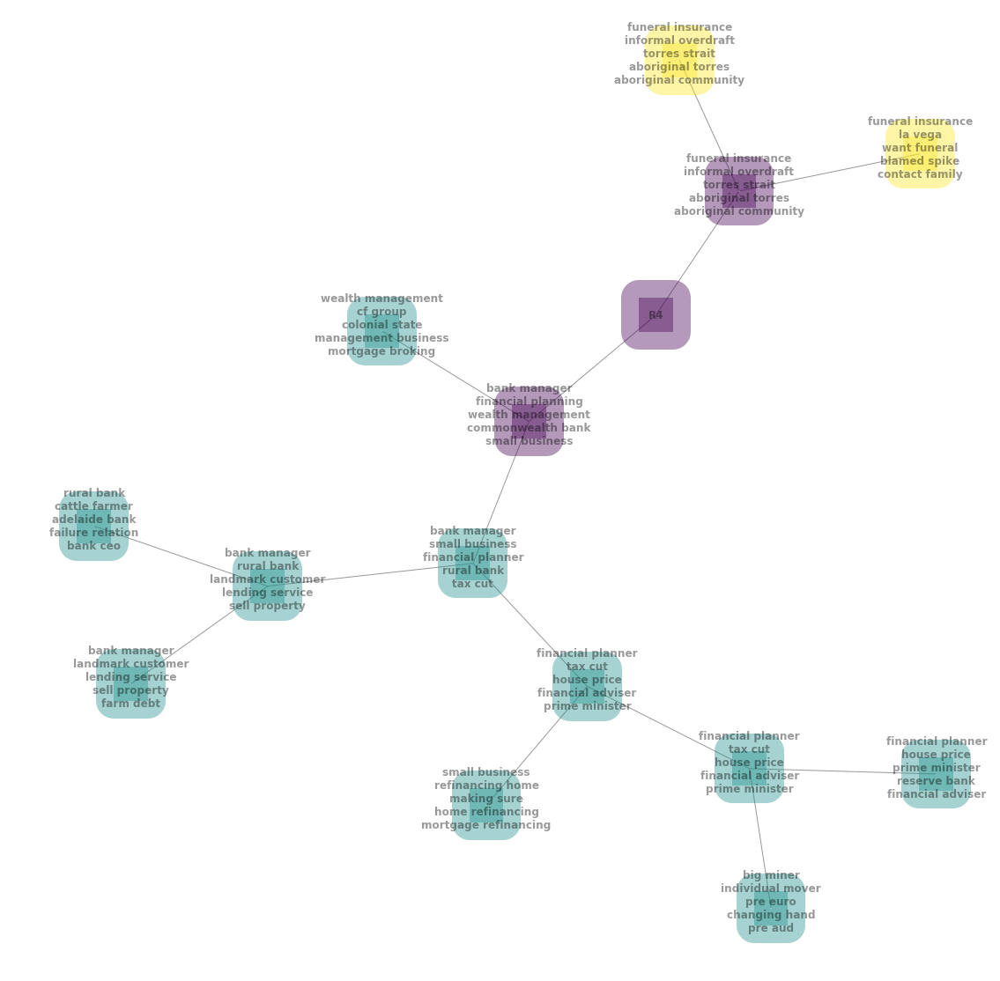

In [219]:

# Build a dataframe
df = pd.DataFrame({ 'from':[root, root, node1, node1, node2, node2, node4, node4, node5, node5, node6, node6, node12, node12], 
                'to':[node1, node2, node7, node8, node3, node4, node5, node6, node9, node10, node11, node12, node13, node14]})
df

# And a data frame with characteristics for your nodes
carac = pd.DataFrame({ 'ID':[root, node1, node2, node3, node4, node5, node6, node7, node8, node9, node10, node11, node12, node13, node14], 
                      'myvalue':['group1','group1','group1','group2','group2', 'group2', 'group2', 'group3', 'group3', 'group2', 'group2', 'group2','group2','group2', 'group2'] })

 
# Build your graph
G=nx.from_pandas_edgelist(df, 'from', 'to')

   
carac= carac.set_index('ID')
carac=carac.reindex(G.nodes())
carac['myvalue']=pd.Categorical(carac['myvalue'])
carac['myvalue'].cat.codes

# Plot it
# Graph with Custom nodes:
plt.figure(1, figsize = (15, 15))
nx.draw(G, with_labels=True, node_size=1500, node_color=carac['myvalue'].cat.codes, font_size=12, font_weight="bold", node_shape="s", alpha=0.4, linewidths=40, pos=nx.kamada_kawai_layout(G))
plt.show()


# 8.3 Results for Round 5


In [261]:
clean_content_r5 = clean_text(content_r5)
#print(clean_content[0])
#print(len(clean_content))

In [262]:
clean_content_r5 = deleteShortContent(clean_content_r5)
#print(len(clean_content))

In [222]:
X_train_vectorised_r5, feature_names_r5 = tfidf_vectorize(clean_content_r5, tokenize_stopwords_lemma_noname, (2,2))

/anaconda3/lib/python3.6/site-packages/sklearn/feature_extraction/text.py:286: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['le', 'u'] not in stop_words.



(853, 34309)


In [223]:
linkage_matrix_r5 = hierarhical_cluster(X_train_vectorised_r5, title_r5)

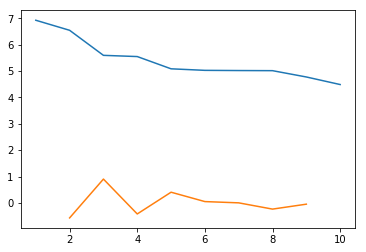

clusters: 3


In [224]:
elbow_method(linkage_matrix_r5)

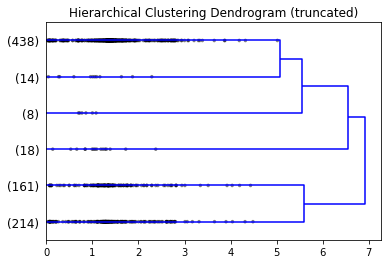

[6 2 2 4 6 6 6 6 6 3 6 6 6 2 1 1 6 1 6 6 1 1 6 1 1 1 6 2 2 6 6 2 6 1 1 3 6
 6 1 1 1 2 2 6 6 1 6 6 6 1 6 1 6 6 3 6 6 1 2 2 3 3 3 3 6 6 3 3 2 1 6 1 1 1
 6 2 6 1 5 1 6 6 2 2 6 6 2 6 1 2 1 1 6 6 1 6 2 6 1 6 2 2 6 1 1 2 1 2 1 6 6
 6 6 6 6 6 6 6 6 6 6 1 1 1 6 1 1 1 6 6 6 6 6 2 2 2 2 2 6 2 6 5 6 6 2 2 6 6
 2 5 5 6 2 6 6 1 1 1 1 6 6 6 6 6 6 6 6 6 2 6 6 6 6 6 6 6 1 6 6 6 2 6 6 6 2
 1 1 1 1 1 1 1 6 1 1 2 6 6 6 6 6 6 6 6 1 1 1 6 6 1 6 2 1 6 6 2 6 6 5 6 6 6
 2 6 6 6 6 6 6 1 6 6 6 6 3 3 6 4 5 2 6 6 6 1 6 6 6 6 6 6 6 6 6 6 6 6 2 6 2
 6 2 6 1 6 2 2 2 2 2 2 6 6 2 2 6 6 6 6 6 1 6 6 6 6 1 6 6 6 6 6 6 2 2 2 2 2
 6 2 6 6 6 1 6 6 6 1 6 2 2 6 2 6 6 6 6 6 6 2 2 6 2 2 2 2 2 6 6 2 2 6 6 6 2
 1 6 6 1 1 1 1 1 1 1 1 3 6 6 6 2 1 6 2 1 1 2 1 6 6 6 6 6 6 1 6 2 6 6 6 6 6
 2 2 6 6 6 6 6 6 2 2 6 6 1 1 1 6 1 1 1 1 1 1 6 1 1 1 1 1 1 1 1 1 1 1 1 6 6
 1 6 1 2 1 1 1 1 1 1 1 1 1 6 6 1 6 1 1 1 1 1 1 1 6 6 6 6 6 1 1 6 6 1 6 2 6
 6 6 6 1 6 6 1 6 2 6 6 6 2 3 6 6 6 1 2 1 1 6 2 6 2 6 6 1 1 1 6 6 6 1 1 1 2
 2 2 1 1 2 1 1 1 6 1 1 2 

In [228]:
clusters6_r5 = create_clusters(6, linkage_matrix_r5)

In [229]:
#get a dictionary that contains cluster names as keys and document names (index of clean_content) as values
doc_list_6_r5 = get_doc_list(clusters6_r5)

In [230]:
model_6_r5 = get_trained_model(X_train_vectorised_r5, clusters6_r5)

In [231]:
model_6_topfeatures_r5, model_6_topcoef_r5 = get_top_features(feature_names_r5, model_6_r5)

1: customer charged, nab superannuation, nab chief, nab group, abc say, asic report, advice fee, superannuation customer, service scandal, superannuation trustee, choice super, licence condition, corporate regulator, state executive, open transparent, service provided, nab executive, general manager, general advice, smart choice, executive general, charging fee, charged fee, national bank, nab wealth, enforceable undertaking, plan service, colonial state, service fee, fee service
2: catholic superannuation, regulation authority, australian prudential, pacific hydro, prudential regulation, independent director, default fund, superannuation trustee, amp superannuation, pub test, general reserve, energy super, australian family, australian open, member fund, amp super, tax surplus, negative return, service industry, new daily, administration fee, misconduct banking, industry super, banking superannuation, catholic super, superannuation financial, fund member, industry fund, superannuation

In [232]:
plot_top_features(model_6_topfeatures_r5, model_6_topcoef_r5)

In [235]:
create_input_file(clean_content_r5, doc_list_6_r5, 6)

In [ ]:
stage_1(6)
stage_2(6)
stage_3(6)

In [237]:
stage_4(6)

Cluster 1
**excerpts:** A Commonwealth Bank subsidiary has kept commissions on superannuation accounts that are meant to be free of the charge, an inquiry has heard. The banking royal commission also heard Colonial First State committed, offences as soon as new MySuper laws were introduced. Financial advisers have complained that Colonial First State has retained trailing commissions if there is no longer any adviser listed on the account, while describing the products as commission-free. The royal commission heard Colonial would just hang on to the commission. Some of the super products have a trailing commission built into the fee and some members do not have a linked adviser, the inquiry heard on Tuesday. Colonial executive general manager Linda Elkins said the issue has not been resolved but is under review.

**keywords:** the australian securities and investments commission, wa of the superannuation industry ( supervision ) act, the superannuation industry supervision ( sis ) act,

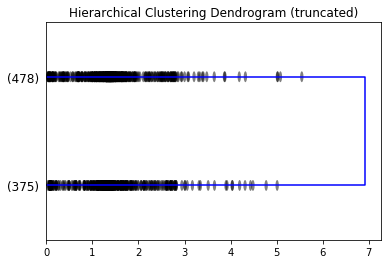

[2 1 1 2 2 2 2 2 2 2 2 2 2 1 1 1 2 1 2 2 1 1 2 1 1 1 2 1 1 2 2 1 2 1 1 2 2
 2 1 1 1 1 1 2 2 1 2 2 2 1 2 1 2 2 2 2 2 1 1 1 2 2 2 2 2 2 2 2 1 1 2 1 1 1
 2 1 2 1 2 1 2 2 1 1 2 2 1 2 1 1 1 1 2 2 1 2 1 2 1 2 1 1 2 1 1 1 1 1 1 2 2
 2 2 2 2 2 2 2 2 2 2 1 1 1 2 1 1 1 2 2 2 2 2 1 1 1 1 1 2 1 2 2 2 2 1 1 2 2
 1 2 2 2 1 2 2 1 1 1 1 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 1 2 2 2 1 2 2 2 1
 1 1 1 1 1 1 1 2 1 1 1 2 2 2 2 2 2 2 2 1 1 1 2 2 1 2 1 1 2 2 1 2 2 2 2 2 2
 1 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 1 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 1
 2 1 2 1 2 1 1 1 1 1 1 2 2 1 1 2 2 2 2 2 1 2 2 2 2 1 2 2 2 2 2 2 1 1 1 1 1
 2 1 2 2 2 1 2 2 2 1 2 1 1 2 1 2 2 2 2 2 2 1 1 2 1 1 1 1 1 2 2 1 1 2 2 2 1
 1 2 2 1 1 1 1 1 1 1 1 2 2 2 2 1 1 2 1 1 1 1 1 2 2 2 2 2 2 1 2 1 2 2 2 2 2
 1 1 2 2 2 2 2 2 1 1 2 2 1 1 1 2 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 2
 1 2 1 1 1 1 1 1 1 1 1 1 1 2 2 1 2 1 1 1 1 1 1 1 2 2 2 2 2 1 1 2 2 1 2 1 2
 2 2 2 1 2 2 1 2 1 2 2 2 1 2 2 2 2 1 1 1 1 2 1 2 1 2 2 1 1 1 2 2 2 1 1 1 1
 1 1 1 1 1 1 1 1 2 1 1 1 

In [238]:
# 2 clusters 
#create cluster of 2
clusters_2_r5 = create_clusters(2, linkage_matrix_r5)

In [239]:
#train logistic regression model
model_2_r5 = get_trained_model(X_train_vectorised_r5, clusters_2_r5)
model_2_topfeatures_r5, model_2_topcoef_r5 = get_top_features_binary(feature_names_r5, model_2_r5)

1: super fund, fee service, service fee, fund member, superannuation fund, industry fund, colonial state, superannuation trustee, plan service, catholic super, enforceable undertaking, industry super, senior assisting, administration fee, nab wealth, superannuation financial, general manager, service provided, charged fee, best member, amp super, national bank, banking superannuation, charging fee, new daily, fee charged, executive general, misconduct banking, member fund, default fund, nab executive, service industry, tax surplus, smart choice, regulation authority, prudential regulation, super account, raised question, australian open, general advice, advice fee, negative return, australian prudential, board meeting, member account, superannuation customer, financial adviser, open transparent, energy super, australian family
2: prime minister, financial institution, net profit, class action, second half, reserve bank, service sector, new zealand, banking sector, corporate governance,

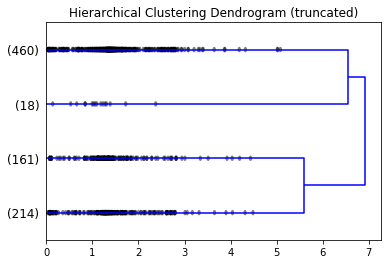

[4 2 2 4 4 4 4 4 4 3 4 4 4 2 1 1 4 1 4 4 1 1 4 1 1 1 4 2 2 4 4 2 4 1 1 3 4
 4 1 1 1 2 2 4 4 1 4 4 4 1 4 1 4 4 3 4 4 1 2 2 3 3 3 3 4 4 3 3 2 1 4 1 1 1
 4 2 4 1 4 1 4 4 2 2 4 4 2 4 1 2 1 1 4 4 1 4 2 4 1 4 2 2 4 1 1 2 1 2 1 4 4
 4 4 4 4 4 4 4 4 4 4 1 1 1 4 1 1 1 4 4 4 4 4 2 2 2 2 2 4 2 4 4 4 4 2 2 4 4
 2 4 4 4 2 4 4 1 1 1 1 4 4 4 4 4 4 4 4 4 2 4 4 4 4 4 4 4 1 4 4 4 2 4 4 4 2
 1 1 1 1 1 1 1 4 1 1 2 4 4 4 4 4 4 4 4 1 1 1 4 4 1 4 2 1 4 4 2 4 4 4 4 4 4
 2 4 4 4 4 4 4 1 4 4 4 4 3 3 4 4 4 2 4 4 4 1 4 4 4 4 4 4 4 4 4 4 4 4 2 4 2
 4 2 4 1 4 2 2 2 2 2 2 4 4 2 2 4 4 4 4 4 1 4 4 4 4 1 4 4 4 4 4 4 2 2 2 2 2
 4 2 4 4 4 1 4 4 4 1 4 2 2 4 2 4 4 4 4 4 4 2 2 4 2 2 2 2 2 4 4 2 2 4 4 4 2
 1 4 4 1 1 1 1 1 1 1 1 3 4 4 4 2 1 4 2 1 1 2 1 4 4 4 4 4 4 1 4 2 4 4 4 4 4
 2 2 4 4 4 4 4 4 2 2 4 4 1 1 1 4 1 1 1 1 1 1 4 1 1 1 1 1 1 1 1 1 1 1 1 4 4
 1 4 1 2 1 1 1 1 1 1 1 1 1 4 4 1 4 1 1 1 1 1 1 1 4 4 4 4 4 1 1 4 4 1 4 2 4
 4 4 4 1 4 4 1 4 2 4 4 4 2 3 4 4 4 1 2 1 1 4 2 4 2 4 4 1 1 1 4 4 4 1 1 1 2
 2 2 1 1 2 1 1 1 4 1 1 2 

In [240]:
# 4 clusters 
#create cluster of 4
clusters_4_r5 = create_clusters(4, linkage_matrix_r5)

In [241]:
#train logistic regression model
model_4_r5 = get_trained_model(X_train_vectorised_r5, clusters_4_r5)
model_4_topfeatures_r5, model_4_topcoef_r5 = get_top_features(feature_names_r5, model_4_r5)

1: customer charged, nab superannuation, nab chief, nab group, advice fee, abc say, superannuation customer, asic report, superannuation trustee, service scandal, choice super, licence condition, state executive, corporate regulator, open transparent, service provided, nab executive, general manager, smart choice, executive general, general advice, charging fee, charged fee, national bank, nab wealth, enforceable undertaking, plan service, colonial state, service fee, fee service
2: catholic superannuation, regulation authority, australian prudential, superannuation trustee, pacific hydro, prudential regulation, independent director, default fund, amp superannuation, pub test, general reserve, energy super, australian family, australian open, member fund, amp super, tax surplus, negative return, service industry, new daily, administration fee, misconduct banking, industry super, banking superannuation, catholic super, superannuation financial, fund member, industry fund, superannuation

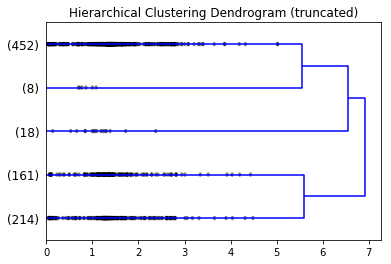

[5 2 2 4 5 5 5 5 5 3 5 5 5 2 1 1 5 1 5 5 1 1 5 1 1 1 5 2 2 5 5 2 5 1 1 3 5
 5 1 1 1 2 2 5 5 1 5 5 5 1 5 1 5 5 3 5 5 1 2 2 3 3 3 3 5 5 3 3 2 1 5 1 1 1
 5 2 5 1 5 1 5 5 2 2 5 5 2 5 1 2 1 1 5 5 1 5 2 5 1 5 2 2 5 1 1 2 1 2 1 5 5
 5 5 5 5 5 5 5 5 5 5 1 1 1 5 1 1 1 5 5 5 5 5 2 2 2 2 2 5 2 5 5 5 5 2 2 5 5
 2 5 5 5 2 5 5 1 1 1 1 5 5 5 5 5 5 5 5 5 2 5 5 5 5 5 5 5 1 5 5 5 2 5 5 5 2
 1 1 1 1 1 1 1 5 1 1 2 5 5 5 5 5 5 5 5 1 1 1 5 5 1 5 2 1 5 5 2 5 5 5 5 5 5
 2 5 5 5 5 5 5 1 5 5 5 5 3 3 5 4 5 2 5 5 5 1 5 5 5 5 5 5 5 5 5 5 5 5 2 5 2
 5 2 5 1 5 2 2 2 2 2 2 5 5 2 2 5 5 5 5 5 1 5 5 5 5 1 5 5 5 5 5 5 2 2 2 2 2
 5 2 5 5 5 1 5 5 5 1 5 2 2 5 2 5 5 5 5 5 5 2 2 5 2 2 2 2 2 5 5 2 2 5 5 5 2
 1 5 5 1 1 1 1 1 1 1 1 3 5 5 5 2 1 5 2 1 1 2 1 5 5 5 5 5 5 1 5 2 5 5 5 5 5
 2 2 5 5 5 5 5 5 2 2 5 5 1 1 1 5 1 1 1 1 1 1 5 1 1 1 1 1 1 1 1 1 1 1 1 5 5
 1 5 1 2 1 1 1 1 1 1 1 1 1 5 5 1 5 1 1 1 1 1 1 1 5 5 5 5 5 1 1 5 5 1 5 2 5
 5 5 5 1 5 5 1 5 2 5 5 5 2 3 5 5 5 1 2 1 1 5 2 5 2 5 5 1 1 1 5 5 5 1 1 1 2
 2 2 1 1 2 1 1 1 5 1 1 2 

In [242]:
# 5 clusters 
#create cluster of 5
clusters_5_r5 = create_clusters(5, linkage_matrix_r5)

In [243]:
#train logistic regression model
model_5_r5 = get_trained_model(X_train_vectorised_r5, clusters_5_r5)
model_5_topfeatures_r5, model_5_topcoef_r5 = get_top_features(feature_names_r5, model_5_r5)

1: customer charged, nab superannuation, nab chief, nab group, asic report, advice fee, abc say, superannuation customer, service scandal, superannuation trustee, choice super, licence condition, state executive, corporate regulator, open transparent, service provided, nab executive, general manager, general advice, smart choice, executive general, charging fee, charged fee, national bank, nab wealth, enforceable undertaking, plan service, colonial state, service fee, fee service
2: catholic superannuation, regulation authority, australian prudential, pacific hydro, independent director, superannuation trustee, prudential regulation, default fund, amp superannuation, pub test, general reserve, energy super, australian family, australian open, member fund, amp super, tax surplus, negative return, service industry, new daily, administration fee, misconduct banking, industry super, banking superannuation, catholic super, superannuation financial, fund member, industry fund, superannuation

In [244]:
root = 'R5'

node1 = ''
for i in range(5):
    temp = model_2_topfeatures_r5[0][i] + '\n'
    node1 = node1 + temp    
print(node1)

node2 = ''
for i in range(5):
    temp = model_2_topfeatures_r5[1][i] + '\n'
    node2 = node2 + temp   
print(node2)

node3 = ''
for i in range(5):
    temp = model_4_topfeatures_r5[0][i] + '\n'
    node3 = node3 + temp   
print(node3)

node4 = ''
for i in range(5):
    temp = model_4_topfeatures_r5[1][i] + '\n'
    node4 = node4 + temp 
print(node4)

node5 = ''
for i in range(5):
    temp = model_4_topfeatures_r5[2][i] + '\n'
    node5 = node5 + temp  
print(node5)

node6 = ''
for i in range(5):
    temp = model_4_topfeatures_r5[3][i] + '\n'
    node6 = node6 + temp
print(node6)

node7 = ''
for i in range(5):
    temp = model_5_topfeatures_r5[3][i] + '\n'
    node7 = node7 + temp  
print(node7)

node8 = ''
for i in range(5):
    temp = model_5_topfeatures_r5[4][i] + '\n'
    node8 = node8 + temp 
    
node8 = node8 + ' '
print(node8)

node9 = ''
for i in range(5):
    temp = model_6_topfeatures_r5[4][i] + '\n'
    node9 = node9 + temp    
print(node9)

node10 = ''
for i in range(5):
    temp = model_6_topfeatures_r5[5][i] + '\n'
    node10 = node10 + temp    
print(node10)

super fund
fee service
service fee
fund member
superannuation fund

prime minister
financial institution
net profit
class action
second half

fee service
service fee
colonial state
plan service
enforceable undertaking

super fund
superannuation fund
industry fund
fund member
superannuation financial

event financial
challenged reputation
underlying profit
continue monitor
stabilise business

prime minister
financial institution
reserve bank
class action
service sector

prior written
financial product
value estimate
tailored situation
pty abn

prime minister
financial institution
reserve bank
banking sector
service sector
 
governance compliance
ensure asic
service minister
minister o'dwyer
financial institution

prime minister
reserve bank
banking sector
class action
financial sector



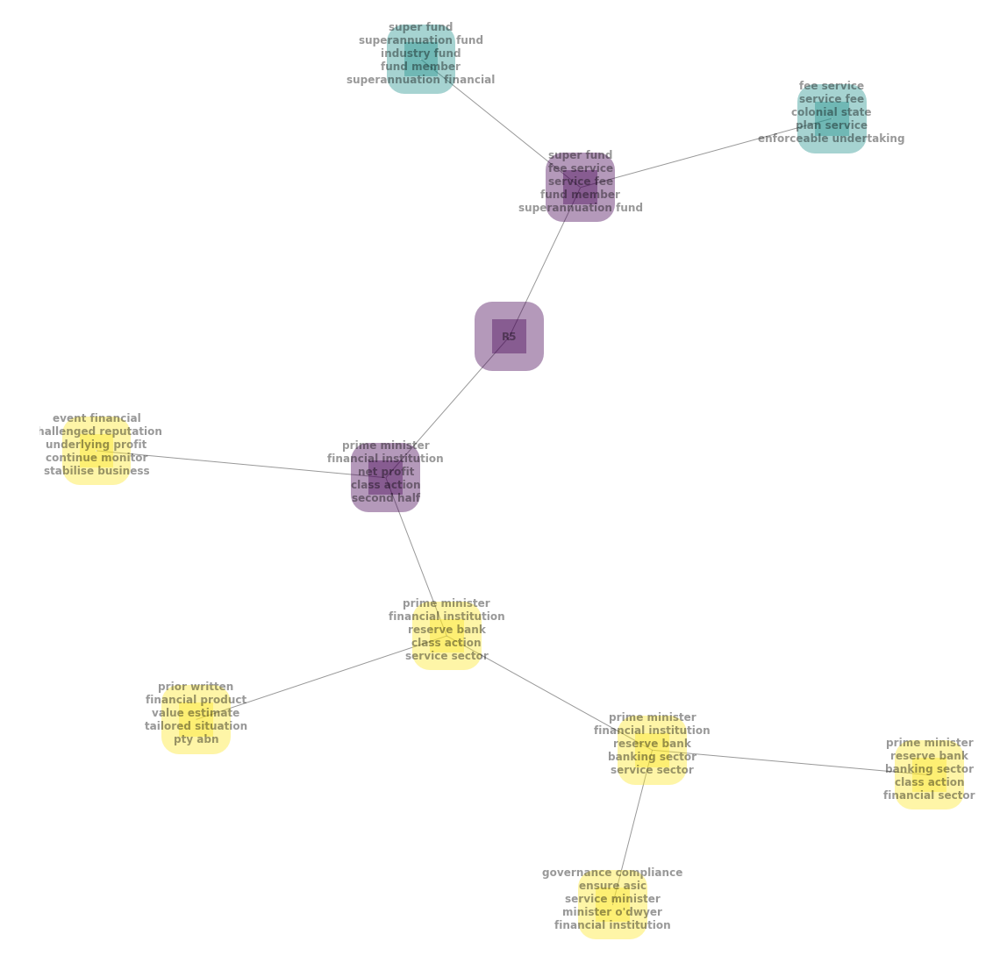

In [245]:

# Build a dataframe
df = pd.DataFrame({ 'from':[root, root, node1, node1, node2, node2, node6, node6, node8, node8], 
                'to':[node1, node2, node3, node4, node5, node6, node7, node8, node9, node10]})
df

# And a data frame with characteristics for your nodes
carac = pd.DataFrame({ 'ID':[root, node1, node2, node3, node4, node5, node6, node7, node8, node9, node10], 
                      'myvalue':['group1','group1','group1','group2','group2', 'group3', 'group3', 'group3', 'group3', 'group3', 'group3'] })

 
# Build your graph
G=nx.from_pandas_edgelist(df, 'from', 'to')

   
carac= carac.set_index('ID')
carac=carac.reindex(G.nodes())
carac['myvalue']=pd.Categorical(carac['myvalue'])
carac['myvalue'].cat.codes

# Plot it
# Graph with Custom nodes:
plt.figure(1, figsize = (15, 15))
nx.draw(G, with_labels=True, node_size=1500, node_color=carac['myvalue'].cat.codes, font_size=12, font_weight="bold", node_shape="s", alpha=0.4, linewidths=40, pos=nx.kamada_kawai_layout(G))
plt.show()
